In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.rendered_html { font-size: 20px; font-family: Calibri; }</style>"))

This notebook contains code used for data analysis and to create figures for the paper in Nature Climate Change: Karmalkar and Horton, 2021. Please contact Ambarish Karmalkar (akarmalkar AT geo.umass.edu) for information on how to run this notebook and for any supporting code you may need.

### Quick links<a id="outline"></a>

Main Figures:
1. [Exceptionality](#Figure1)
2. [SST-PC2](#Figure2)
3. [SST-Z500 MCA](#Figure3)
4. [Regressions](#Figure4)
5. [CMIP6 Analysis](#Figure5)

Extended Data Figures:
1. [NHEM SAT Trends](#ExtendedData_Fig1)
2. [Tropospheric temperature trends](#ExtendedData_Fig2)

Supplementary Figures:<br>
[1](#Supp_Fig1), [2](#Supp_Fig2), [3](#Supp_Fig3), [4](#Supp_Fig4), [5](#Supp_Fig5), [6](#Supp_Fig6), [7](#Supp_Fig7), [8](#Supp_Fig8), [9](#Supp_Fig9), [10](#Supp_Fig10), [11](#Supp_Fig11)

In [2]:
# Load basic modules:
import os, copy, fnmatch, pdb, string, time
import pickle #dill as pickle
import iris
import iris.analysis.stats
import iris.quickplot as qplt
import iris.coord_categorisation
import numpy as np
import scipy
import matplotlib
import matplotlib.pyplot as plt
import iris.plot as iplt
%matplotlib inline
import iris.quickplot as iplt
import cartopy.crs as ccrs
import cartopy.feature as cfeature  
import cf_units as unit
from scipy import stats

import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from shapely.geometry.polygon import LinearRing
import cartopy.io.img_tiles as cimgt

import brewer2mpl
from brewer2mpl import diverging

map_quest_aerial = cimgt.MapQuestOpenAerial()

#import ensutils
import ensutils3 as ensutils
from ensutils import qumpy
import qumpy.irislib as mylib
from ensutils import plot_spatial_contourf as epsc
from ensutils import calc_seasonal_mean

import generalUtils as utls
import cmip5Utils as cmip5U

from pylab import cm

import manageobs
from importlib import reload

import warnings
warnings.filterwarnings('ignore')
#warnings.simplefilter('ignore')

from scipy.stats import norm
from scipy.stats.kde import gaussian_kde
import pymannkendall as mk

### Data Analysis

In [3]:
# Region names
import cesmleUtils as leu
reload(leu)
reload(utls)

regCtrNEBOX    = utls.getLatLonCtr(utls.reg2bbox['NEBOX'])
regCtrNE4      = utls.getLatLonCtr(utls.reg2bbox['Northeast4'])
regCtrCONUSNAT = utls.getLatLonCtr(utls.reg2bbox['CONUSNAT'])
regCtrENA      = utls.getLatLonCtr(utls.reg2bbox['ENA'])
regCtrENA2     = utls.getLatLonCtr(utls.reg2bbox['ENA2'])
regCtrNHEM     = utls.getLatLonCtr(utls.reg2bbox['NHEM'])

In [4]:
figPath          = '/Users/akarma/Dropbox/home/Articles/KarmalkarHorton21_NCC/Revisions2_NCC/figures'
externalDataPath = '/Users/akarma/Dropbox/home/Articles/KarmalkarHorton21_NCC/externalData'

In [5]:
from matplotlib.ticker import AutoMinorLocator
def showlatlons(ax, lons=[-80, -75,-70,-65,-60], lats=[30,35,40,45,50]):
    ax.set_xticks(lons, crs=ccrs.PlateCarree())
    ax.set_yticks(lats, crs=ccrs.PlateCarree())
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    lon_formatter = LONGITUDE_FORMATTER #(degree_symbol='', dateline_direction_label=True)
    lat_formatter = LATITUDE_FORMATTER #(degree_symbol='')
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)

### Load Natural Modes of Variability

In [6]:
import manageobs
reload(manageobs)
natmodes = manageobs.load_natural_modes()
natmodes.prepare_modes()

LOADED: mei, 1950-2016

LOADED: oni, 1950-2020

LOADED: amo, 1856-2019

LOADED: amosm, 1856-2019

LOADED: nao, 1865-2020

LOADED: ao, 1950-2019

LOADED: ipo, 1854-2020

LOADED: pdo, 1900-2017

LOADED: pna, 1950-2019

dir(natmodes): 
 dict_keys(['MEI', 'ONI', 'AMO', 'AMOC', 'NAO', 'AO', 'IPO', 'PDO', 'PNA', 'modeNames'])
MEI
ONI
AMO
AMOC
NAO
AO
IPO
PDO
PNA
dir(natmodes.modes): 
 dict_keys(['MEI', 'ONI', 'AMO', 'AMOC', 'NAO', 'AO', 'IPO', 'PDO', 'PNA', 'modeNames', 'modes', 'seasons', 'years'])


##### Load Caesar et al. (2018) AMOC data

In [7]:
reload(manageobs)
amocInfo = manageobs.load_amoc_CaesarEtAl18_RahmstorfEtAl15()
amocInfo.__dict__

LOADED: Gulf Stream (.gs) and Subpolar Gyre (.sg) HadISST Indices 1871-2016
From Caesar et al. (2018): http://www.pik-potsdam.de/~caesar/AMOC_slowdown/

LOADED: AMOC Index 900-1995
From Rahmstorf et al. (2015) Fig. 3c: http://www.pik-potsdam.de/~stefan/amoc_index_data.html



{'gs_file': '/Volumes/WD2T/data/obs/climate_indices/CaesarEtAl18_NAT/gulfstream_index_hadisst.txt',
 'sg_file': '/Volumes/WD2T/data/obs/climate_indices/CaesarEtAl18_NAT/sg_index_hadisst.txt',
 'source': 'http://www.pik-potsdam.de/~caesar/AMOC_slowdown/',
 'amoc_yrs': array([1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880, 1881,
        1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889, 1890, 1891, 1892,
        1893, 1894, 1895, 1896, 1897, 1898, 1899, 1900, 1901, 1902, 1903,
        1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911, 1912, 1913, 1914,
        1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925,
        1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936,
        1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947,
        1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958,
        1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969,
        1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979,

## Load Data #loaddata +++++++++++++++

In [8]:
baseline = [1951, 1980] # this what the baseline for BEST is
syr = 1901
eyr = 2018
yrarr = np.arange(syr, eyr+1, 1)

In [9]:
obsAbbr2Full = {'ncg':'nClimGrid', 'cru':'CRU', 'best':'BEST', '20cr':'20CRv3', 'hadisst':'HadISST', 'ersst':'ERSST'}

### SST - ERSST, HadISST

In [10]:
# Load data
reload(manageobs)
hadisst0 = manageobs.load_sst('hadisst')
ersst0   = manageobs.load_sst('ersst', version=5)

ersst    = ensutils.extract_years(ersst0,    syr, eyr)
hadisst  = ensutils.extract_years(hadisst0,  syr, eyr)

ersstFull    = ensutils.extract_years(ersst0,    1871, 2018)
hadisstFull  = ensutils.extract_years(hadisst0,  1871, 2018)

Loading: /Volumes/WD2T/data/obs/sst/HadISST_sst.nc
Processing sea_surface_temperature
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
No need to guess bounds for t
SST hadisst data from: 1870-01-16 12:00:00 - 2019-01-16 12:00:00
Loading: /Volumes/WD2T/data/obs/sst/ERSST.sst.mnmean.v5.nc
Processing Monthly Means of Sea Surface Temperature
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
No need to guess bounds for t
SST ersst data from: 1854-01-16 00:00:00 - 2019-03-16 00:00:00


### SAT - Berkeley, CRU, nClimGrid

#### nClimGrid

In [11]:
#
reload(manageobs)
# nclimgrid
seasonList = ['ANN','DJF','MAM','MJJ','JJ', 'JJA','SON']
neCtr = utls.getLatLonCtr(utls.reg2bbox['Northeast4'])
tas_ncg,  tas_sea_ncg  = manageobs.load_nclimgrid_reg('tavg', years=[syr, eyr], regCtr=neCtr, seasons=seasonList)
tmax_ncg, tmax_sea_ncg = manageobs.load_nclimgrid_reg('tmax', years=[syr, eyr], regCtr=neCtr, seasons=seasonList)
tmin_ncg, tmin_sea_ncg = manageobs.load_nclimgrid_reg('tmin', years=[syr, eyr], regCtr=neCtr, seasons=seasonList)

Loading: /Volumes/WD2T/data/obs/nclimgrid/nclimgrid_tavg.nc
Processing unknown
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Bounds guessed for t
tas nclimgrid data from: 1895-01-01 00:00:00 - 2019-06-01 00:00:00
Loading full CONUS data. Likely to slow down computation
Loading: /Volumes/WD2T/data/obs/nclimgrid/nclimgrid_tmax.nc
Processing unknown
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Bounds guessed for t
tas nclimgrid data from: 1895-01-01 00:00:00 - 2019-09-01 00:00:00
Loading full CONUS data. Likely to slow down computation
Loading: /Volumes/WD2T/data/obs/nclimgrid/nclimgrid_tmin.nc
Processing unknown
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Bounds guessed for t
tas nclimgrid data from: 1895-01-01 00:00:00 - 2019-09-01 00:00:00
Loading full CONUS data. Likely to slow down computation


In [12]:
iris.coord_categorisation.add_year(tas_ncg, 'time', name='year')
iris.coord_categorisation.add_month_number(tas_ncg, 'time', name='month_number')
mylib.tidy_cubes(tas_ncg, guess_bounds=True)

Processing unknown
No need to guess bounds for x
No need to guess bounds for y
Does not have coordinate for z
No need to guess bounds for t


In [13]:
# Calculate seasonal mean anomalies for JJA
season = 'JJA'
cube = tas_sea_ncg[season]
clim = ensutils.extract_years(cube, baseline[0], baseline[1]).collapsed('time', iris.analysis.MEAN)
tas_sea_anom_ncg = cube - clim; del cube, clim

cube = tmax_sea_ncg[season]
clim = ensutils.extract_years(cube, baseline[0], baseline[1]).collapsed('time', iris.analysis.MEAN)
tmax_sea_anom_ncg = cube - clim; del cube, clim

cube = tmin_sea_ncg[season]
clim = ensutils.extract_years(cube, baseline[0], baseline[1]).collapsed('time', iris.analysis.MEAN)
tmin_sea_anom_ncg = cube - clim; del cube, clim

#### BEST

In [14]:
reload(manageobs)
# best
bestAnom, bestClim, bestLmask, bestOmask = manageobs.load_berkeley('tas')

Loading: /Volumes/WD2T/data/obs/best/tas/Land_and_Ocean_LatLong1.nc
Processing surface_temperature_anomaly
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Bounds guessed for t
Processing Air Surface Temperature Climatology (Jan 1951 - Dec 1980)
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Does not have coordinate for t
Processing Land Mask
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Does not have coordinate for t
Processing Land Mask
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Does not have coordinate for t
SAT, Berkeley Earth, data from: 1850-01-16 00:00:00 - 2018-12-16 00:00:00


#### CRU

In [15]:
reload(manageobs)
# cru
cru = manageobs.load_tas('cru', version=4)

Loading: /Volumes/WD2T/data/obs/cru/tmp/cru_ts4.03.1901.2018.tmp.dat.nc
Processing unknown
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Bounds guessed for t
tas cru data from: 1901-01-16 00:00:00 - 2018-12-16 00:00:00


In [16]:
cube = ensutils.calc_seasonal_mean_local(cru, 'JJA', verbose=False)[1]
clim = ensutils.extract_years(cube, baseline[0], baseline[1]).collapsed('time', iris.analysis.MEAN)
tas_sea_anom_cru = cube - clim; del cube, clim

### 20CRv3

In [17]:
syr = 1901
eyr = 2015

In [18]:
# Create or load pickled file with 20CRv3 data
reload(manageobs)
# NOTE: don't add qnet to this list
varList = ['tas','z500','u500','v500','uw10','vw10','shfl','lhfl','dswsfl','dlwsfl','uswsfl','ulwsfl',\
           'z850','z250','psl','pr','clt','shum','ta_p','sh_p','u850','v850','u250','v250','omega']
savePkl = False
if savePkl:
    #varList = ['tas','z500','psl','pr','shfl','lhfl','swsfl','lwsfl','clt','ta_p','sh_p','uw10','vw10','u500','v500','z250','u250','v250']
    data20cr = manageobs.load_20cr_all(varList, years=[syr, eyr])
    lsm_20cr = manageobs.load_20cr('lsm')

    ## Q_net positive downward
    ## Qnet = Net downward SW - net upward LW - (Sensible hfl + Latent hfl)
    ##      = (SW downward - SW upward) - (LW upward - LW downward) - (Sensible hfl + Latent hfl)
    ##      = (term1 - term2) - (term3 - term4) - (term5 + term6)
    if 'uswsfl' in varList:
        qnet = ( data20cr['dswsfl'] - data20cr['uswsfl']) -\
               ( data20cr['ulwsfl'] - data20cr['dlwsfl']) -\
               ( data20cr['shfl']   + data20cr['lhfl'])

        qnet.long_name = 'qnet_upward_surface'
        data20cr.setdefault('qnet', qnet)
        varList.append('qnet')

    # open a file, where you ant to store the data
    file = open('/Volumes/WD2T/data/obs/20CRv3/data20cr.pkl', 'wb')

    # dump information to that file
    pickle.dump(data20cr, file)

    # close the file
    file.close()
else:
    # open a file, where you ant to store the data
    file = open('/Volumes/WD2T/data/obs/20CRv3/data20cr.pkl', 'rb')
    data20cr = pickle.load(file)
    file.close()


Original File: /Volumes/WD2T/data/obs/20CRv3/land.nc
Processing land_area_fraction
Bounds guessed for x
Bounds guessed for y
Does not have coordinate for z
Cannot guess bounds for t as length 1. Skipping
land_area_fraction lsm (1, 181, 360)
DimCoord([1836-01-16 00:00:00], standard_name='time', calendar='gregorian', long_name='Time', var_name='time', attributes={'actual_range': array([315552., 315552.]), 'coordinate_defines': 'point', 'delta_t': '0000-00-00 03:00:00'})
DimCoord([1836-01-16 00:00:00], standard_name='time', calendar='gregorian', long_name='Time', var_name='time', attributes={'actual_range': array([315552., 315552.]), 'coordinate_defines': 'point', 'delta_t': '0000-00-00 03:00:00'})


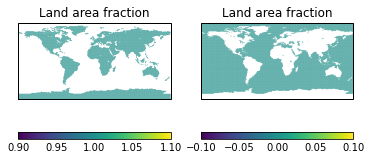

In [19]:
lsm_20cr = manageobs.load_20cr('lsm')
lsm_20cr_land = copy.deepcopy(lsm_20cr)
lsm_20cr_land.data = np.ma.masked_equal(lsm_20cr_land.data, 0)
lsm_20cr_ocean = copy.deepcopy(lsm_20cr)
lsm_20cr_ocean.data = np.ma.masked_equal(lsm_20cr_ocean.data, 1)
ax = plt.subplot(121); iplt.pcolor(lsm_20cr_land)
ax = plt.subplot(122); iplt.pcolor(lsm_20cr_ocean)

In [20]:
# Calculate and creaste seasonal mean directories
reload(utls)
reload(ensutils)
#syr = 1895
#eyr = 2015
regCtr = regCtrCONUSNAT
baseline = [1951, 1980]

#varList = ['tas','z500','psl','pr','shfl','lhfl','qnet','ta_p','uw10','vw10','u850','v850','u500','v500','z250','u250','v250','dswsfl','dlwsfl','uswsfl','ulwsfl']
#varList = ['tas','z500','psl','shfl','lhfl','qnet','ta_p','uw10','vw10','u850','v850','u500','v500','z250','u250','v250','omega']
varList = ['tas','z500','qnet','ta_p','uw10','vw10','u850','v850','u500','v500','omega']

data20cr_sea_absl_dict = {}
data20cr_sea_clim_dict = {}
data20cr_sea_anom_dict = {}
for var in varList: #data20cr.keys():
    print(var)
    sea_absl_dict = {}
    sea_clim_dict = {}
    sea_anom_dict = {}
    for season in ['ANN','DJF','MAM','JJA','SON']: #['ANN','DJF','MAM','MJJ','JJA','SON']:  #'MJJ','JJA','JAS','ASO','SON','WARM'
        cube          = data20cr[var]
        #cube          = ensutils.extract_years(cube, syr, eyr, sday=1)
        cube_sea_absl = ensutils.calc_seasonal_mean_local(cube, season, verbose=False)[1]
        cube_sea_clim = ensutils.extract_years(cube_sea_absl, baseline[0], baseline[1]).collapsed('time', iris.analysis.MEAN)
        cube_sea_anom = cube_sea_absl - cube_sea_clim
        if regCtr:
            cube_sea_absl = cube_sea_absl.extract(regCtr)
            cube_sea_clim = cube_sea_clim.extract(regCtr)
            cube_sea_anom = cube_sea_anom.extract(regCtr)

        sea_absl_dict.setdefault(season, cube_sea_absl)
        sea_clim_dict.setdefault(season, cube_sea_clim)
        sea_anom_dict.setdefault(season, cube_sea_anom)
        del cube, cube_sea_clim, cube_sea_anom, cube_sea_absl
    
    data20cr_sea_absl_dict.setdefault(var, sea_absl_dict)
    data20cr_sea_clim_dict.setdefault(var, sea_clim_dict)
    data20cr_sea_anom_dict.setdefault(var, sea_anom_dict)

tas
z500
qnet
ta_p
uw10
vw10
u850
v850
u500
v500
omega


In [21]:
# qnet is defined as (downward minus upward), so multiply by *-1.0 to get upward positive
for season in ['ANN','DJF','JJA']: #['ANN','DJF','MAM','MJJ','JJA','SON']:
    data20cr_sea_absl_dict['qnet'][season] *= -1.0
    data20cr_sea_clim_dict['qnet'][season] *= -1.0
    data20cr_sea_anom_dict['qnet'][season] *= -1.0

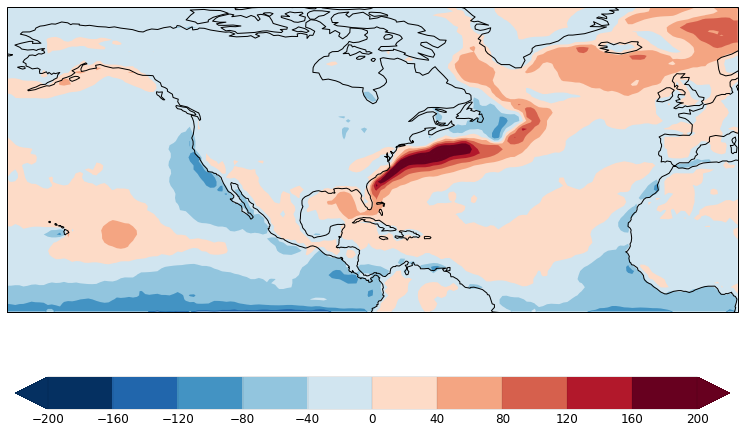

In [22]:
fig = plt.figure(figsize=(16,8)); kk = 1
ncolors = 11; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend='both'; ft=14
clev1 = np.linspace( -200, 200, ncolors )
ax = plt.subplot(111, projection=ccrs.PlateCarree()) #ccrs.Mollweide(central_longitude=-45.))
cf = epsc( data20cr_sea_absl_dict['qnet']['ANN'][-4], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, pcolor=False, title='', ftsize=ft)
kk+=1

In [23]:
# NEHM for select fields.
reload(utls)
reload(ensutils)
regCtr = regCtrNHEM
baseline = [1951, 1980]

#varList = ['tas','z500','psl','pr','shfl','lhfl','qnet','ta_p','uw10','vw10','u850','v850','u500','v500','z250','u250','v250','dswsfl','dlwsfl','uswsfl','ulwsfl']
varList_nhem = ['tas','z500','u500','v500','z250','u250','v250']

data20cr_nhem_sea_absl_dict = {}
data20cr_nhem_sea_clim_dict = {}
data20cr_nhem_sea_anom_dict = {}
for var in varList_nhem: #data20cr.keys():
    print(var)
    sea_absl_dict = {}
    sea_clim_dict = {}
    sea_anom_dict = {}
    for season in ['ANN','DJF','MAM','JJA','SON']:
        cube          = data20cr[var]
        #cube          = ensutils.extract_years(cube, syr, eyr, sday=1)
        cube_sea_absl = ensutils.calc_seasonal_mean_local(cube, season, verbose=False)[1]
        cube_sea_clim = ensutils.extract_years(cube_sea_absl, baseline[0], baseline[1]).collapsed('time', iris.analysis.MEAN)
        cube_sea_anom = cube_sea_absl - cube_sea_clim
        if regCtr:
            cube_sea_absl = cube_sea_absl.extract(regCtr)
            cube_sea_clim = cube_sea_clim.extract(regCtr)
            cube_sea_anom = cube_sea_anom.extract(regCtr)

        sea_absl_dict.setdefault(season, cube_sea_absl)
        sea_clim_dict.setdefault(season, cube_sea_clim)
        sea_anom_dict.setdefault(season, cube_sea_anom)
        del cube, cube_sea_clim, cube_sea_anom, cube_sea_absl
    
    data20cr_nhem_sea_absl_dict.setdefault(var, sea_absl_dict)
    data20cr_nhem_sea_clim_dict.setdefault(var, sea_clim_dict)
    data20cr_nhem_sea_anom_dict.setdefault(var, sea_anom_dict)

tas
z500
u500
v500
z250
u250
v250


In [24]:
del syr, eyr

#### Adding Elevation Information

In [25]:
regCtr = regCtrNE4
ncgCube = tas_ncg[-1].extract(regCtr)

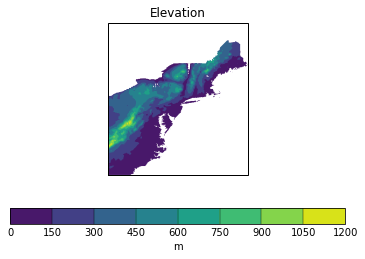

In [26]:
# Elevation information
elev = iris.load('/Users/akarma/Desktop/model_data/nClimDiv/elevation.LOCA_2016-04-02.nc')[0] # Also here: /Volumes/WD2T/data/obs/nclimgrid/
elev.coord('longitude').points = elev.coord('longitude').points - 360.
elevne = elev.extract( regCtr )
#elevne_regr = elevne.regridded( cube )
elevne_regr = elevne.regrid( ncgCube, iris.analysis.Nearest())
elevne_regr.data = np.ma.masked_less(elevne_regr.data, 0)
elevne_regr_neus = mylib.applyMask(elevne_regr, ncgCube)

iplt.contourf(elevne_regr_neus)
del ncgCube

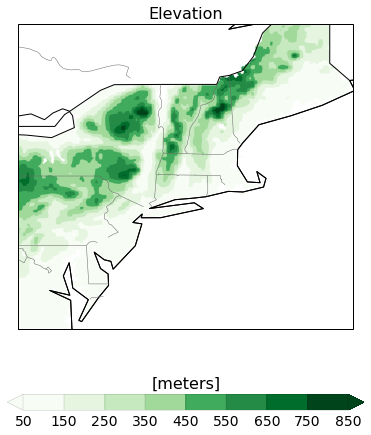

In [27]:
# Plot Elevation
fig = plt.figure( figsize=(8,8) )
ncolors = 9; col = 'Reds'; cmap = cm.get_cmap(col, ncolors); extend = 'both'; ft=16
clev1 = np.linspace( 0, 1, ncolors )
#ax = plt.subplot(1,2,1, projection=ccrs.PlateCarree()); kk+=1
#tle = 'SAT Trends %s' % season
#epsc( cube1, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, title=tle, ftsize=ft)
#utls.plotStates(ax)

ncolors = 9; col = 'Greens'; cmap = cm.get_cmap(col, ncolors); extend = 'both'; ft=16
clev1 = np.linspace( 50, 850, ncolors )
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree()); kk+=1; tle='Elevation'
#iplt.contourf(elevne_regr_neus.extract(regCtrNEBOX))
epsc( elevne_regr_neus.extract(regCtrNEBOX), ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

savePlot=False
if savePlot:
    fName = 'elev_neus'
    figName = os.path.join( figPath, fName )
    utls.quickSaveFig(fig, figName, pdf=False, tiff=False)

#### Get Northwest Shelf mask and monthly SST data

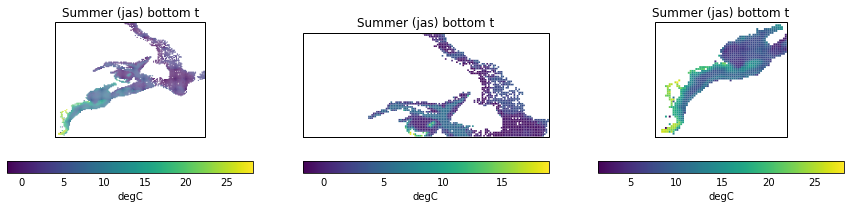

In [28]:
#
shelfCube = iris.load( os.path.join(externalDataPath, 'climatological_seasonal_mean_SST_SSS_SBT_SBS_1950_2010_gridded_243424.nc'), 'Summer (JAS) Bottom T')[0]
indnan = np.where( np.isnan(shelfCube.data)==True )
shelfCube.data[indnan] = -9999.
shelfCube.data = np.ma.masked_equal(shelfCube.data, -9999.)
#shelfCube.data = np.ma.masked_less(tmpCube.data, -9999)

regName = 'NWS'

shelfCtr       = utls.getLatLonCtr([-78, -45, 34, 59])
shelfCtr_north = utls.getLatLonCtr([-78, -47, 46, 59]) #utls.getLatLonCtr([-78, -45, 46, 59])
shelfCtr_south = utls.getLatLonCtr([-78, -64, 34, 46]) #utls.getLatLonCtr([-78, -45, 34, 45])

fig = plt.figure(figsize=(15,3))
ax = plt.subplot(131); iplt.pcolor(shelfCube.extract(shelfCtr))
ax = plt.subplot(132); iplt.pcolor(shelfCube.extract(shelfCtr_north))
ax = plt.subplot(133); iplt.pcolor(shelfCube.extract(shelfCtr_south))

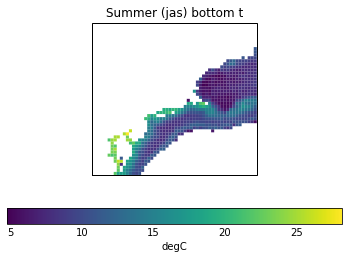

In [29]:
iplt.pcolor(shelfCube.extract(regCtrNEBOX))

#### Get Coastal and Interior Masks

In [30]:
utls.reg2bbox['NEBOX']

[-78, -67, 37, 47]

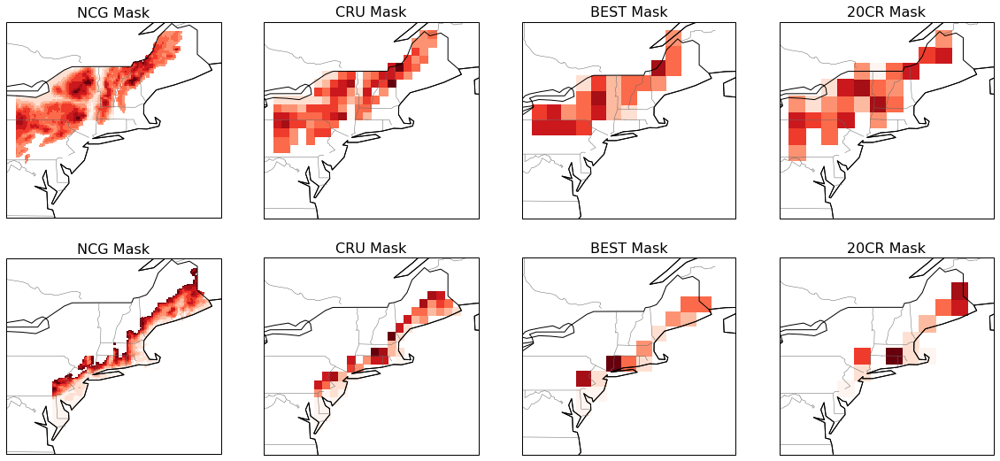

In [31]:
# Get coastal, interior masks based on elevetion data
ecube0 = elevne_regr_neus.extract(regCtrNEBOX)

# Coastal
eth = 200
ecube = copy.deepcopy(ecube0)
ecube.data = np.ma.masked_greater( ecube.data, eth )

nlt, nln = ecube.shape
for lt in np.arange(nlt):
    for ln in np.arange(nln):
        if ( (ecube.coord('latitude').points[lt]>42) and (ecube.coord('longitude').points[ln]<-72.5) ) or\
           ( (ecube.coord('latitude').points[lt]<42) and (ecube.coord('longitude').points[ln]<-76)   ):
            ecube.data[lt,ln] = -9999.
            
ecube.data = np.ma.masked_equal(ecube.data, -9999.)
neus_masks_coastal = {}
neus_masks_coastal.setdefault('ncg', ecube); del ecube

# Interior
eth = 300
tmpCube = copy.deepcopy(ecube0)
tmpCube.data = np.ma.masked_greater( tmpCube.data, eth )

nlt, nln = tmpCube.shape
for lt in np.arange(nlt):
    for ln in np.arange(nln):
        if ( (tmpCube.coord('latitude').points[lt]>42) and (tmpCube.coord('longitude').points[ln]<-72.5) ):
            tmpCube.data[lt,ln] = -9999.
            
tmpCube.data = np.ma.masked_equal(tmpCube.data, -9999.)

ecube = copy.deepcopy(ecube0)
indfin = np.where( np.isfinite(tmpCube.data)==True )
ecube.data[indfin] = -9999.
ecube.data = np.ma.masked_equal(ecube.data, -9999.)
neus_masks_interior = {}
neus_masks_interior.setdefault('ncg', ecube); del ecube

# Masks for other datasets: cru, best, 20cr
# CRU
neus_masks_coastal.setdefault(  'cru', neus_masks_coastal['ncg'].regrid( cru[0].extract(regCtrNEBOX), iris.analysis.Nearest()) )
neus_masks_interior.setdefault( 'cru', neus_masks_interior['ncg'].regrid( cru[0].extract(regCtrNEBOX), iris.analysis.Nearest()) )

# BEST
neus_masks_coastal.setdefault(  'best', neus_masks_coastal['ncg'].regrid( bestAnom[0].extract(regCtrNEBOX), iris.analysis.Nearest()) )
neus_masks_interior.setdefault( 'best', neus_masks_interior['ncg'].regrid( bestAnom[0].extract(regCtrNEBOX), iris.analysis.Nearest()) )

# 20CR
neus_masks_coastal.setdefault(  '20cr', neus_masks_coastal['ncg'].regrid( lsm_20cr.extract(regCtrNEBOX), iris.analysis.Nearest()) )
neus_masks_interior.setdefault( '20cr', neus_masks_interior['ncg'].regrid( lsm_20cr.extract(regCtrNEBOX), iris.analysis.Nearest()) )

nr = 2; nc = 4
ncolors = 9; col = 'Reds'; cmap = cm.get_cmap(col, ncolors); extend = 'both'; ft=16

fig = plt.figure( figsize=(20,9) )

clev1 = np.linspace( 0, 800, ncolors )
ax = plt.subplot(nr,nc,1, projection=ccrs.PlateCarree()); kk+=1; tle='NCG Mask'
epsc( neus_masks_interior['ncg'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

ax = plt.subplot(nr,nc,2, projection=ccrs.PlateCarree()); kk+=1; tle='CRU Mask'
epsc( neus_masks_interior['cru'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

ax = plt.subplot(nr,nc,3, projection=ccrs.PlateCarree()); kk+=1; tle='BEST Mask'
epsc( neus_masks_interior['best'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

ax = plt.subplot(nr,nc,4, projection=ccrs.PlateCarree()); kk+=1; tle='20CR Mask'
epsc( neus_masks_interior['20cr'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

clev1 = np.linspace( 0, 200, ncolors )
ax = plt.subplot(nr,nc,5, projection=ccrs.PlateCarree()); kk+=1; tle='NCG Mask'
epsc( neus_masks_coastal['ncg'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

ax = plt.subplot(nr,nc,6, projection=ccrs.PlateCarree()); kk+=1; tle='CRU Mask'
epsc( neus_masks_coastal['cru'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

ax = plt.subplot(nr,nc,7, projection=ccrs.PlateCarree()); kk+=1; tle='BEST Mask'
epsc( neus_masks_coastal['best'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

ax = plt.subplot(nr,nc,8, projection=ccrs.PlateCarree()); kk+=1; tle='20CR Mask'
epsc( neus_masks_coastal['20cr'], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=True, title=tle, ftsize=ft, unit='meters')
utls.plotStates(ax)

### Local Functions  #localfunctions

In [32]:
from pylab import quiverkey

In [33]:
def calc_cube_trends_local(cubeDict, seasonList, years=None, regCtr=None):
    t = time.time() 
    trends_dict = {}
    pvals_dict  = {}
    for season in seasonList:
        print('Working on: %s ...' % season)
        tmpCube = cubeDict[season]
        
        if regCtr:
            tmpCube = tmpCube.extract(regCtr)
        
        if years:
            tmpCube = ensutils.extract_years(tmpCube, years[0], years[1])
            nt, nlat, nlon = tmpCube.shape
            print(nt)
            if nt==years[1]-years[0]+1:
                pass
            else:
                raise ValueError('extract_years needs sday keyword')
            
        #missingValue = -9999.
        trend = copy.deepcopy(tmpCube[0])
        trend.data[:] = np.NaN #missingValue
        
        pval = copy.deepcopy(tmpCube[0])
        pval.data[:] = np.NaN #missingValue

        nt, nlat, nlon = tmpCube.shape
        for lt in np.arange(nlat):
            for ln in np.arange(nlon):
                #if np.where(tmpCube[:,lt,ln].data==missingValue)[0].shape[0]==0:
                slope, p_value, yfitted = utls.calc_linear_trend_ts( tmpCube[:,lt,ln] )
                trend.data[lt,ln] = slope*nt #pcoef[0]*nt
                pval.data[lt,ln]  = p_value
                del slope, p_value, yfitted
                    
        #trend.data = np.ma.masked_equal(trend.data, missingValue)            
        trend = mylib.applyMask(trend, tmpCube[0])
        trends_dict.setdefault(season, trend)
        
        pval = mylib.applyMask(pval, tmpCube[0])
        pvals_dict.setdefault(season, pval)
        del tmpCube, trend, pval

    print(time.time() - t)
    return trends_dict, pvals_dict

def coastal_v_inland_berkeley(cube, mask):
    # Extract a small region
    latlons = [-82,-67,37,42] #44
    cube = cube.extract( utls.getLatLonCtr(latlons) )
    mask = mask.extract( utls.getLatLonCtr(latlons) )   # This land-sea mask for the given dataset. e.g., Berkeley Earth
    
    print(cube.shape)
    print(mask.shape)
    
    # Get COASTAL mask -----------------------------------------------
    # Mask all land (mask val=1.0) gridboxes
    maskTmp = copy.deepcopy( mask )
    maskTmp.data = np.ma.masked_equal(maskTmp.data, 1.0)
    
    maskCoastal = copy.deepcopy(maskTmp)
    maskCoastal.data[:] = -9999
    
    # Keep coastal gridboxes (NOT adding one extra to the left).
    nlt, nln = maskCoastal.shape
    for lt in np.arange(nlt):
        x = maskTmp.data[lt,:]
        indAll = np.where( x.mask==False )[0]
        indCst = np.where( (np.diff(indAll)>1)==True )[0]
        if indCst.size:
            if indCst.size>1:
                indCst = indCst[-1]

            newind = np.arange(indAll[indCst+1], indAll[-1]+1, 1) #np.arange(indAll[indCst+1]-1, indAll[-1]+1, 1)
        else:
            newind = indAll #np.insert(indAll, 0, indAll[0]-1)

        #print indAll, newind
        maskCoastal.data[lt,newind] = 1.0
        del indAll, indCst, newind

    maskCoastal.data = np.ma.masked_equal(maskCoastal.data, -9999)
    del maskTmp
    
    # Get INLAND mask -----------------------------------------------
    # Mask all water gridboxes
    maskTmp = copy.deepcopy( mask )
    maskTmp.data = np.ma.masked_less(maskTmp.data, 1.0)
    
    maskInland = copy.deepcopy(maskTmp)
    maskInland.data[:] = -9999
    
    # Keep only inland gridboxes (NOT adding one extra to the left).
    nlt, nln = maskInland.shape
    for lt in np.arange(nlt):
        x = maskTmp.data[lt,:]
        indAll = np.where( x.mask==False )[0]
        
        indCst = np.where( (np.diff(indAll)>1)==True )[0]
        if indCst.size:
            if indCst.size>1:
                indCst = indCst[-1]
            
            newind = indAll[indCst+1:-2] #indAll[indCst+1:-1]
        else:
            newind = indAll[:-2] #indAll[:-1]
        
        maskInland.data[lt,newind] = 1.0
        del indAll, indCst, newind

    maskInland.data = np.ma.masked_equal(maskInland.data, -9999)
    del maskTmp
    
    # Get OCEAN mask -----------------------------------------------
    maskOcean = copy.deepcopy(maskCoastal)
    maskOcean.data[:] = -9999
    nlt, nln = maskOcean.shape
    for lt in np.arange(nlt):
        x = maskCoastal.data[lt,:]
        indAll = np.where( x.mask==False )[0]
        newind = [indAll[-1]+1, indAll[-1]+2]
        maskOcean.data[lt,newind] = 1.0
        del indAll, newind
        
    maskOcean.data = np.ma.masked_equal(maskOcean.data, -9999)
    
    cubeCoastal = mylib.applyMask(cube, maskCoastal)
    cubeInland  = mylib.applyMask(cube, maskInland )
    cubeOcean   = mylib.applyMask(cube, maskOcean  )
    
    return maskCoastal, maskInland, maskOcean, cubeCoastal, cubeInland, cubeOcean

def coastal_v_inland_nclimgrid(cube):
    latlons = [-76.025,-70,39.7,43]
    cube = cube.extract( utls.getLatLonCtr(latlons) )
    mask = copy.deepcopy( cube[-1] ) #mask.extract( utls.getLatLonCtr(latlons) )   # This land-sea mask for the given dataset. e.g., Berkeley Earth
    indland = np.where(mask.data.mask==False)
    mask.data[indland] = 1.0
    indocen = np.where(mask.data.mask==True)
    mask.data[indocen] = 0.0

    # Get COASTAL mask -----------------------------------------------
    # Mask all land (mask val=1.0) gridboxes
    maskTmp = copy.deepcopy( mask )
    maskTmp.data = np.ma.masked_equal(maskTmp.data, 1.0)

    maskCoastal = copy.deepcopy(maskTmp)
    maskCoastal.data[:] = -9999
    nCoastal = 20

    maskInland = copy.deepcopy(maskTmp)
    maskInland.data[:] = -9999
    #nInland = 50
    
    lats = maskCoastal.coord('latitude').points
    
    # Keep coastal gridboxes (NOT adding one extra to the left).
    nlt, nln = maskCoastal.shape
    for lt in np.arange(nlt):
        x = maskTmp.data[lt,:]
        indL = np.where( x.mask==True )[0]
        #indO = np.where( x.mask==False )[0]

        indCstL = np.where( (np.diff(indL)>1)==True )[0]
        if indCstL.size:
            if indCstL.size>1:
                indCstL = indCstL[0]

            newindL = indL[indCstL]
        else:
            newindL = indL[-1]

        #indCstO = np.where( (np.diff(indO)>1)==True )[0]
        #if indCstO.size:
        #    if indCstO.size>1:
        #        indCstO = indCstO[-1]
        #
        #    newindO = indO[indCstO]
        #else:
        #    newindO = indO[0]
        #    
        #newind = np.round((newindL+newindO)/2) # overwritten on next line 
        newind = newindL

        if maskTmp.coord('latitude').points[lt]<39.6:
            maskCoastal.data[lt,:indL.max()] = 1.0
        else:
            #pdb.set_trace()
            maskCoastal.data[lt,int(newind-nCoastal):indL.max()] = 1.0    # newind is replaced by indL.max()
            if lats[lt]>40.72 and lats[lt]<40.73:  # lt==54 is a problem
                maskInland.data[lt,0:int(newind-nCoastal)-1-30] = 1.0
            else:
                maskInland.data[lt,0:int(newind-nCoastal)-1-10] = 1.0
                #if newind-nCoastal>nInland:
                    #maskInland.data[lt,newind-nCoastal-1-nInland:newind-nCoastal-1] = 1.0

        del newind, indL, indCstL #, indO, indCstO, newindO

    maskCoastal.data = np.ma.masked_equal(maskCoastal.data, -9999)
    maskInland.data  = np.ma.masked_equal(maskInland.data, -9999)
    #del maskTmp

    cube_clim = ensutils.extract_years(cube,1951,1980).collapsed('time', iris.analysis.MEAN)
    cube_anom = cube - cube_clim

    cubeCoastal = mylib.applyMask(cube_anom, maskCoastal)
    cubeInland  = mylib.applyMask(cube_anom, maskInland)
    
    maskOcean = None
    cubeOcean = None

    del mask, cube, cube_clim, maskTmp, nlt, nln
    
    return maskCoastal, maskInland, maskOcean, cubeCoastal, cubeInland, cubeOcean

def winds_quickplot(uCube, vCube, scale=None):  #windsplot
    x = uCube.coord('longitude').points
    y = vCube.coord('latitude').points
    # Add arrows to show the wind vectors
    q  = plt.quiver(x, y, uCube.data, vCube.data, angles='xy', scale=scale, pivot='middle', transform=ccrs.PlateCarree(), units='inches')
    qk = quiverkey(q, 0.3, 0.1, 1, r'1 m/s', labelpos='E', fontproperties={'weight': 'bold'}) #, bbox={'edge':True, 'fill':True})
    
def calc_cube_trends_local_linalg(cubeDict, seasonList, years=None, regCtr=None, calendarYear=False):
    t = time.time() 
    trends_dict = {}
    pvals_dict  = {}
    for season in seasonList:
        print('Working on: %s ...' % season)
        tmpCube = cubeDict[season]
        
        if regCtr:
            tmpCube = tmpCube.extract(regCtr)
        
        if years:
            tmpCube = ensutils.extract_years(tmpCube, years[0], years[1], calendarYear=calendarYear)
            nt, nlat, nlon = tmpCube.shape
            print(nt)
            if nt==years[1]-years[0]+1:
                pass
            else:
                raise ValueError('extract_years needs sday keyword')
            
        #missingValue = -9999.
        trend = copy.deepcopy(tmpCube[0])
        trend.data[:] = np.NaN #missingValue
        
        # Using np.linalg.lstsq
        nt, nlat, nlon = tmpCube.shape
        xx = tmpCube.coord('season_year').points
        AA = np.vstack([xx, np.ones(len(xx))]).T
        yy = np.zeros((nt, nlat*nlon), dtype=float)
        yy[:] = np.reshape(tmpCube.data, (nt, nlat*nlon), order='C')
        slope, intersect = np.linalg.lstsq(AA, yy, rcond=None)[0]
        slope = slope * nt
        trend.data = np.reshape(slope, (nlat, nlon), order='C')
                    
        #trend.data = np.ma.masked_equal(trend.data, missingValue)            
        trend = mylib.applyMask(trend, tmpCube[0])
        trends_dict.setdefault(season, trend)
        del tmpCube, trend, slope

    print(time.time() - t)
    return trends_dict, pvals_dict

def calc_single_cube_trends_local_linalg(cube):
    t = time.time() 
    tmpCube = copy.deepcopy(cube)

    trend = copy.deepcopy(tmpCube[0])
    trend.data[:] = np.NaN #missingValue

    # Using np.linalg.lstsq
    nt, nlat, nlon = tmpCube.shape
    #xx = tmpCube.coord('season_year').points
    xx = np.arange(nt)
    AA = np.vstack([xx, np.ones(len(xx))]).T
    yy = np.zeros((nt, nlat*nlon), dtype=float)
    yy[:] = np.reshape(tmpCube.data, (nt, nlat*nlon), order='C')
    slope, intersect = np.linalg.lstsq(AA, yy, rcond=None)[0]
    slope = slope * nt
    trend.data = np.reshape(slope, (nlat, nlon), order='C')
    print(nt)

    #trend.data = np.ma.masked_equal(trend.data, missingValue)            
    trend = mylib.applyMask(trend, tmpCube[0])
    del tmpCube, slope

    print(time.time() - t)
    return trend

In [34]:
class calc_regional_seasonal_anoms():
    def __init__(self, cube, baseline, years=[1901,2018], calcAnom=True, calendarYear=False):
        self.cube     = ensutils.extract_years(cube, years[0], years[1], calendarYear=calendarYear)
        self.baseline = baseline
        self.yrarr    = np.arange(years[0], years[1]+1, 1)
        if calcAnom:
            self.anom, self.clim = utls.calc_monthly_anomalies(self.cube, climPeriod=baseline)
        else:
            self.anom = self.cube
            self.clim = None
        
    def seasonal_mean(self, season):
        self.season   = season
        self.anom_sea = ensutils.calc_seasonal_mean_local(self.anom, season, verbose=False)[1]
        
        # Remove global mean
        gmts = mylib.areaAverage( self.anom_sea.extract(utls.getLatLonCtr([-180,180,-80,80])) )
        self.anom_sea_d = mylib.subtractCubes(self.anom_sea, gmts); del gmts
        
    def regional_mean(self, regName, mask=None, mon=False):
        if mon:
            self.anom_reg   = self.anom.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
            if mask:
                mask = mask.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
                self.anom_reg   = mylib.applyMask(self.anom_reg, mask)
                print('Land mask applied')

            self.anom_reg_aa   = mylib.areaAverage(self.anom_reg)
        else:
            self.anom_sea_reg   = self.anom_sea.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
            self.anom_sea_d_reg = self.anom_sea_d.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
            if mask:
                mask = mask.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
                self.anom_sea_reg   = mylib.applyMask(self.anom_sea_reg, mask)
                self.anom_sea_d_reg = mylib.applyMask(self.anom_sea_d_reg, mask)
                print('Land mask applied')

            self.anom_sea_reg_aa   = mylib.areaAverage(self.anom_sea_reg)
            self.anom_sea_d_reg_aa = mylib.areaAverage(self.anom_sea_d_reg)
        
class calc_regional_seasonal_anoms_ncg():
    def __init__(self, cube, regName, years=[1901,2018], calendarYear=False):
        self.anom_sea        = cube
        self.anom_sea_reg    = cube.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
        self.anom_sea_reg_aa = mylib.areaAverage(self.anom_sea_reg)
        self.yrarr           = cube.coord('season_year').points

In [35]:
def moving_average_ts(tcube, winlen=11, windowEnd=False):
    if winlen==1:
        #print 'NOTE: Moving avg window = 1, i.e., no moving average!'
        return tcube
        
    aa = tcube.data

    # Calculate moving average.
    ret = np.cumsum(aa, dtype=float)
    ret[winlen:] = ret[winlen:] - ret[:-winlen]
    rmean = ret[winlen-1:] / winlen

    bb    = np.empty( (aa.shape[0],), dtype=float )
    bb[:] = np.NAN
    
    if windowEnd:
        #assign window average to the last time point to the window period.
        bb[winlen-1:] = rmean
    else:
        #assign window average to the center time point to the window period.
        #ext=1 if n%2==0 else 0
        
        #pdb.set_trace()
        if winlen%2==0:
            #b[n/2:-n/2+1] = rmean
            bb[int(winlen/2):-int(winlen/2+1)] = rmean
        else:
            #b[n/2:-n/2+1] = rmean
            bb[int(winlen/2):-int(winlen/2)] = rmean
        
    finalCube = copy.deepcopy(tcube)
    finalCube.data = bb
    
    del aa, bb, ret, rmean
    
    return finalCube

def moving_average_sp(cube, winlen=11, mask=True):
    nt, nlat, nlon = cube.shape
    mvavg_full = copy.deepcopy(cube)
    mvavg_full.data[:] = np.nan
    for lt in np.arange(nlat):
        for ln in np.arange(nlon):
            mvavg_full.data[:,lt,ln] = moving_average_ts(cube[:,lt,ln], winlen=winlen, windowEnd=False).data
            
    if mask:
        mvavg_full = mylib.applyMask(mvavg_full, cube[0])
            
    mvavg = mvavg_full[int(winlen/2):-int(winlen/2)]
    del nt, nlat, nlon, lt, ln
            
    return mvavg, mvavg_full

#### Calculate Monthly Anomalies

In [36]:
reload(utls)
norm = False

tas_ncg_mon_anom,  tas_ncg_mon_clim  = utls.calc_monthly_anomalies(tas_ncg,  climPeriod=baseline, norm=norm, sday=1)
tmax_ncg_mon_anom, tmax_ncg_mon_clim = utls.calc_monthly_anomalies(tmax_ncg, climPeriod=baseline, norm=norm, sday=1)
tmin_ncg_mon_anom, tmin_ncg_mon_clim = utls.calc_monthly_anomalies(tmin_ncg, climPeriod=baseline, norm=norm, sday=1)

tas_cru_mon_anom, tas_cru_mon_clim = utls.calc_monthly_anomalies(cru,     climPeriod=baseline, norm=norm)
tas_ber_mon_anom, tas_ber_nom_clim = bestAnom, bestClim

hadisst_mon_anom, hadisst_mon_clim = utls.calc_monthly_anomalies(hadisst, climPeriod=baseline, norm=norm)
ersst_mon_anom,   ersst_mon_clim   = utls.calc_monthly_anomalies(ersst,   climPeriod=baseline, norm=norm)


Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1416, 394, 361)
Climatology shape:  (12, 394, 361)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1416, 394, 361)
Climatology shape:  (12, 394, 361)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1416, 394, 361)
Climatology shape:  (12, 394, 361)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1416, 360, 720)
Climatology shape:  (12, 360, 720)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1416, 180, 360)
Climatology shape:  (12, 180, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1416, 89, 180)
Climatology shape:  (12, 89, 180)


In [37]:
reload(utls)
norm = False

hadisstFull_mon_anom, hadisstFull_mon_clim = utls.calc_monthly_anomalies(hadisstFull, climPeriod=baseline, norm=norm)
ersstFull_mon_anom,   ersstFull_mon_clim   = utls.calc_monthly_anomalies(ersstFull,   climPeriod=baseline, norm=norm)


Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1776, 180, 360)
Climatology shape:  (12, 180, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1776, 89, 180)
Climatology shape:  (12, 89, 180)


In [38]:
# Calculate and creaste monthly mean directories
regCtr = regCtrNHEM
norm = False

data20cr_mon_anom_dict = {}
data20cr_mon_clim_dict = {}

# ['tas','z500','psl','pr','shfl','lhfl','swsfl','lwsfl','clt','shum','ta_p','sh_p','uw10','vw10','u850','v850','u500','v500','z850','z250','u250','v250']
tmpVars = list( data20cr.keys() )

for var in tmpVars:
    cube_mon_anom, cube_mon_clim = utls.calc_monthly_anomalies(data20cr[var].extract(regCtr), climPeriod=baseline, norm=norm)
    data20cr_mon_anom_dict.setdefault(var, cube_mon_anom)
    data20cr_mon_clim_dict.setdefault(var, cube_mon_clim)
    del cube_mon_anom, cube_mon_clim


Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape:  (12, 61, 360)

Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 61, 360)
Climatology shape

In [39]:
# qnet is defined as (downward - upward), so multiply by *-1.0 to get upward positive
# Similar change earlier was for seasonal means, this is for monthly means.
data20cr_mon_anom_dict['qnet'] *= -1.0
data20cr_mon_anom_dict['qnet'] = mylib.applyMask(data20cr_mon_anom_dict['qnet'], lsm_20cr_ocean.extract(regCtrNHEM))

data20cr_mon_clim_dict['qnet'] *= -1.0
data20cr_mon_clim_dict['qnet'] = mylib.applyMask(data20cr_mon_clim_dict['qnet'], lsm_20cr_ocean.extract(regCtrNHEM))

# Turbulent heat fluxes
data20cr_mon_anom_dict.setdefault('thfl', data20cr_mon_anom_dict['shfl']+data20cr_mon_anom_dict['lhfl'])

# Total radiation at the surface -- downward positive
tmp = (data20cr_mon_anom_dict['dswsfl'] - data20cr_mon_anom_dict['uswsfl']) - ( data20cr_mon_anom_dict['ulwsfl'] - data20cr_mon_anom_dict['dlwsfl'] )
data20cr_mon_anom_dict.setdefault('drfl', tmp)
del tmp

In [40]:
# Checking if anomalies are calculated correctly -- so not necessary anymore
if False:
    regTmpBox = [-76,-73.5,42,43.5]

    fig = plt.figure(figsize=(4,4))
    ax = plt.subplot(1,1,1, projection=ccrs.Mollweide(central_longitude=-45.)) 
    utls.show_regBox(regTmpBox, axesHandle=ax, facecolor='lightgrey')
    ax.set_extent([-85,-70, 35, 50])

    ncgtr = mylib.areaAverage(tas_ncg.extract(utls.getLatLonCtr(regTmpBox)))
    crutr = mylib.areaAverage(cru.extract(utls.getLatLonCtr(regTmpBox)))
    bertr = mylib.areaAverage(tas_ber_mon_anom.extract(utls.getLatLonCtr(regTmpBox)))

    fig = plt.figure(figsize=(18,4))
    ax = plt.subplot(111)
    #iplt.plot(crutr)
    iplt.plot(bertr[0:100])
    iplt.plot(ncgtr[0:100])

In [41]:
syr0 = 1902
eyr0 = 2018
eyr1 = 2014

In [42]:
# Extract monthly data for periods defined above
tas_ncg_mon_anom  = ensutils.extract_years(tas_ncg_mon_anom,  syr0, eyr0, sday=1)
tmax_ncg_mon_anom = ensutils.extract_years(tmax_ncg_mon_anom, syr0, eyr0, sday=1)
tmin_ncg_mon_anom = ensutils.extract_years(tmin_ncg_mon_anom, syr0, eyr0, sday=1)

tas_cru_mon_anom  = ensutils.extract_years(tas_cru_mon_anom,  syr0, eyr0)
tas_ber_mon_anom  = ensutils.extract_years(tas_ber_mon_anom,  syr0, eyr0)

hadisst_mon_anom = ensutils.extract_years(hadisst_mon_anom, syr0, eyr0)
ersst_mon_anom   = ensutils.extract_years(ersst_mon_anom,   syr0, eyr0)

print(tas_ncg_mon_anom.shape, tmax_ncg_mon_anom.shape, tmin_ncg_mon_anom.shape, \
      tas_cru_mon_anom.shape, tas_ber_mon_anom.shape,\
      hadisst_mon_anom.shape, ersst_mon_anom.shape)

(1404, 394, 361) (1404, 394, 361) (1404, 394, 361) (1404, 360, 720) (1404, 180, 360) (1404, 180, 360) (1404, 89, 180)


In [43]:
calYear = False
modeYears = {'AMO': [1902, 2018], 'NAO': [1902, 2018], 'IPO': [1902, 2018],\
             'PDO': [1902, 2017], 'PNA': [1951, 2018], 'MEI': [1951, 2016], 'AO': [1951, 2018]}

amv_mon = ensutils.extract_years(natmodes['AMO'], modeYears['AMO'][0], modeYears['AMO'][1], calendarYear=calYear)
nao_mon = ensutils.extract_years(natmodes['NAO'], modeYears['NAO'][0], modeYears['NAO'][1], calendarYear=calYear)
pna_mon = ensutils.extract_years(natmodes['PNA'], modeYears['PNA'][0], modeYears['PNA'][1], calendarYear=calYear)
pdo_mon = ensutils.extract_years(natmodes['PDO'], modeYears['PDO'][0], modeYears['PDO'][1], calendarYear=calYear)
ipo_mon = ensutils.extract_years(natmodes['PDO'], modeYears['PDO'][0], modeYears['PDO'][1], calendarYear=calYear)
mei_mon = ensutils.extract_years(natmodes['MEI'], modeYears['MEI'][0], modeYears['MEI'][1], calendarYear=calYear)
ao_mon  = ensutils.extract_years(natmodes['AO'],  modeYears['AO'][0],  modeYears['AO'][1],  calendarYear=calYear)

print('\nAMV: %d\n' % amv_mon.shape[0], amv_mon.coord('time')[0], '\n', amv_mon.coord('time')[-1])
print('\nNAO: %d\n' % nao_mon.shape[0], nao_mon.coord('time')[0], '\n', nao_mon.coord('time')[-1])
print('\nPNA: %d\n' % pna_mon.shape[0], pna_mon.coord('time')[0], '\n', pna_mon.coord('time')[-1])
print('\nPDO: %d\n' % pdo_mon.shape[0], pdo_mon.coord('time')[0], '\n', pdo_mon.coord('time')[-1])
print('\nIPO: %d\n' % ipo_mon.shape[0], ipo_mon.coord('time')[0], '\n', ipo_mon.coord('time')[-1])
print('\nMEI: %d\n' % mei_mon.shape[0], mei_mon.coord('time')[0], '\n', mei_mon.coord('time')[-1])
print('\nAO: %d \n' % ao_mon.shape[0],  ao_mon.coord('time')[0],  '\n',  ao_mon.coord('time')[-1])


AMV: 1404
 DimCoord([1901-12-16 00:00:00], bounds=[[1901-11-30 18:00:00, 1901-12-31 12:00:00]], standard_name='time', calendar='gregorian') 
 DimCoord([2018-11-15 12:00:00], bounds=[[2018-10-31 06:00:00, 2018-11-30 18:00:00]], standard_name='time', calendar='gregorian')

NAO: 1404
 DimCoord([1901-12-16 00:00:00], bounds=[[1901-11-30 18:00:00, 1901-12-31 12:00:00]], standard_name='time', calendar='gregorian') 
 DimCoord([2018-11-15 12:00:00], bounds=[[2018-10-31 06:00:00, 2018-11-30 18:00:00]], standard_name='time', calendar='gregorian')

PNA: 816
 DimCoord([1950-12-16 00:00:00], bounds=[[1950-11-30 18:00:00, 1950-12-31 12:00:00]], standard_name='time', calendar='gregorian') 
 DimCoord([2018-11-15 12:00:00], bounds=[[2018-10-31 06:00:00, 2018-11-30 18:00:00]], standard_name='time', calendar='gregorian')

PDO: 1392
 DimCoord([1901-12-16 00:00:00], bounds=[[1901-11-30 18:00:00, 1901-12-31 12:00:00]], standard_name='time', calendar='gregorian') 
 DimCoord([2017-11-15 12:00:00], bounds=[[2

### Exceptionality of the warming trends in the NEUS #exceptional

#### Figure 1<a id="figure1"></a>

In [44]:
seasonList = ['ANN','DJF','MAM','JJA','SON'] #,'COLD','WARM']
regName = 'NHEMFULL'

# CRU
satCru_anom = tas_cru_mon_anom.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
satCru_anom_sea_dict = {}
for season in seasonList:
    satCru_anom_sea_dict.setdefault( season, ensutils.calc_seasonal_mean_local(satCru_anom, season, verbose=False)[1] )
del satCru_anom
    
# BEST
satBest_anom = mylib.applyMask(tas_ber_mon_anom, bestLmask)
satBest_anom = satBest_anom.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
satBest_anom_sea_dict = {}
for season in seasonList:
    satBest_anom_sea_dict.setdefault( season, ensutils.calc_seasonal_mean_local(satBest_anom, season, verbose=False)[1] )
del satBest_anom

# NCG
satNcg_anom = tas_ncg_mon_anom
satNcg_anom_sea_dict = {}
for season in seasonList:
    satNcg_anom_sea_dict.setdefault( season, ensutils.calc_seasonal_mean_local(satNcg_anom, season, verbose=False)[1] )
del satNcg_anom

# 20CRv3
sat20cr_anom = data20cr_mon_anom_dict['tas'].extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
sat20cr_anom_sea_dict = {}
for season in seasonList:
    sat20cr_anom_sea_dict.setdefault( season, ensutils.calc_seasonal_mean_local(sat20cr_anom, season, verbose=False)[1] )
del sat20cr_anom

In [45]:
seasonList = ['ANN','DJF','MAM','JJA','SON'] #,'COLD','WARM']
regName = 'NHEMFULL'

# BEST (not just land)
satBest_anom_full = tas_ber_mon_anom.extract( utls.getLatLonCtr(utls.reg2bbox[regName]) )
satBest_anom_full_sea_dict = {}
for season in seasonList:
    satBest_anom_full_sea_dict.setdefault( season, ensutils.calc_seasonal_mean_local(satBest_anom_full, season, verbose=False)[1] )

del satBest_anom_full

##### Calcculate trends using linalg (original)

In [46]:
# Calculate SAT Trends for all datasets and all periods
# Define time slices to calculate trends for
yearsFull  = [1902, 2018]
years100   = [1921, 2018]
yearsEarly = [1902, 1960]
yearsLate  = [1959, 2018]
yearsEra5  = [1980, 2018]

period2name = {'full': yearsFull, 'early': yearsEarly, 'late': yearsLate, 'last40': yearsEra5}

sat_trends_all = {}
sat_pvals_all = {}
for period in ['full','early','late','last40']:
    dummyDict_tr = {}
    dummyDict_pv = {}
    for dataset in ['cru','best','ncg','20cr']:
        print(dataset, period+'\t----')
        if dataset=='cru':   dataDict = satCru_anom_sea_dict
        if dataset=='bestl': dataDict = satBest_anom_sea_dict
        if dataset=='ncg':   dataDict = satNcg_anom_sea_dict
        if dataset=='20cr':  dataDict = sat20cr_anom_sea_dict
        if dataset=='best':  dataDict = satBest_anom_full_sea_dict
            
        syr = period2name[period][0]
        eyr = period2name[period][1]
        if (dataset=='20cr') and (eyr>2015):
            eyr = 2015
        
        trends0, pvals0 = calc_cube_trends_local_linalg( dataDict, seasonList, years=[syr, eyr] )
        dummyDict_tr.setdefault(dataset, trends0)
        dummyDict_pv.setdefault(dataset, pvals0)
        del trends0, pvals0
        
    sat_trends_all.setdefault(period, dummyDict_tr)
    sat_pvals_all.setdefault(period,  dummyDict_pv)
    del dummyDict_tr, dummyDict_pv

cru full	----
Working on: ANN ...
117
Working on: DJF ...
117
Working on: MAM ...
117
Working on: JJA ...
117
Working on: SON ...
117
2.13782000541687
best full	----
Working on: ANN ...
117
Working on: DJF ...
117
Working on: MAM ...
117
Working on: JJA ...
117
Working on: SON ...
117
1.1305038928985596
ncg full	----
Working on: ANN ...
117
Working on: DJF ...
117
Working on: MAM ...
117
Working on: JJA ...
117
Working on: SON ...
117
243.45751476287842
20cr full	----
Working on: ANN ...
114
Working on: DJF ...
114
Working on: MAM ...
114
Working on: JJA ...
114
Working on: SON ...
114
1.072004795074463
cru early	----
Working on: ANN ...
59
Working on: DJF ...
59
Working on: MAM ...
59
Working on: JJA ...
59
Working on: SON ...
59
1.8087661266326904
best early	----
Working on: ANN ...
59
Working on: DJF ...
59
Working on: MAM ...
59
Working on: JJA ...
59
Working on: SON ...
59
0.9702458381652832
ncg early	----
Working on: ANN ...
59
Working on: DJF ...
59
Working on: MAM ...
59
Workin

##### Calcculate trends + Mann Kendall significance test

In [47]:
def calc_single_cube_trends_local_mk(cube):
    t = time.time() 
    tmpCube = copy.deepcopy(cube)

    trend = copy.deepcopy(tmpCube[0])
    trend.data[:] = np.NaN #missingValue
    pval = copy.deepcopy(trend)
    hval = copy.deepcopy(trend)

    # Using np.linalg.lstsq
    nt, nlat, nlon = tmpCube.shape
    
    for lt in np.arange(nlat):
        for ln in np.arange(nlon):
            ##if np.where(tmpCube[:,lt,ln].data==missingValue)[0].shape[0]==0:
            #slope, p_value, yfitted = utls.calc_linear_trend_ts( tmpCube[:,lt,ln] )
            #trend.data[lt,ln] = slope*nt #pcoef[0]*nt
            #pval.data[lt,ln]  = p_value
            #del slope, p_value, yfitted
            
            mk_result = mk.original_test( tmpCube[:,lt,ln].data )
            trend.data[lt,ln] = mk_result.slope * nt
            pval.data[lt,ln] = mk_result.p
            hval.data[lt,ln] = mk_result.h
            del mk_result
    
    #xx = np.arange(nt)
    #AA = np.vstack([xx, np.ones(len(xx))]).T
    #yy = np.zeros((nt, nlat*nlon), dtype=float)
    #yy[:] = np.reshape(tmpCube.data, (nt, nlat*nlon), order='C')
    ##slope, intersect = np.linalg.lstsq(AA, yy, rcond=None)[0]
    #mk_result = mk.original_test(yy)
    
    #slope = mk.slope * nt
    #hval  = mk.h
    #pval  = mk.p
    #trend.data = np.reshape(slope, (nlat, nlon), order='C')
    print(nt)

    #trend.data = np.ma.masked_equal(trend.data, missingValue)            
    trend = mylib.applyMask(trend, tmpCube[0])
    pval = mylib.applyMask(pval, tmpCube[0])
    hval = mylib.applyMask(hval, tmpCube[0])
    del tmpCube

    print(time.time() - t)
    return trend, pval, hval

In [48]:
# Calculate trends for ANN for CRU and BEST first since that's what is plotted in Fig. 1
season = 'ANN'
regCtrTmp = utls.getLatLonCtr(utls.reg2bbox['ENA2'])

sat_trends_mk = {}
sat_pvals_mk = {}
sat_hvals_mk = {}
for period in ['full','early','late','last40']:
    dummyDict_tr = {}
    dummyDict_pv = {}
    dummyDict_hv = {}
    for dataset in ['cru','best','20cr']:
        print(dataset, period+'\t----')
        if dataset=='cru':   dataDict = satCru_anom_sea_dict
        if dataset=='bestl': dataDict = satBest_anom_sea_dict
        if dataset=='ncg':   dataDict = satNcg_anom_sea_dict
        if dataset=='20cr':  dataDict = sat20cr_anom_sea_dict
        if dataset=='best':  dataDict = satBest_anom_full_sea_dict
            
        syr = period2name[period][0]
        eyr = period2name[period][1]
        if (dataset=='20cr') and (eyr>2015):
            eyr = 2015
            
        cubeTmp = dataDict[season].extract(regCtrTmp)
        cubeTmp = ensutils.extract_years(cubeTmp, syr, eyr)
        
        trends0, pvals0, hvals0 = calc_single_cube_trends_local_mk( cubeTmp )
        dummyDict_tr.setdefault(dataset, trends0)
        dummyDict_pv.setdefault(dataset, pvals0)
        dummyDict_hv.setdefault(dataset, hvals0)
        del trends0, pvals0, cubeTmp
        
    sat_trends_mk.setdefault(period, dummyDict_tr)
    sat_pvals_mk.setdefault(period,  dummyDict_pv)
    sat_hvals_mk.setdefault(period,  dummyDict_hv)
    del dummyDict_tr, dummyDict_pv

cru full	----
117
55.856398820877075
best full	----
117
13.256112098693848
20cr full	----
114
13.059394836425781
cru early	----
59
38.978965044021606
best early	----
59
9.703480243682861
20cr early	----
59
9.769777297973633
cru late	----
60
39.18356394767761
best late	----
60
9.5309898853302
20cr late	----
57
9.775990009307861
cru last40	----
39
33.80481696128845
best last40	----
39
8.273159980773926
20cr last40	----
36
8.592061281204224


In [49]:
# Calculate and save seasonal HadISST trends
regCtrTmp = utls.getLatLonCtr([-92,-50,20,55])
period = 'full'

sst_trends_mk_sea_dict = {}
sst_pvals_mk_sea_dict = {}

esst_trends_mk_sea_dict = {}
esst_pvals_mk_sea_dict = {}
for sn in ['ANN','DJF','MAM','JJA','SON']:
    # HadISST
    sstCube = ensutils.calc_seasonal_mean_local(hadisst_mon_anom.extract(regCtrTmp), sn, verbose=False)[1]
    cubeTmp = ensutils.extract_years(sstCube, period2name[period][0], period2name[period][1])
    sst_trends_mk_tmp, sst_pvals_mk_tmp, sst_hvals_mk_tmp = calc_single_cube_trends_local_mk( cubeTmp )
    
    sst_trends_mk_sea_dict.setdefault(sn, sst_trends_mk_tmp)
    sst_trends_mk_sea_dict.setdefault(sn, sst_pvals_mk_tmp)
    
    del sst_trends_mk_tmp, sst_pvals_mk_tmp, sst_hvals_mk_tmp, cubeTmp, sstCube
    
    # ERSST
    sstCube = ensutils.calc_seasonal_mean_local(ersst_mon_anom.extract(regCtrTmp), sn, verbose=False)[1]
    cubeTmp = ensutils.extract_years(sstCube, period2name[period][0], period2name[period][1])
    sst_trends_mk_tmp, sst_pvals_mk_tmp, sst_hvals_mk_tmp = calc_single_cube_trends_local_mk( cubeTmp )
    
    esst_trends_mk_sea_dict.setdefault(sn, sst_trends_mk_tmp)
    esst_trends_mk_sea_dict.setdefault(sn, sst_pvals_mk_tmp)
    
    del sst_trends_mk_tmp, sst_pvals_mk_tmp, sst_hvals_mk_tmp, cubeTmp, sstCube

del regCtrTmp

117
8.251911878585815
117
2.1836748123168945
117
8.031247854232788
117
2.0938880443573
117
8.088666200637817
117
2.111217975616455
117
8.042857885360718
117
2.094507932662964
117
8.030192136764526
117
2.0876009464263916


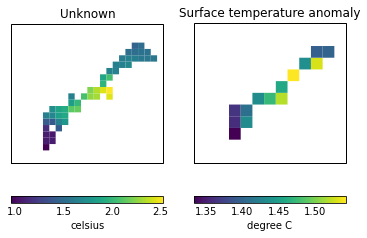

In [50]:
# Save them in directories for CRU and BEST
# CRU ==================================================================
dataset = 'cru'
namDict = {}
neDict  = {}
nhemDict= {}

# Regrid NCG mask
#tmpmask = .regrid(cru.extract(regCtrNEBOX), iris.analysis.Nearest())

for season in seasonList:
    namCube  = sat_trends_all['full'][dataset][season].extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
    neCube   = sat_trends_all['full'][dataset][season].extract(utls.getLatLonCtr(utls.reg2bbox['NEBOX']))
    nhemCube = sat_trends_all['full'][dataset][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL']))
    
    neCube  = mylib.applyMask(neCube, neus_masks_coastal[dataset]) #crumaskcoastalnew) #crumaskcoastal)
    if season=='ANN': ax = plt.subplot(121); iplt.pcolor(neCube)
    
    namCubeData  = np.reshape(namCube.data,  (namCube.shape[0] *namCube.shape[1],1))
    neCubeData   = np.reshape(neCube.data,   (neCube.shape[0]  *neCube.shape[1], 1))
    nhemCubeData = np.reshape(nhemCube.data, (nhemCube.shape[0]*nhemCube.shape[1], 1))
    
    indnam  = np.where(namCubeData.mask ==False)[0]
    indne   = np.where(neCubeData.mask  ==False)[0]
    indnhem = np.where(nhemCubeData.mask==False)[0]
    
    namDict.setdefault(season, namCubeData[indnam])
    neDict.setdefault(season,  neCubeData[indne]  )
    nhemDict.setdefault(season,  nhemCubeData[indnhem]  )
    del namCube, neCube, namCubeData, neCubeData, indnam, indne
    
namMat_cru = np.zeros( ( namDict[seasonList[0]].shape[0], len(seasonList)), dtype=float ); namMat_cru[:] = np.nan
neMat_cru  = np.zeros( (  neDict[seasonList[0]].shape[0], len(seasonList)), dtype=float ); neMat_cru[:]  = np.nan
nhemMat_cru= np.zeros( (nhemDict[seasonList[0]].shape[0], len(seasonList)), dtype=float ); nhemMat_cru[:]= np.nan
for ss, season in enumerate(seasonList):
    #print(season, namMat_cru[:,ss].shape, neMat_cru[:,ss].shape, nhemMat_cru[:,ss].shape)
    namMat_cru[:,ss]  = namDict[season][:,0]
    neMat_cru[:,ss]   = neDict[season][:,0]
    nhemMat_cru[:,ss] = nhemDict[season][:,0]
    
del namDict, neDict, nhemDict

# BEST ==================================================================
dataset = 'best'
namDict = {}
neDict  = {}
nhemDict= {}

## Regrid NCG mask to BEST mask
#tmpmask = .regrid(bestLmask.extract(regCtrNEBOX), iris.analysis.Nearest())

for season in seasonList:
    namCube  = sat_trends_all['full'][dataset][season].extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
    neCube   = sat_trends_all['full'][dataset][season].extract(utls.getLatLonCtr(utls.reg2bbox['NEBOX']))
    nhemCube = sat_trends_all['full'][dataset][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL']))
    
    neCube  = mylib.applyMask(neCube, neus_masks_coastal[dataset]) #crumaskcoastalnew) #crumaskcoastal)
    if season=='ANN':  ax = plt.subplot(122); iplt.pcolor(neCube)
    
    namCubeData  = np.reshape(namCube.data,  (namCube.shape[0]  * namCube.shape[1],  1))
    neCubeData   = np.reshape(neCube.data,   (neCube.shape[0]   * neCube.shape[1],   1))
    nhemCubeData = np.reshape(nhemCube.data, (nhemCube.shape[0] * nhemCube.shape[1], 1))
    
    indnam  = np.where(namCubeData.mask ==False)[0]
    indne   = np.where(neCubeData.mask  ==False)[0]
    indnhem = np.where(nhemCubeData.mask==False)[0]
    
    namDict.setdefault( season, namCubeData[indnam]    )
    neDict.setdefault(  season, neCubeData[indne]      )
    nhemDict.setdefault(season, nhemCubeData[indnhem]  )
    del namCube, neCube, namCubeData, neCubeData, indnam, indne
    
# The following doesn't work b/c every season have diff number of gpts with finite values.
#namMat_best = np.zeros( ( namDict[seasonList[0]].shape[0], len(seasonList)), dtype=float ); namMat_best[:] = np.nan
#neMat_best  = np.zeros( (  neDict[seasonList[0]].shape[0], len(seasonList)), dtype=float ); neMat_best[:]  = np.nan
#nhemMat_best= np.zeros( (nhemDict[seasonList[0]].shape[0], len(seasonList)), dtype=float ); nhemMat_best[:]= np.nan
#for ss, season in enumerate(seasonList):
#    print(season)
#    print(namDict[season].shape, neDict[season].shape, nhemDict[season].shape)
#    print(namMat_best[:,ss].shape, neMat_best[:,ss].shape, nhemMat_best[:,ss].shape)
#    namMat_best[:,ss]  = namDict[season][:,0]
#    neMat_best[:,ss]   = neDict[season][:,0]
#    nhemMat_best[:,ss] = nhemDict[season][:,0]

namDict_best = namDict
neDict_best = neDict
nhemDict_best = nhemDict
    
del namDict, neDict, nhemDict

(0.0, 1100.0)

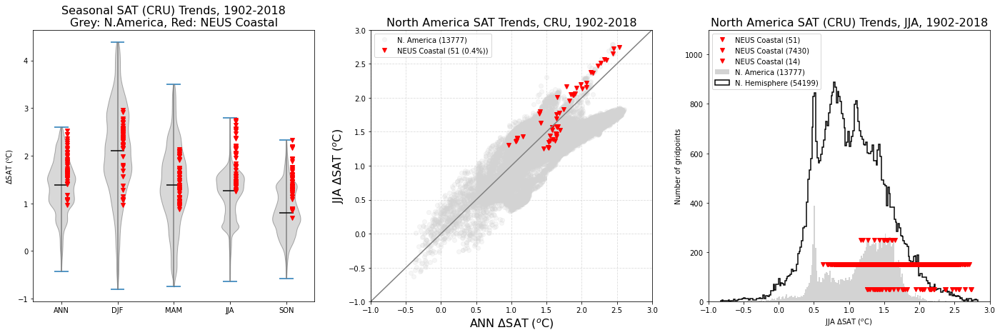

In [51]:
# Arrange data
reload(utls)
dataset = 'cru'
period = 'full'
cube1nam = sat_trends_all[period][dataset]['JJA'].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
cube2nam = sat_trends_all[period][dataset]['ANN'].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))

cube1nhem = sat_trends_all[period][dataset]['JJA'].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))
cube2nhem = sat_trends_all[period][dataset]['ANN'].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

cube1 = sat_trends_all[period][dataset]['JJA'].extract(utls.getLatLonCtr([-130,-55,25,50]))
cube2 = sat_trends_all[period][dataset]['ANN'].extract(utls.getLatLonCtr([-130,-55,25,50]))

cube1ne = sat_trends_all[period][dataset]['JJA'].extract(regCtrNEBOX)
cube2ne = sat_trends_all[period][dataset]['ANN'].extract(regCtrNEBOX)

cube1ne = mylib.applyMask(cube1ne, neus_masks_coastal[dataset]) #crumaskcoastalnew) #crumaskcoastal)
cube2ne = mylib.applyMask(cube2ne, neus_masks_coastal[dataset]) #crumaskcoastalnew) #crumaskcoastal)

cubedata1nam = np.reshape(cube1nam.data, (cube1nam.shape[0]*cube1nam.shape[1],1))
cubedata2nam = np.reshape(cube2nam.data, (cube2nam.shape[0]*cube1nam.shape[1],1))

cubedata1nhem = np.reshape(cube1nhem.data, (cube1nhem.shape[0]*cube1nhem.shape[1],1))
cubedata2nhem = np.reshape(cube2nhem.data, (cube2nhem.shape[0]*cube1nhem.shape[1],1))

cubedata1 = np.reshape(cube1.data, (cube1.shape[0]*cube1.shape[1],1))
cubedata2 = np.reshape(cube2.data, (cube2.shape[0]*cube1.shape[1],1))

cubedata1ne = np.reshape(cube1ne.data, (cube1ne.shape[0]*cube1ne.shape[1],1))
cubedata2ne = np.reshape(cube2ne.data, (cube2ne.shape[0]*cube1ne.shape[1],1))

# ncg
cube1ne_ncg = sat_trends_all[period]['ncg']['JJA'].extract(regCtrNEBOX)
cube1ne_ncg = mylib.applyMask(cube1ne_ncg, neus_masks_coastal['ncg'].extract(regCtrNEBOX))
cubedata1ne_ncg = np.reshape(cube1ne_ncg.data, (cube1ne_ncg.shape[0]*cube1ne_ncg.shape[1],1))

# ncg
cube1ne_best = sat_trends_all[period]['best']['JJA'].extract(regCtrNEBOX)
cube1ne_best = mylib.applyMask(cube1ne_best, neus_masks_coastal['best'].extract(regCtrNEBOX))
cubedata1ne_best = np.reshape(cube1ne_best.data, (cube1ne_best.shape[0]*cube1ne_best.shape[1],1))

# Plot ================================
ft  = 16
fig = plt.figure(figsize=(24,7))

# =============================
ax = plt.subplot(131)
bp = plt.violinplot(namMat_cru[:,0:5], vert=True, showmedians=True, showmeans=False)
bp['cbars'].set_color('grey')
bp['cmedians'].set_color('k')
for vp in bp['bodies']:
    vp.set_facecolor('grey')
    vp.set_edgecolor('k')
    
for ii in np.arange(5):
    plt.plot( np.ones(neMat_cru[:,ii].shape[0])+ii+0.1, neMat_cru[:,ii], 'rv')
    
#labels = ['N. America, NEUS Coastal']
    
ax.set_xticks(np.arange(6))
snNames = copy.deepcopy(seasonList)
snNames.insert(0,'')
ax.set_xticklabels(snNames[0:6])
ax.set_xlim([0.5, 5.5])
plt.title('Seasonal SAT (CRU) Trends, 1902-2018\nGrey: N.America, Red: NEUS Coastal', fontsize=ft)
plt.ylabel('$\Delta$SAT ($^o$C)')

# =============================
indnam  = np.where(cubedata1nam.mask ==False)[0]
indnhem = np.where(cubedata1nhem.mask==False)[0]
indne   = np.where(cubedata1ne.mask  ==False)[0]

ax = plt.subplot(132)
per = cubedata1ne[indne].shape[0]/cubedata1nam[indnam].shape[0]*100.
plt.plot(cubedata2nam[indnam],   cubedata1nam[indnam],   'o', color='lightgrey', alpha=0.2, label='N. America (%d)' % cubedata1nam[indnam].shape[0])
#plt.plot(cubedata2,   cubedata1,   'o', color='lightgrey', alpha=0.2)
plt.plot(cubedata2ne[indne], cubedata1ne[indne], 'v', color='r', label='NEUS Coastal (%d (%.1f%%))' % (cubedata1ne[indne].shape[0], per))
ax.set_xlim([-1.0, 3.0])
ax.set_ylim([-1.0, 3.0])
plt.plot([-1,3], [-1,3], '-', color='grey')
ax.grid(color='lightgrey', ls='--', alpha=0.8)
plt.xlabel('ANN $\Delta$SAT ($^o$C)', fontsize=ft)
plt.ylabel('JJA $\Delta$SAT ($^o$C)', fontsize=ft)
plt.title('North America SAT Trends, CRU, 1902-2018', fontsize=ft)
plt.legend(loc=2)

# =============================
ax = plt.subplot(133)
hh = plt.hist(cubedata1nam[indnam], 200, density=False, color='lightgrey', label='N. America (%d)' % cubedata1nam[indnam].shape[0])
hh = plt.hist(cubedata1nhem[indnhem], 200, density=False, color='k', histtype='step', lw=1.5, label='N. Hemisphere (%d)' % cubedata1nhem[indnhem].shape[0])
plt.plot(cubedata1ne[indne], np.zeros((cubedata1ne[indne].shape[0],1))+50, 'rv', ms=6, label='NEUS Coastal (%d)' % cubedata1ne[indne].shape[0])

indne_ncg   = np.where(cubedata1ne_ncg.mask==False)[0]
plt.plot(cubedata1ne_ncg[indne_ncg], np.zeros((cubedata1ne_ncg[indne_ncg].shape[0],1))+150, 'rv', ms=6, label='NEUS Coastal (%d)' % cubedata1ne_ncg[indne_ncg].shape[0])

indne_best   = np.where(cubedata1ne_best.mask==False)[0]
plt.plot(cubedata1ne_best[indne_best], np.zeros((cubedata1ne_best[indne_best].shape[0],1))+250, 'rv', ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])

ax.set_xlim([-1, 3])
plt.title('North America SAT (CRU) Trends, JJA, 1902-2018', fontsize=ft)
plt.xlabel('JJA $\Delta$SAT ($^o$C)')
plt.ylabel('Number of gridpoints')
plt.legend(loc=2)
ax.set_ylim([0, 1100])

#ax = plt.subplot(122)
#per = cubedata1ne.shape[0]/cubedata1.shape[0]*100.
##plt.plot(cubedata2nam,   cubedata1nam,   'o', color='lightgrey', alpha=0.2)
#plt.plot(cubedata2, cubedata1,   'o', color='lightgrey', alpha=0.2, label='%d' % cubedata1.shape[0])
#plt.plot(cubedata2ne, cubedata1ne, 'v', color='red', label='%d (%.1f%%)' % (cubedata1ne.shape[0], per))
#ax.set_xlim([-1.0, 3.0])
#ax.set_ylim([-1.0, 3.0])
#plt.plot([-1,3], [-1,3], '-', color='grey')
#ax.grid(color='lightgrey', ls='--', alpha=0.8)
#plt.xlabel('ANN', fontsize=ft)
#plt.ylabel('JJA', fontsize=ft)
#plt.title('CONUS SAT Trends, CRU, 1902-2018', fontsize=ft)
#plt.legend(loc=2)

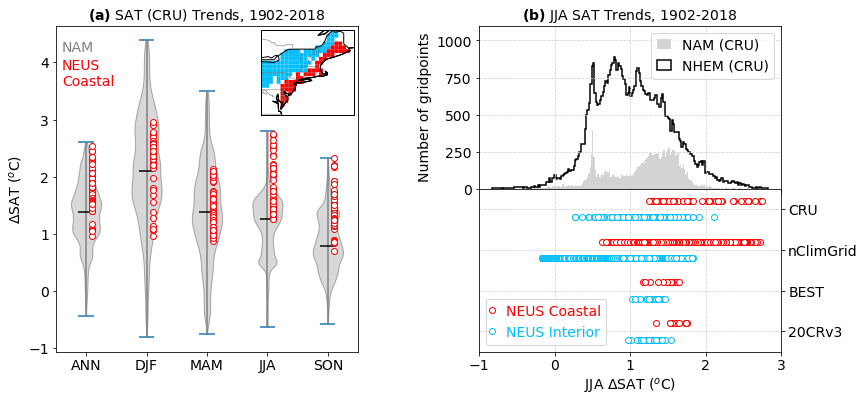

In [52]:
# Plot seasonal trend and JJA trend distributions
matplotlib.rcParams.update({'font.size':14})
reload(utls)
def __extract_reshape_trends(dataSet, dataCube, maskDict):
    cubeDummy = mylib.applyMask(dataCube, maskDict[dataSet])
    dataArray = np.reshape(cubeDummy.data, (cubeDummy.shape[0]*cubeDummy.shape[1],1))
    del cubeDummy
    return dataArray

period = 'full'
season = 'JJA'

# cru
dataSet      = 'cru'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
cubenam      = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
cubenhem     = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

datane_cru_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_cru_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene
datanam_cru  = np.reshape(cubenam.data,  (cubenam.shape[0] * cubenam.shape[1],1)); del cubenam
datanhem_cru = np.reshape(cubenhem.data, (cubenhem.shape[0]*cubenhem.shape[1],1)); del cubenhem

# ncg
dataSet      = 'ncg'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_ncg_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_ncg_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# ncg
dataSet      = 'best'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_best_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_best_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# 20cr
dataSet      = '20cr'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_20cr_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_20cr_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# Plot ================================
ft  = 14
fig = plt.figure(figsize=(13,6))
grid = plt.GridSpec(4, 2, hspace=0, wspace=0.4)

# =============================
#ax = plt.subplot(131)
ax = plt.subplot(grid[:, 0])
bp = plt.violinplot(namMat_cru[:,0:5], vert=True, showmedians=True, showmeans=False)
bp['cbars'].set_color('grey')
bp['cmedians'].set_color('k')
for vp in bp['bodies']:
    vp.set_facecolor('grey')
    vp.set_edgecolor('k')
    
for ii in np.arange(5):
    plt.plot( np.ones(neMat_cru[:,ii].shape[0])+ii+0.1, neMat_cru[:,ii], 'ro', ms=6, mfc='w', label='NEUS Coastal')
    
ax.set_xticks(np.arange(6))
snNames = copy.deepcopy(seasonList)
snNames.insert(0,'')
ax.set_xticklabels(snNames[0:6])
ax.set_xlim([0.5, 5.5])
plt.title(r'$\bf(a)$ SAT (CRU) Trends, 1902-2018', fontsize=ft)
plt.ylabel('$\Delta$SAT ($^o$C)', fontsize=ft)
plt.text(0.6, 4.2, 'NAM', color='grey', ha='left', fontsize=ft)
plt.text(0.6, 3.6, 'NEUS\nCoastal', color='red', ha='left', fontsize=ft)

#plt.legend(loc=1)
#plt.text(0.6, 4.3, '(a)', fontsize=ft)

# =============================
indnam  = np.where(datanam_cru.mask ==False)[0]
indnhem = np.where(datanhem_cru.mask==False)[0]
indne_c = np.where(datane_cru_c.mask==False)[0]
indne_i = np.where(datane_cru_i.mask==False)[0]

bpPlot=True
namCol = 'lightgrey'
nhemCol = 'k'

#ax = plt.subplot(133)
ax = plt.subplot(grid[0:2, 1])
hh = plt.hist(datanam_cru[indnam], 200, density=False, color=namCol, label='NAM (CRU)') #'(%d)' % cubedata1nam[indnam].shape[0])
hh = plt.hist(datanhem_cru[indnhem], 200, density=False, color=nhemCol, histtype='step', lw=1.5, label='NHEM (CRU)') #' (%d)' % cubedata1nhem[indnhem].shape[0])

ax.set_xlim([-1, 3])
plt.title(r'$\bf(b)$ JJA SAT Trends, 1902-2018', fontsize=ft)

plt.ylabel('Number of gridpoints', fontsize=ft)
plt.legend(loc=1, handlelength=1)
ax.set_ylim([0, 1100])
ax.set_xticklabels([])
ax.grid(ls='--', color='lightgrey')
#plt.text(-0.85, 970, '(b)', fontsize=ft)

# =============================
#ax = plt.subplot(133)
ax = plt.subplot(grid[2:, 1])

iCol = 'deepskyblue'
cCol = 'red'

indne_20cr = np.where(datane_20cr_c.mask==False)[0]
xx = datane_20cr_c[indne_20cr]
plt.plot(xx, np.zeros((xx.shape[0],1))+1.2, 'o', color=cCol, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_20cr

indne_20cr = np.where(datane_20cr_i.mask==False)[0]
xx = datane_20cr_i[indne_20cr]
plt.plot(xx, np.zeros((xx.shape[0],1))+0.8, 'o', color=iCol, ms=6, mfc='w') #, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_20cr

indne_best = np.where(datane_best_c.mask==False)[0]
xx = datane_best_c[indne_best]
plt.plot(xx, np.zeros((xx.shape[0],1))+2.2, 'o', color=cCol, mfc='w', ms=6) #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_best

indne_best = np.where(datane_best_i.mask==False)[0]
xx = datane_best_i[indne_best]
plt.plot(xx, np.zeros((xx.shape[0],1))+1.8, 'o', color=iCol, ms=6, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_best

indne_ncg = np.where(datane_ncg_c.mask==False)[0]
xx = datane_ncg_c[indne_ncg]
plt.plot(xx, np.zeros((xx.shape[0],1))+3.2, 'o', color=cCol, mfc='w', ms=6) #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_ncg[indne_ncg].shape[0])
del xx, indne_ncg

indne_ncg = np.where(datane_ncg_i.mask==False)[0]
xx = datane_ncg_i[indne_ncg]
plt.plot(xx, np.zeros((xx.shape[0],1))+2.8, 'o', color=iCol, ms=6, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_ncg[indne_ncg].shape[0])
del xx, indne_ncg

xx = datane_cru_c[indne_c]
plt.plot(xx, np.zeros((xx.shape[0],1))+4.2, 'o', color=cCol, mfc='w', ms=6, label='NEUS Coastal') #, label='NEUS Coastal (%d)' % cubedata1ne[indne].shape[0])
#bp = plt.boxplot(xx, positions=[4.2], vert=False)
del xx

xx = datane_cru_i[indne_i]
plt.plot(xx, np.zeros((xx.shape[0],1))+3.8, 'o', color=iCol, ms=6, mfc='w', label='NEUS Interior') #, label='NEUS Coastal (%d)' % cubedata1ne[indne].shape[0])
#bp = plt.boxplot(xx, positions=[3.8], vert=False) #, showmedians=True, showmeans=False)
del xx

ax.set_ylim(0.5, 4.5)
ax.set_xlim([-1, 3])
ax.yaxis.tick_right()
ax.set_yticks([1,2,3,4])
ax.set_yticklabels(['20CRv3','BEST','nClimGrid','CRU'], fontsize=ft)
#ax.yaxis.set_label_position("right")
ax.grid(ls='--', color='lightgrey')
plt.xlabel('JJA $\Delta$SAT ($^o$C)', fontsize=ft)
#plt.legend(loc=3)

#leg = ax.legend(loc=3)
#for color, text in zip([cCol, iCol], leg.get_texts()):
#    text.set_color(color)
    
leg = ax.legend(loc=3, handletextpad=1.0, handlelength=0)
for line, text in zip(leg.get_lines(), leg.get_texts()):
    text.set_color(line.get_color())

#from mpl_toolkits.axes_grid.inset_locator import inset_axes
#inset
axi = plt.axes([0.2, 0.47, .38, .4], projection=ccrs.PlateCarree())
#axi = inset_axes(ax, width="30%", height="30%") #,projection=ccrs.PlateCarree())
ncolors = 1; cols = [iCol, cCol] #; clev1 = np.arange()
for rr, maskreg in enumerate([neus_masks_interior['cru'], neus_masks_coastal['cru']]):
    #cmap = cm.get_cmap(cols[rr], ncolors)
    cmap = matplotlib.colors.ListedColormap(cols[rr])
    iplt.pcolor(maskreg, cmap=cmap)
    #epsc(maskreg, axi, clev=clev1, cmap=cmap)
    axi.coastlines(linewidth=1) #0.2
    cb=plt.colorbar()
    cb.remove()
    plt.gcf().delaxes(plt.gcf().axes[4])
    
axi.set_title('')
utls.plotStates(axi)
#axi.set_extent(utls.reg2bbox['NEBOX'])

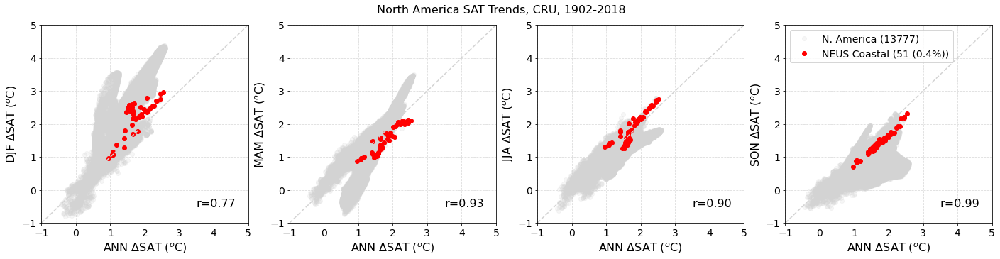

In [53]:
# Arrange data
reload(utls)
dataset = 'cru'
period = 'full'
# Plot ================================
ft  = 16
fig = plt.figure(figsize=(24,5))
nr = 1; nc = 4
for ss, sn in enumerate(['DJF','MAM','JJA','SON']):
    cube1nam = sat_trends_all[period][dataset][sn].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
    cube2nam = sat_trends_all[period][dataset]['ANN'].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))

    cube1nhem = sat_trends_all[period][dataset][sn].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))
    cube2nhem = sat_trends_all[period][dataset]['ANN'].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

    cube1 = sat_trends_all[period][dataset][sn].extract(utls.getLatLonCtr([-130,-55,25,50]))
    cube2 = sat_trends_all[period][dataset]['ANN'].extract(utls.getLatLonCtr([-130,-55,25,50]))

    cube1ne = sat_trends_all[period][dataset][sn].extract(regCtrNEBOX)
    cube2ne = sat_trends_all[period][dataset]['ANN'].extract(regCtrNEBOX)

    cube1ne = mylib.applyMask(cube1ne, neus_masks_coastal[dataset]) #crumaskcoastalnew) #crumaskcoastal)
    cube2ne = mylib.applyMask(cube2ne, neus_masks_coastal[dataset]) #crumaskcoastalnew) #crumaskcoastal)

    cubedata1nam = np.reshape(cube1nam.data, (cube1nam.shape[0]*cube1nam.shape[1],1))
    cubedata2nam = np.reshape(cube2nam.data, (cube2nam.shape[0]*cube1nam.shape[1],1))

    cubedata1nhem = np.reshape(cube1nhem.data, (cube1nhem.shape[0]*cube1nhem.shape[1],1))
    cubedata2nhem = np.reshape(cube2nhem.data, (cube2nhem.shape[0]*cube1nhem.shape[1],1))

    cubedata1 = np.reshape(cube1.data, (cube1.shape[0]*cube1.shape[1],1))
    cubedata2 = np.reshape(cube2.data, (cube2.shape[0]*cube1.shape[1],1))

    cubedata1ne = np.reshape(cube1ne.data, (cube1ne.shape[0]*cube1ne.shape[1],1))
    cubedata2ne = np.reshape(cube2ne.data, (cube2ne.shape[0]*cube1ne.shape[1],1))

    # =============================
    indnam  = np.where(cubedata1nam.mask ==False)[0]
    indnhem = np.where(cubedata1nhem.mask==False)[0]
    indne   = np.where(cubedata1ne.mask  ==False)[0]

    ax = plt.subplot(nr,nc,ss+1)
    per = cubedata1ne[indne].shape[0]/cubedata1nam[indnam].shape[0]*100.
    plt.plot(cubedata2nam[indnam],   cubedata1nam[indnam],   'o', color='lightgrey', alpha=0.2, label='N. America (%d)' % cubedata1nam[indnam].shape[0])
    #plt.plot(cubedata2,   cubedata1,   'o', color='lightgrey', alpha=0.2)
    plt.plot(cubedata2ne[indne], cubedata1ne[indne], 'o', color='r', label='NEUS Coastal (%d (%.1f%%))' % (cubedata1ne[indne].shape[0], per))
    lims = [-1, 5]
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    plt.plot(lims, lims, '--', color='lightgrey')
    ax.grid(color='lightgrey', ls='--', alpha=0.8)
    plt.xlabel('ANN $\Delta$SAT ($^o$C)', fontsize=ft)
    plt.ylabel('%s $\Delta$SAT ($^o$C)' % sn, fontsize=ft)
    plt.title('')
    if ss==3: plt.legend(loc=2)
    
    xx = np.array([val[0] for val in cubedata2ne[indne].data])
    yy = np.array([val[0] for val in cubedata1ne[indne].data])
    plt.text(3.5, -0.5, 'r=%.2f' % np.ma.corrcoef(xx,yy)[0,1], fontsize=ft); del xx,yy
    
        
plt.suptitle('North America SAT Trends, CRU, 1902-2018', fontsize=ft)
plt.subplots_adjust(top=0.9)

In [54]:
if False:
    period = 'full'
    season = 'ANN'

    # cru
    dataSet      = 'cru'
    cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
    cubene_c     = mylib.apply_mask(cubene, neus_masks_coastal[dataset])
    cubene_i     = mylib.apply_mask(cubene, neus_masks_interior[dataset])
    cubenam      = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
    cubenhem     = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

In [55]:
# Smoothed time series of all datasets -- figure that Vincent Saba requested
season  = 'ANN'
dataSet = 'cru'
tmpCube = copy.deepcopy(satCru_anom_sea_dict[season])
tmpCube_nam    = mylib.areaAverage( tmpCube.extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) )
tmpCube_nhem   = mylib.areaAverage( tmpCube.extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) )
tmpCube_neus   = mylib.areaAverage( tmpCube.extract(regCtrNEBOX) )
tmpCube_neus_c = mylib.areaAverage( mylib.applyMask(tmpCube.extract(regCtrNEBOX), neus_masks_coastal[dataSet]) )
tmpCube_neus_i = mylib.areaAverage( mylib.applyMask(tmpCube.extract(regCtrNEBOX), neus_masks_interior[dataSet]) )
del season, dataSet

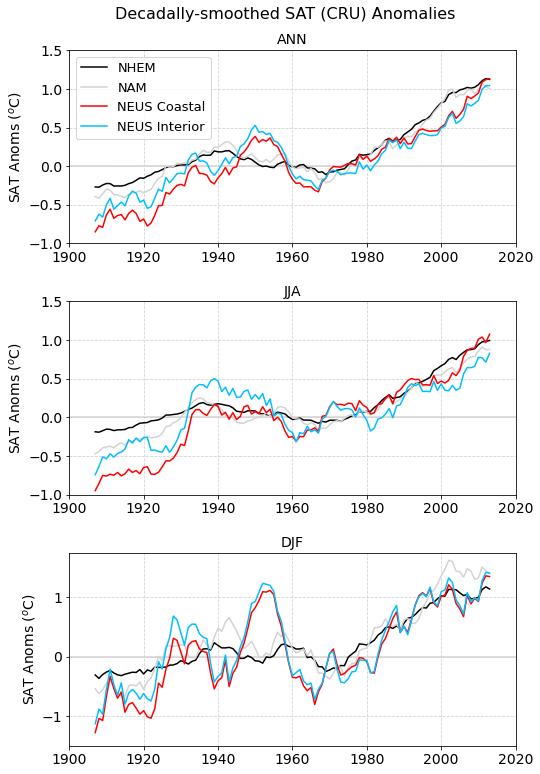

In [56]:
# Smoothed time series of all datasets -- figure that Vincent Saba requested
dataSet = 'cru'

mName = 'NAO'
naoBars = False

nr=3; nc=1; ft=14
winlen = 11

fig = plt.figure(figsize=(8,12))
for ss, season in enumerate(['ANN','JJA','DJF']):
    
    tmpCube = copy.deepcopy(satCru_anom_sea_dict[season])
    tmpCube_nam    = mylib.areaAverage( tmpCube.extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) )
    tmpCube_nhem   = mylib.areaAverage( tmpCube.extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) )
    tmpCube_neus   = mylib.areaAverage( tmpCube.extract(regCtrNEBOX) )
    tmpCube_neus_c = mylib.areaAverage( mylib.applyMask(tmpCube.extract(regCtrNEBOX), neus_masks_coastal[dataSet]) )
    tmpCube_neus_i = mylib.areaAverage( mylib.applyMask(tmpCube.extract(regCtrNEBOX), neus_masks_interior[dataSet]) )
    
    ax = plt.subplot(nr, nc, ss+1)
    plt.axhline(y=0, color='lightgrey')
    ts = moving_average_ts(tmpCube_nhem,   winlen=winlen)
    tsyr = ts.coord('season_year').points
    plt.plot(tsyr, ts.data, '-',  color=nhemCol, label='NHEM')
    plt.plot(tsyr, moving_average_ts(tmpCube_nam,    winlen=winlen).data,  '-', color=namCol,  label='NAM')
    plt.plot(tsyr, moving_average_ts(tmpCube_neus_c, winlen=winlen).data, '-',  color=cCol,    label='NEUS Coastal')
    plt.plot(tsyr, moving_average_ts(tmpCube_neus_i, winlen=winlen).data, '-',  color=iCol,    label='NEUS Interior')
    ax.set_xlim(1900, 2020)
    if season=='DJF':
        ax.set_ylim(-1.5, 1.75)
    else:
        ax.set_ylim(-1, 1.5)
        
    plt.grid(ls='--', color='lightgrey')
    plt.ylabel('SAT Anoms ($^o$C)', fontsize=ft)
    plt.title(season.upper(), fontsize=ft)
    
    if naoBars:
        ## lineplot
        #modedata = ensutils.extract_years(natmodes.modes['NAO'][season], 1902, 2018)
        #plt.plot(tsyr, moving_average_ts(modedata, winlen=winlen).data, '--',  color='k', label='NAO')
        
        modedata = ensutils.extract_years(natmodes.modes['NAO'][season], 1902, 2018)
        ya = np.arange(1902, 2019, 1)
        #tsyr   = modedata.coord('year').points
        indpos = np.where(modedata.data > 0)
        indneg = np.where(modedata.data < 0)
        plt.bar(ya[indpos], modedata.data[indpos], width=1, color='red',  alpha=0.15, label='%s +ve' % mName)
        plt.bar(ya[indneg], modedata.data[indneg], width=1, color='blue', alpha=0.15, label='%s -ve' % mName)
    
    if ss==0:
        leg = ax.legend(loc=2, fontsize=ft-1)
        #for line, text in zip(leg.get_lines(), leg.get_texts()):
        #    text.set_color(line.get_color())
    
    del tmpCube, tmpCube_nam, tmpCube_nhem, tmpCube_neus, tmpCube_neus_c, tmpCube_neus_i
    
plt.suptitle('Decadally-smoothed SAT (CRU) Anomalies', fontsize=ft+2)
    
plt.subplots_adjust(hspace=0.3, top=0.93)
del season, dataSet

#### Calculate the fraction of land area with warming over 2C for ANN and JJA

In [57]:
import iris.analysis.cartography
def calc_area(cube, regCtr=None, mask=False):
    ndims = cube.ndim
    if ndims!=2:
        raise TypeError('Cube should be 2D')
        
    if regCtr:
        cube = cube.extract(regCtr)
    
    grid_areas_cube = copy.deepcopy(cube)
    grid_areas_cube.data = iris.analysis.cartography.area_weights(cube) * 1e-6  # Get the numbers in km2 instead of m2
    if mask:
        grid_areas_cube = mylib.applyMask( grid_areas_cube, cube )
    
    return grid_areas_cube

ANN: % of area above 2.00: 11.37


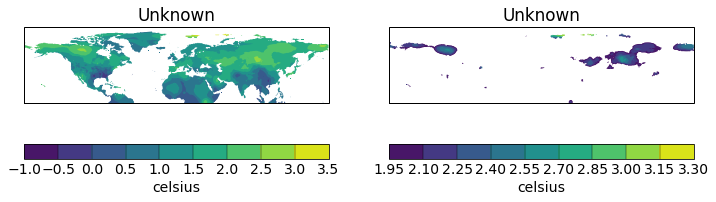

In [58]:
# Calculate fraction of area in the northern hemipshere with trends >= 2C
period  = 'full'
dataSet = 'cru'
season  = 'ANN'
wth     = 2.0
cubenhem = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL']))
cubenhem2C = copy.deepcopy(cubenhem)
cubenhem2C.data = np.ma.masked_less(cubenhem2C.data, wth)

fig = plt.figure(figsize=(12,5))
ax = plt.subplot(121)
iplt.contourf(cubenhem)
ax = plt.subplot(122)
iplt.contourf(cubenhem2C)
# Get cube with area spanned by every gridbox in km2
area_cube_nhem   = calc_area(cubenhem,   mask=True)
area_cube_nhem2C = calc_area(cubenhem2C, mask=True)

# Calculate the total value 
total_area_nhem   = np.ma.sum(area_cube_nhem.data)
total_area_nhem2C = np.ma.sum(area_cube_nhem2C.data)

# What % of are over wth
print('%s: %% of area above %.2f: %.2f' % (season, wth, (total_area_nhem2C/total_area_nhem)*100.))

JJA: % of area above 2.00: 4.30


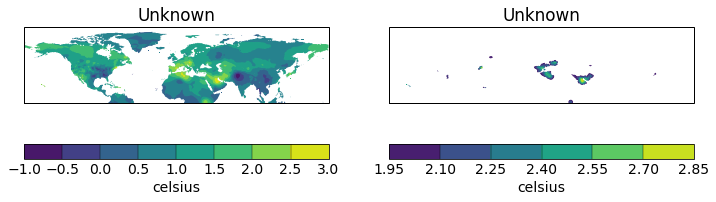

In [59]:
# Calculate fraction of area in the northern hemipshere with trends >= 2C
period  = 'full'
dataSet = 'cru'
season  = 'JJA'
wth     = 2.0
cubenhem = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL']))
cubenhem2C = copy.deepcopy(cubenhem)
cubenhem2C.data = np.ma.masked_less(cubenhem2C.data, wth)

fig = plt.figure(figsize=(12,5))
ax = plt.subplot(121)
iplt.contourf(cubenhem)
ax = plt.subplot(122)
iplt.contourf(cubenhem2C)
# Get cube with area spanned by every gridbox in km2
area_cube_nhem   = calc_area(cubenhem,   mask=True)
area_cube_nhem2C = calc_area(cubenhem2C, mask=True)

# Calculate the total value 
total_area_nhem   = np.ma.sum(area_cube_nhem.data)
total_area_nhem2C = np.ma.sum(area_cube_nhem2C.data)

# What % of are over wth
print('%s: %% of area above %.2f: %.2f' % (season, wth, (total_area_nhem2C/total_area_nhem)*100.))

In [60]:
regCtrNE4

ConstraintCombination(Constraint(coord_values={'longitude': <function between.<locals>.<lambda> at 0x11f1eed30>}), Constraint(coord_values={'latitude': <function between.<locals>.<lambda> at 0x11f1ee940>}), <built-in function and_>)

## Extended Data Figure 1<a id="ExtendedData_Fig1"></a>

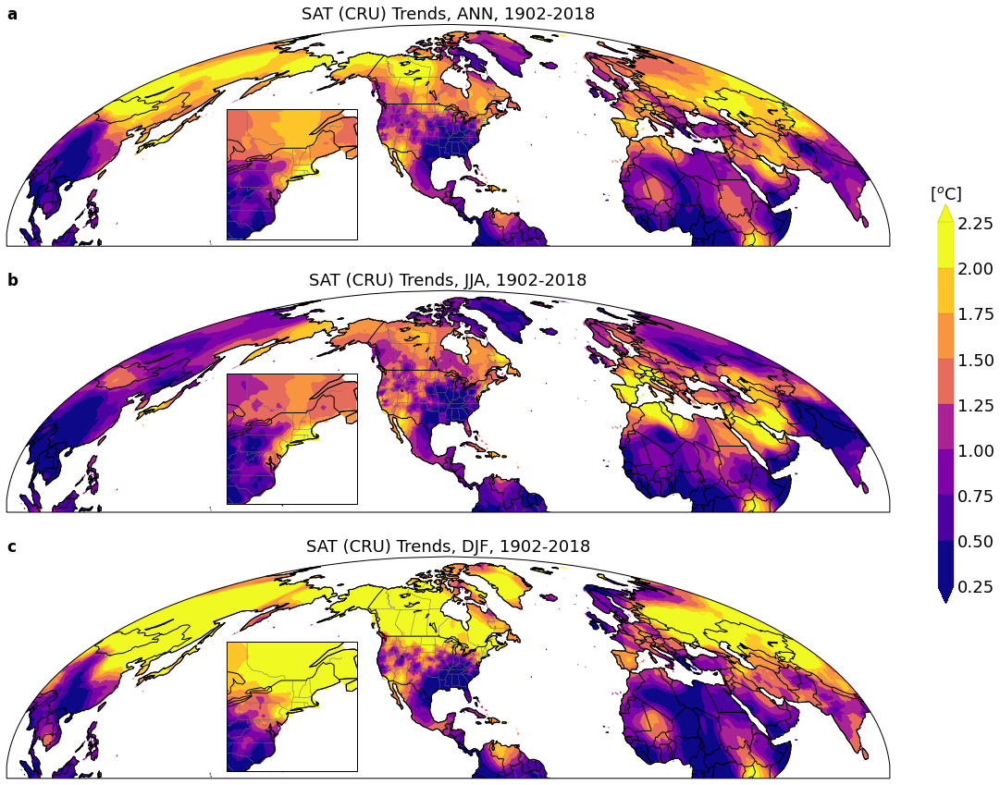

In [61]:
period = 'full'
dataSet = 'cru'
# Plot ++++++++++++++++++++++++++++++++++++++
fig = plt.figure( figsize=(20,15) )
ncolors = 9; col = 'plasma'; cmap = cm.get_cmap(col, ncolors); extend = 'both'; ft=18
clev1 = np.linspace( 0.25, 2.25, ncolors )

# ===========================
pickedSeason = 'ANN'
tmpCube = sat_trends_all[period][dataSet][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL']))
tle = 'SAT (CRU) Trends, %s, 1902-2018' % pickedSeason
ax = plt.subplot(3,1,1, projection=ccrs.Mollweide(central_longitude=-90.)) #ccrs.PlateCarree(central_longitude=0.))
cf = epsc( tmpCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)
utls.plotStates(ax)
plt.title(r'$\bf{a}$', loc='left')

axi = plt.axes([0.33, 0.665, .13, .13], projection=ccrs.PlateCarree())
epsc( tmpCube.extract(regCtrNE4), ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title='', ftsize=ft)
utls.plotStates(axi)
del tmpCube

# ===========================
pickedSeason = 'JJA'
tmpCube = sat_trends_all[period][dataSet][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL']))
ax = plt.subplot(3,1,2, projection=ccrs.Mollweide(central_longitude=-90.)) #ccrs.PlateCarree(central_longitude=0.))
tle = 'SAT (CRU) Trends, %s, 1902-2018' % pickedSeason
cf = epsc( tmpCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)
utls.plotStates(ax)
plt.title(r'$\bf{b}$', loc='left')

axi = plt.axes([0.33, 0.4, .13, .13], projection=ccrs.PlateCarree())
epsc( tmpCube.extract(regCtrNE4), ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title='', ftsize=ft)
utls.plotStates(axi)
del tmpCube

# ===========================
pickedSeason = 'DJF'
tmpCube = sat_trends_all[period][dataSet][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL']))
ax = plt.subplot(3,1,3, projection=ccrs.Mollweide(central_longitude=-90.)) #ccrs.PlateCarree(central_longitude=0.))
tle = 'SAT (CRU) Trends, %s, 1902-2018' % pickedSeason
cf = epsc( tmpCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)
utls.plotStates(ax)
plt.title(r'$\bf{c}$', loc='left')

axi = plt.axes([0.33, 0.132, .13, .13], projection=ccrs.PlateCarree())
epsc( tmpCube.extract(regCtrNE4), ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title='', ftsize=ft)
utls.plotStates(axi)
del tmpCube

# Common colorbar
cbar_ax = fig.add_axes([0.88, 0.3, 0.012, 0.4]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('[$^o$C]', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

saveFig = True
if saveFig:
    figName = 'ExtendedData_Fig1'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

In [62]:
# Find percentiles
dataset = 'cru'
cube1ne   = sat_trends_all['full'][dataset]['JJA'].extract(regCtrNEBOX)
cube1nam  = sat_trends_all['full'][dataset]['JJA'].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
cube1nhem = sat_trends_all['full'][dataset]['JJA'].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

cube1ne       = mylib.applyMask(cube1ne, neus_masks_coastal[dataset])
cubedata1nam  = np.reshape(cube1nam.data, (cube1nam.shape[0]*cube1nam.shape[1],1))
cubedata1nhem = np.reshape(cube1nhem.data, (cube1nhem.shape[0]*cube1nhem.shape[1],1))

# =============================
indnam  = np.where(cubedata1nam.mask ==False)[0]
indnhem = np.where(cubedata1nhem.mask==False)[0]
indne   = np.where(cubedata1ne.mask  ==False)[0]

threshold_val = 2
dataArray = cubedata1nhem[indnhem]
count_vals = sum(i > threshold_val for i in dataArray)
percentile_val = (100. * (1.0 - ( count_vals/len(dataArray) )))[0]
print('CRU: %.2f' % percentile_val)

dataset = 'best'
cube1ne   = sat_trends_all['full'][dataset]['JJA'].extract(regCtrNEBOX)
cube1nam  = sat_trends_all['full'][dataset]['JJA'].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
cube1nhem = sat_trends_all['full'][dataset]['JJA'].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

cube1ne       = mylib.applyMask(cube1ne, neus_masks_coastal[dataset])
cubedata1nam  = np.reshape(cube1nam.data, (cube1nam.shape[0]*cube1nam.shape[1],1))
cubedata1nhem = np.reshape(cube1nhem.data, (cube1nhem.shape[0]*cube1nhem.shape[1],1))

# =============================
indnam  = np.where(cubedata1nam.mask ==False)[0]
indnhem = np.where(cubedata1nhem.mask==False)[0]
indne   = np.where(cubedata1ne.mask  ==False)[0]

threshold_val = 2.5
dataArray = cubedata1nhem[indnhem]
count_vals = sum(i > threshold_val for i in dataArray)
percentile_val = (100. * (1.0 - ( count_vals/len(dataArray) )))[0]
print('BEST: %.2f' % percentile_val)

CRU: 96.56
BEST: 100.00


### Trends

In [63]:
## Calculate BEST trends over the entire region, not just over land
#season = 'JJA'

#tmpBest_anom = tas_ber_mon_anom.extract( utls.getLatLonCtr(utls.reg2bbox['NAM']) )
#tmpBest_anom_sea_dict = {}
#tmpBest_anom_sea_dict.setdefault(season, ensutils.calc_seasonal_mean_local(tmpBest_anom, season, verbose=False)[1])
#tmpBest_anom_sea_trend, pvals0 = calc_cube_trends_local_linalg( tmpBest_anom_sea_dict, [season], years=[1902, 2018] )

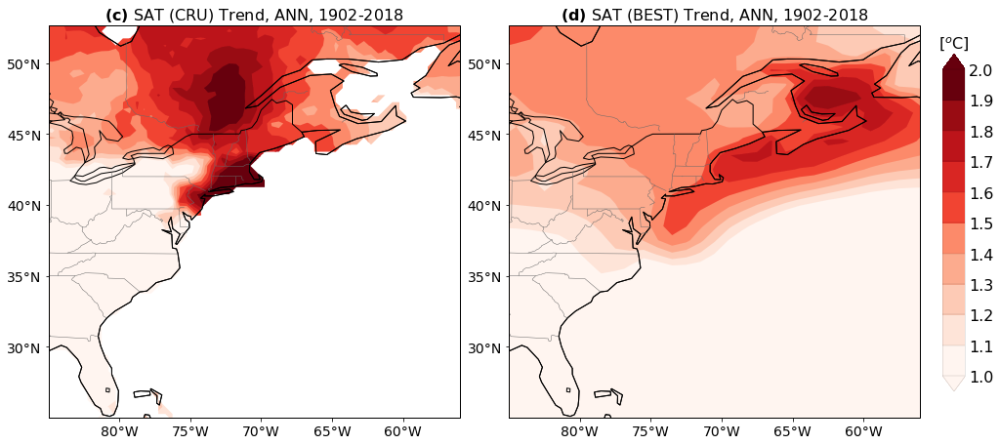

In [64]:
# Plot trends
pickedSeason = 'ANN'

matplotlib.rcParams.update({'font.size':14})
ft = 16
fig = plt.figure(figsize=(16,8))
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 1, 2, ncolors )
mapExtent = [-85,-56,25,52]

# =====================
dummy = sat_trends_all['full']['cru'][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
ax = plt.subplot(1,2,1, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-73)) # 
tle = r'$\bf{(c)}$ SAT (%s) Trend, %s, 1902-2018' % ('CRU', pickedSeason)
cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)
utls.plotStates(ax); ax.set_extent(mapExtent)

ax.set_xticks([-80,-75,-70,-65,-60], crs=ccrs.PlateCarree())
ax.set_yticks([30,35,40,45,50], crs=ccrs.PlateCarree())
lon_formatter = LONGITUDE_FORMATTER #(degree_symbol='', dateline_direction_label=True)
lat_formatter = LATITUDE_FORMATTER #(degree_symbol='')
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)

#gl = ax.gridlines(crs=ccrs.PlateCarree()) #, draw_labels=False, linewidth=1, ls='--', color='lightgray', alpha=0.5, linestyle='-')
#gl.xlabels_top   = False
#gl.ylabels_right = False
#ax.set_xticks([-80,-70,-60], crs=ccrs.PlateCarree())
#ax.set_yticks([30,40,50], crs=ccrs.PlateCarree())
#gl.xlocator   = mticker.FixedLocator([-80, -70, -60])
#gl.xformatter = LONGITUDE_FORMATTER
#gl.ylocator   = mticker.FixedLocator([30, 40, 50])
#gl.yformatter = LATITUDE_FORMATTER

# =====================
dummy = sat_trends_all['full']['best'][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
ax = plt.subplot(1,2,2, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-73)) # P
tle = r'$\bf{(d)}$ SAT (%s) Trend, %s, 1902-2018' % ('BEST', pickedSeason)
cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)
utls.plotStates(ax); ax.set_extent(mapExtent)
#tmpBest_anom_sea_trend[season]

ax.set_xticks([-80,-75,-70,-65,-60], crs=ccrs.PlateCarree())
ax.set_yticks([30,35,40,45,50], crs=ccrs.PlateCarree())
lon_formatter = LONGITUDE_FORMATTER #(degree_symbol='', dateline_direction_label=True)
lat_formatter = LATITUDE_FORMATTER #(degree_symbol='')
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)

cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf1, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('[$^o$C]', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

plt.subplots_adjust(wspace=0.12)

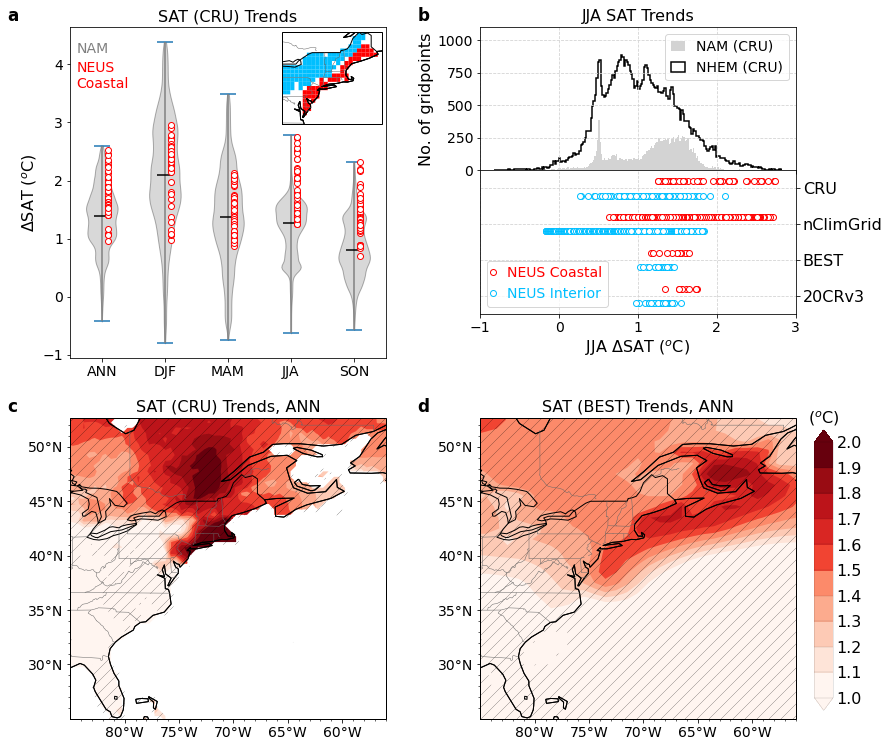

In [65]:
# Putting together Figure 1 (OLD)
# Plot seasonal trend and JJA trend distributions
matplotlib.rcParams.update({'font.size':14, 'hatch.color':'k', 'hatch.linewidth':0.2})
reload(utls)
def __extract_reshape_trends(dataSet, dataCube, maskDict):
    cubeDummy = mylib.applyMask(dataCube, maskDict[dataSet])
    dataArray = np.reshape(cubeDummy.data, (cubeDummy.shape[0]*cubeDummy.shape[1],1))
    del cubeDummy
    return dataArray

period = 'full'
season = 'JJA'

# cru
dataSet      = 'cru'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
cubenam      = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
cubenhem     = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

datane_cru_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_cru_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene
datanam_cru  = np.reshape(cubenam.data,  (cubenam.shape[0] * cubenam.shape[1],1)); del cubenam
datanhem_cru = np.reshape(cubenhem.data, (cubenhem.shape[0]*cubenhem.shape[1],1)); del cubenhem

# ncg
dataSet      = 'ncg'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_ncg_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_ncg_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# ncg
dataSet      = 'best'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_best_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_best_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# 20cr
dataSet      = '20cr'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_20cr_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_20cr_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# Plot ================================
ft  = 16
fig = plt.figure(figsize=(13,13))
grid = plt.GridSpec(8, 2, hspace=0.9, wspace=0.3)

# =============================
#ax = plt.subplot(131)
ax = plt.subplot(grid[0:4, 0])
bp = plt.violinplot(namMat_cru[:,0:5], vert=True, showmedians=True, showmeans=False)
bp['cbars'].set_color('grey')
bp['cmedians'].set_color('k')
for vp in bp['bodies']:
    vp.set_facecolor('grey')
    vp.set_edgecolor('k')
    
for ii in np.arange(5):
    plt.plot( np.ones(neMat_cru[:,ii].shape[0])+ii+0.1, neMat_cru[:,ii], 'ro', ms=6, mfc='w', label='NEUS')
    
ax.set_xticks(np.arange(6))
snNames = copy.deepcopy(seasonList)
snNames.insert(0,'')
ax.set_xticklabels(snNames[0:6])
ax.set_xlim([0.5, 5.5])
plt.title(r'SAT (CRU) Trends', fontsize=ft)
plt.title(r'$\bf{a}$', loc='left', x=-0.2)
plt.ylabel('$\Delta$SAT ($^o$C)', fontsize=ft)
plt.text(0.6, 4.2, 'NAM', color='grey', ha='left', fontsize=ft-2)
plt.text(0.6, 3.6, 'NEUS\nCoastal', color='red', ha='left', fontsize=ft-2)
#plt.legend(loc=1)
#plt.text(0.6, 4.3, '(a)', fontsize=ft)

# =============================
indnam  = np.where(datanam_cru.mask ==False)[0]
indnhem = np.where(datanhem_cru.mask==False)[0]
indne_c = np.where(datane_cru_c.mask==False)[0]
indne_i = np.where(datane_cru_i.mask==False)[0]

bpPlot=True
namCol = 'lightgrey'
nhemCol = 'k'

#ax = plt.subplot(133)
ax = plt.subplot(grid[0:2, 1])
hh = plt.hist(datanam_cru[indnam], 200, density=False, color=namCol, label='NAM (CRU)') #'(%d)' % cubedata1nam[indnam].shape[0])
hh = plt.hist(datanhem_cru[indnhem], 200, density=False, color=nhemCol, histtype='step', lw=1.5, label='NHEM (CRU)') #' (%d)' % cubedata1nhem[indnhem].shape[0])

ax.set_xlim([-1, 3])
plt.title(r'JJA SAT Trends', fontsize=ft)
plt.title(r'$\bf{b}$', loc='left', x=-0.2)

plt.ylabel('No. of gridpoints', fontsize=ft)
plt.legend(loc=1, fontsize=ft-2, handlelength=1)
ax.set_ylim([0, 1100])
ax.set_xticklabels([])
ax.grid(ls='--', color='lightgrey')
#plt.text(-0.85, 970, '(b)', fontsize=ft)

# =============================
#ax = plt.subplot(133)
axb = plt.subplot(grid[2:4, 1])

iCol = 'deepskyblue'
cCol = 'red'

indne_20cr = np.where(datane_20cr_c.mask==False)[0]
xx = datane_20cr_c[indne_20cr]
plt.plot(xx, np.zeros((xx.shape[0],1))+1.2, 'o', color=cCol, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_20cr

indne_20cr = np.where(datane_20cr_i.mask==False)[0]
xx = datane_20cr_i[indne_20cr]
plt.plot(xx, np.zeros((xx.shape[0],1))+0.8, 'o', color=iCol, ms=6, mfc='w') #, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_20cr

indne_best = np.where(datane_best_c.mask==False)[0]
xx = datane_best_c[indne_best]
plt.plot(xx, np.zeros((xx.shape[0],1))+2.2, 'o', color=cCol, mfc='w', ms=6) #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_best

indne_best = np.where(datane_best_i.mask==False)[0]
xx = datane_best_i[indne_best]
plt.plot(xx, np.zeros((xx.shape[0],1))+1.8, 'o', color=iCol, ms=6, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_best

indne_ncg = np.where(datane_ncg_c.mask==False)[0]
xx = datane_ncg_c[indne_ncg]
plt.plot(xx, np.zeros((xx.shape[0],1))+3.2, 'o', color=cCol, mfc='w', ms=6) #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_ncg[indne_ncg].shape[0])
del xx, indne_ncg

indne_ncg = np.where(datane_ncg_i.mask==False)[0]
xx = datane_ncg_i[indne_ncg]
plt.plot(xx, np.zeros((xx.shape[0],1))+2.8, 'o', color=iCol, ms=6, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_ncg[indne_ncg].shape[0])
del xx, indne_ncg

xx = datane_cru_c[indne_c]
plt.plot(xx, np.zeros((xx.shape[0],1))+4.2, 'o', color=cCol, mfc='w', ms=6, label='NEUS Coastal') #, label='NEUS Coastal (%d)' % cubedata1ne[indne].shape[0])
#bp = plt.boxplot(xx, positions=[4.2], vert=False)
del xx

xx = datane_cru_i[indne_i]
plt.plot(xx, np.zeros((xx.shape[0],1))+3.8, 'o', color=iCol, ms=6, mfc='w', label='NEUS Interior') #, label='NEUS Coastal (%d)' % cubedata1ne[indne].shape[0])
#bp = plt.boxplot(xx, positions=[3.8], vert=False) #, showmedians=True, showmeans=False)
del xx

axb.set_ylim(0.5, 4.5)
axb.set_xlim([-1, 3])
axb.yaxis.tick_right()
axb.set_yticks([1,2,3,4])
axb.set_yticklabels(['20CRv3','BEST','nClimGrid','CRU'], fontsize=ft)
#axb.yaxis.set_label_position("right")
axb.grid(ls='--', color='lightgrey')
plt.xlabel('JJA $\Delta$SAT ($^o$C)', fontsize=ft)
#plt.legend(loc=3)

#leg = ax.legend(loc=3)
#for color, text in zip([cCol, iCol], leg.get_texts()):
#    text.set_color(color)
    
leg = axb.legend(loc=3, fontsize=ft-2, handletextpad=1.0, handlelength=0)
for line, text in zip(leg.get_lines(), leg.get_texts()):
    text.set_color(line.get_color())
    
# This block is to move bottom panel of b slightly up so it overlaps with the top one
bbox=plt.gca().get_position()
#offset=1  #0.04
#axb.set_position([bbox.x0, bbox.y0 + offset, bbox.x1-bbox.x0, bbox.y1 - bbox.y0])
########

#from mpl_toolkits.axes_grid.inset_locator import inset_axes
#inset
axi = plt.axes([0.33, 0.675, .2, .2], projection=ccrs.PlateCarree())
#axi = inset_axes(ax, width="30%", height="30%") #,projection=ccrs.PlateCarree())
ncolors = 1; cols = [iCol, cCol] #; clev1 = np.arange()
for rr, maskreg in enumerate([neus_masks_interior['cru'], neus_masks_coastal['cru']]):
    #cmap = cm.get_cmap(cols[rr], ncolors)
    cmap = matplotlib.colors.ListedColormap(cols[rr])
    iplt.pcolor(maskreg, cmap=cmap)
    #epsc(maskreg, axi, clev=clev1, cmap=cmap)
    axi.coastlines(linewidth=1) #0.2
    cb=plt.colorbar()
    cb.remove()
    plt.gcf().delaxes(plt.gcf().axes[4])
    
axi.set_title('')
utls.plotStates(axi)
#axi.set_extent(utls.reg2bbox['NEBOX'])

# ====================================================
pickedSeason = 'ANN'
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 1, 2, ncolors )
mapExtent = [-85,-56,25,52]
pval_th = 0.05

# =====================
dummy = sat_trends_all['full']['cru'][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2']))   #'ENA2' used to be NAM
ax = plt.subplot(grid[4:8,0], projection=ccrs.PlateCarree())
#ax = plt.subplot(1,2,1, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-73)) # 
tle = r'SAT (%s) Trends, %s' % ('CRU', pickedSeason)
cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)

# hatching
dummy_p = copy.deepcopy( sat_pvals_mk['full']['cru'].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2'])) )   #'ENA2' used to be NAM
dummy_p.data = np.ma.masked_greater(dummy_p.data, pval_th)
dummy_hatched = mylib.applyMask(dummy, dummy_p)
cf_dummy = iplt.pcolor(dummy_hatched, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=False, pad=-0.05)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[5])
del dummy_p, dummy_hatched, cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{c}$', loc='left', x=-0.2)

# =====================
dummy = sat_trends_all['full']['best'][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2']))   #'ENA2' used to be NAM
ax = plt.subplot(grid[4:8, 1], projection=ccrs.PlateCarree())
#ax = plt.subplot(1,2,2, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-73)) # P
tle = r'SAT (%s) Trends, %s' % ('BEST', pickedSeason)
cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)

# hatching
dummy_p = copy.deepcopy( sat_pvals_mk['full']['best'].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2'])) )   #'ENA2' used to be NAM
dummy_p.data = np.ma.masked_greater(dummy_p.data, pval_th)
dummy_hatched = mylib.applyMask(dummy, dummy_p)
cf_dummy = iplt.pcolor(dummy_hatched, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=False, pad=0.1)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[6])
del dummy_p, dummy_hatched #, cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{d}$', loc='left', x=-0.2)
#tmpBest_anom_sea_trend[season]

plt.subplots_adjust(right=0.9)
offset = 0.0475
axb.set_position([bbox.x0, bbox.y0 + offset, bbox.x1-bbox.x0, bbox.y1 - bbox.y0])

cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
#cbar_ax = fig.add_axes([0.85, 0.2, 0.02, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf1, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('($^o$C)', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

#plt.subplots_adjust(wspace=0.12)
saveFig = False
if saveFig:
    figName = 'Fig1old'
    fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

##### Calculate SST trends (Mann-Kendall)

In [66]:
sstCube = ensutils.calc_seasonal_mean_local(hadisst_mon_anom, 'ANN', verbose=False)[1]
sst_trends_mk, sst_pvals_mk, sst_hvals_mk = calc_single_cube_trends_local_mk( sstCube.extract( utls.getLatLonCtr([-82,-55,25,50]) ) )

117
3.9271368980407715


## FIGURE 1<a id="Figure1"></a>

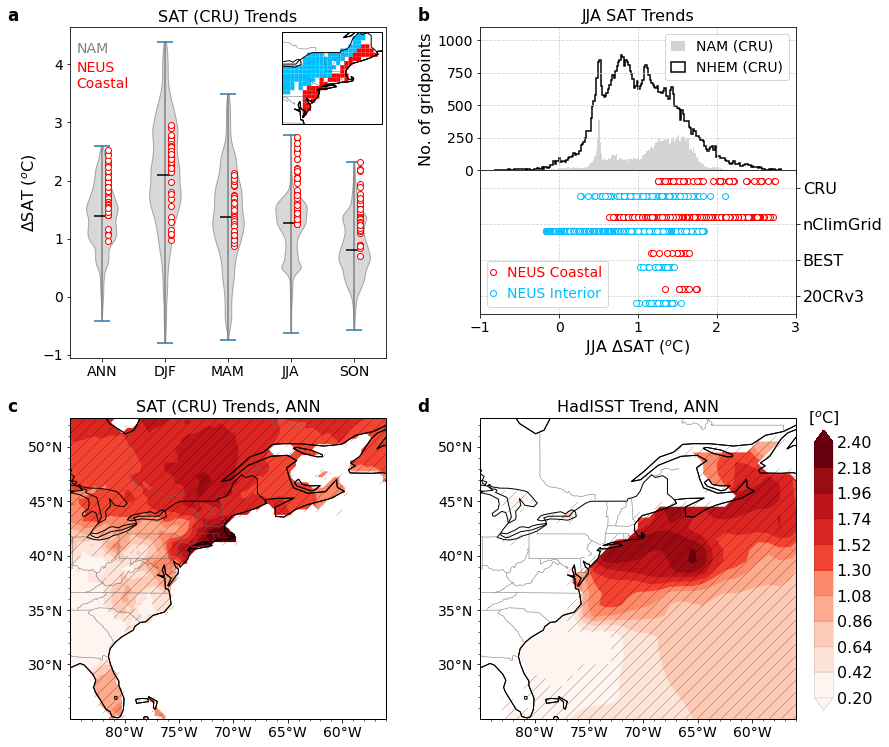

In [67]:
# Putting together Figure 1
# Plot seasonal trend and JJA trend distributions
matplotlib.rcParams.update({'font.size':14, 'hatch.color':'k', 'hatch.linewidth':0.2})
reload(utls)
def __extract_reshape_trends(dataSet, dataCube, maskDict):
    cubeDummy = mylib.applyMask(dataCube, maskDict[dataSet])
    dataArray = np.reshape(cubeDummy.data, (cubeDummy.shape[0]*cubeDummy.shape[1],1))
    del cubeDummy
    return dataArray

period = 'full'
season = 'JJA'

# cru
dataSet      = 'cru'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
cubenam      = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NAM'])) #[-180,180,30,60]))
cubenhem     = sat_trends_all[period][dataSet][season].extract(utls.getLatLonCtr(utls.reg2bbox['NHEMFULL'])) #[-180,180,30,60]))

datane_cru_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_cru_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene
datanam_cru  = np.reshape(cubenam.data,  (cubenam.shape[0] * cubenam.shape[1],1)); del cubenam
datanhem_cru = np.reshape(cubenhem.data, (cubenhem.shape[0]*cubenhem.shape[1],1)); del cubenhem

# ncg
dataSet      = 'ncg'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_ncg_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_ncg_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# ncg
dataSet      = 'best'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_best_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_best_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# 20cr
dataSet      = '20cr'
cubene       = sat_trends_all[period][dataSet][season].extract(regCtrNEBOX)
datane_20cr_c = __extract_reshape_trends(dataSet, cubene, neus_masks_coastal)
datane_20cr_i = __extract_reshape_trends(dataSet, cubene, neus_masks_interior); del cubene

# Plot ================================
ft  = 16
fig = plt.figure(figsize=(13,13))
grid = plt.GridSpec(8, 2, hspace=0.9, wspace=0.3)

# =============================
#ax = plt.subplot(131)
ax = plt.subplot(grid[0:4, 0])
bp = plt.violinplot(namMat_cru[:,0:5], vert=True, showmedians=True, showmeans=False)
bp['cbars'].set_color('grey')
bp['cmedians'].set_color('k')
for vp in bp['bodies']:
    vp.set_facecolor('grey')
    vp.set_edgecolor('k')
    
for ii in np.arange(5):
    plt.plot( np.ones(neMat_cru[:,ii].shape[0])+ii+0.1, neMat_cru[:,ii], 'ro', ms=6, mfc='w', label='NEUS')
    
ax.set_xticks(np.arange(6))
snNames = copy.deepcopy(seasonList)
snNames.insert(0,'')
ax.set_xticklabels(snNames[0:6])
ax.set_xlim([0.5, 5.5])
plt.title(r'SAT (CRU) Trends', fontsize=ft)
plt.title(r'$\bf{a}$', loc='left', x=-0.2)
plt.ylabel('$\Delta$SAT ($^o$C)', fontsize=ft)
plt.text(0.6, 4.2, 'NAM', color='grey', ha='left', fontsize=ft-2)
plt.text(0.6, 3.6, 'NEUS\nCoastal', color='red', ha='left', fontsize=ft-2)
#plt.legend(loc=1)
#plt.text(0.6, 4.3, '(a)', fontsize=ft)

# =============================
indnam  = np.where(datanam_cru.mask ==False)[0]
indnhem = np.where(datanhem_cru.mask==False)[0]
indne_c = np.where(datane_cru_c.mask==False)[0]
indne_i = np.where(datane_cru_i.mask==False)[0]

bpPlot=True
namCol = 'lightgrey'
nhemCol = 'k'

#ax = plt.subplot(133)
ax = plt.subplot(grid[0:2, 1])
hh = plt.hist(datanam_cru[indnam], 200, density=False, color=namCol, label='NAM (CRU)') #'(%d)' % cubedata1nam[indnam].shape[0])
hh = plt.hist(datanhem_cru[indnhem], 200, density=False, color=nhemCol, histtype='step', lw=1.5, label='NHEM (CRU)') #' (%d)' % cubedata1nhem[indnhem].shape[0])

ax.set_xlim([-1, 3])
plt.title(r'JJA SAT Trends', fontsize=ft)
plt.title(r'$\bf{b}$', loc='left', x=-0.2)

plt.ylabel('No. of gridpoints', fontsize=ft)
plt.legend(loc=1, fontsize=ft-2, handlelength=1)
ax.set_ylim([0, 1100])
ax.set_xticklabels([])
ax.grid(ls='--', color='lightgrey')
#plt.text(-0.85, 970, '(b)', fontsize=ft)

# =============================
#ax = plt.subplot(133)
axb = plt.subplot(grid[2:4, 1])

iCol = 'deepskyblue'
cCol = 'red'

indne_20cr = np.where(datane_20cr_c.mask==False)[0]
xx = datane_20cr_c[indne_20cr]
plt.plot(xx, np.zeros((xx.shape[0],1))+1.2, 'o', color=cCol, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_20cr

indne_20cr = np.where(datane_20cr_i.mask==False)[0]
xx = datane_20cr_i[indne_20cr]
plt.plot(xx, np.zeros((xx.shape[0],1))+0.8, 'o', color=iCol, ms=6, mfc='w') #, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_20cr

indne_best = np.where(datane_best_c.mask==False)[0]
xx = datane_best_c[indne_best]
plt.plot(xx, np.zeros((xx.shape[0],1))+2.2, 'o', color=cCol, mfc='w', ms=6) #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_best

indne_best = np.where(datane_best_i.mask==False)[0]
xx = datane_best_i[indne_best]
plt.plot(xx, np.zeros((xx.shape[0],1))+1.8, 'o', color=iCol, ms=6, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_best[indne_best].shape[0])
del xx, indne_best

indne_ncg = np.where(datane_ncg_c.mask==False)[0]
xx = datane_ncg_c[indne_ncg]
plt.plot(xx, np.zeros((xx.shape[0],1))+3.2, 'o', color=cCol, mfc='w', ms=6) #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_ncg[indne_ncg].shape[0])
del xx, indne_ncg

indne_ncg = np.where(datane_ncg_i.mask==False)[0]
xx = datane_ncg_i[indne_ncg]
plt.plot(xx, np.zeros((xx.shape[0],1))+2.8, 'o', color=iCol, ms=6, mfc='w') #, ms=6, label='NEUS Coastal (%d)' % cubedata1ne_ncg[indne_ncg].shape[0])
del xx, indne_ncg

xx = datane_cru_c[indne_c]
plt.plot(xx, np.zeros((xx.shape[0],1))+4.2, 'o', color=cCol, mfc='w', ms=6, label='NEUS Coastal') #, label='NEUS Coastal (%d)' % cubedata1ne[indne].shape[0])
#bp = plt.boxplot(xx, positions=[4.2], vert=False)
del xx

xx = datane_cru_i[indne_i]
plt.plot(xx, np.zeros((xx.shape[0],1))+3.8, 'o', color=iCol, ms=6, mfc='w', label='NEUS Interior') #, label='NEUS Coastal (%d)' % cubedata1ne[indne].shape[0])
#bp = plt.boxplot(xx, positions=[3.8], vert=False) #, showmedians=True, showmeans=False)
del xx

axb.set_ylim(0.5, 4.5)
axb.set_xlim([-1, 3])
axb.yaxis.tick_right()
axb.set_yticks([1,2,3,4])
axb.set_yticklabels(['20CRv3','BEST','nClimGrid','CRU'], fontsize=ft)
#axb.yaxis.set_label_position("right")
axb.grid(ls='--', color='lightgrey')
plt.xlabel('JJA $\Delta$SAT ($^o$C)', fontsize=ft)
#plt.legend(loc=3)

#leg = ax.legend(loc=3)
#for color, text in zip([cCol, iCol], leg.get_texts()):
#    text.set_color(color)
    
leg = axb.legend(loc=3, fontsize=ft-2, handletextpad=1.0, handlelength=0)
for line, text in zip(leg.get_lines(), leg.get_texts()):
    text.set_color(line.get_color())
    
# This block is to move bottom panel of b slightly up so it overlaps with the top one
bbox=plt.gca().get_position()
#offset=1  #0.04
#axb.set_position([bbox.x0, bbox.y0 + offset, bbox.x1-bbox.x0, bbox.y1 - bbox.y0])
########

#from mpl_toolkits.axes_grid.inset_locator import inset_axes
#inset
axi = plt.axes([0.33, 0.675, .2, .2], projection=ccrs.PlateCarree())
#axi = inset_axes(ax, width="30%", height="30%") #,projection=ccrs.PlateCarree())
ncolors = 1; cols = [iCol, cCol] #; clev1 = np.arange()
for rr, maskreg in enumerate([neus_masks_interior['cru'], neus_masks_coastal['cru']]):
    #cmap = cm.get_cmap(cols[rr], ncolors)
    cmap = matplotlib.colors.ListedColormap(cols[rr])
    iplt.pcolor(maskreg, cmap=cmap)
    #epsc(maskreg, axi, clev=clev1, cmap=cmap)
    axi.coastlines(linewidth=1) #0.2
    cb=plt.colorbar()
    cb.remove()
    plt.gcf().delaxes(plt.gcf().axes[4])
    
axi.set_title('')
utls.plotStates(axi)
#axi.set_extent(utls.reg2bbox['NEBOX'])

# ====================================================
pickedSeason = 'ANN'
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0.2, 2.4, ncolors )
mapExtent = [-85,-56,25,52]
pval_th = 0.05

# =====================
dummy = sat_trends_all['full']['cru'][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2']))
ax = plt.subplot(grid[4:8,0], projection=ccrs.PlateCarree())
#ax = plt.subplot(1,2,1, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-73)) # 
tle = r'SAT (%s) Trends, %s' % ('CRU', pickedSeason)
cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)

# hatching
dummy_p = copy.deepcopy( sat_pvals_mk['full']['cru'].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2'])) )
dummy_p.data = np.ma.masked_greater(dummy_p.data, pval_th)
dummy_hatched = mylib.applyMask(dummy, dummy_p)
cf_dummy = iplt.pcolor(dummy_hatched, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=False, pad=-0.05)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[5])
del dummy_p, dummy_hatched, cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{c}$', loc='left', x=-0.2)

# =====================
ax = plt.subplot(grid[4:8, 1], projection=ccrs.PlateCarree())
tle = 'HadISST Trend, %s' % pickedSeason
cf1 = epsc( sst_trends_mk, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft, unit='$^o$C')

# hatching
dummy_p = copy.deepcopy( sst_pvals_mk )
dummy_p.data = np.ma.masked_greater(dummy_p.data, pval_th)
dummy_hatched = mylib.applyMask(sst_trends_mk, dummy_p)
cf_dummy = iplt.pcolor(dummy_hatched, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=False, pad=0.1)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[6])   # 7 is colorbar is included in the epsc
del dummy_p, dummy_hatched#, cf_dummy, colorBar

if False:
    dummy = sat_trends_all['full']['20cr'][pickedSeason].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2']))
    ax = plt.subplot(grid[4:8, 1], projection=ccrs.PlateCarree())
    #ax = plt.subplot(1,2,2, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-73)) # P
    tle = r'SAT (%s) Trends, %s' % ('20CRv3', pickedSeason)
    cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)

    # hatching
    dummy_p = copy.deepcopy( sat_pvals_mk['full']['20cr'].extract(utls.getLatLonCtr(utls.reg2bbox['ENA2'])) )
    dummy_p.data = np.ma.masked_greater(dummy_p.data, pval_th)
    dummy_hatched = mylib.applyMask(dummy, dummy_p)
    cf_dummy = iplt.pcolor(dummy_hatched, hatch='//', alpha=0, cmap=cmap)
    colorBar = plt.colorbar(cf_dummy, use_gridspec=False, pad=0.1)
    colorBar.remove()
    plt.gcf().delaxes(plt.gcf().axes[6])
    del dummy_p, dummy_hatched #, cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{d}$', loc='left', x=-0.2)
#tmpBest_anom_sea_trend[season]

plt.subplots_adjust(right=0.9)
offset = 0.0475
axb.set_position([bbox.x0, bbox.y0 + offset, bbox.x1-bbox.x0, bbox.y1 - bbox.y0])

cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
#cbar_ax = fig.add_axes([0.85, 0.2, 0.02, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf1, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('[$^o$C]', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

#plt.subplots_adjust(wspace=0.12)
saveFig = True
if saveFig:
    figName = 'Fig1'
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

## Supplementary Figure 1<a id="Supp_Fig1"></a>

#### Plot trends for all seasons for 1902-2018 

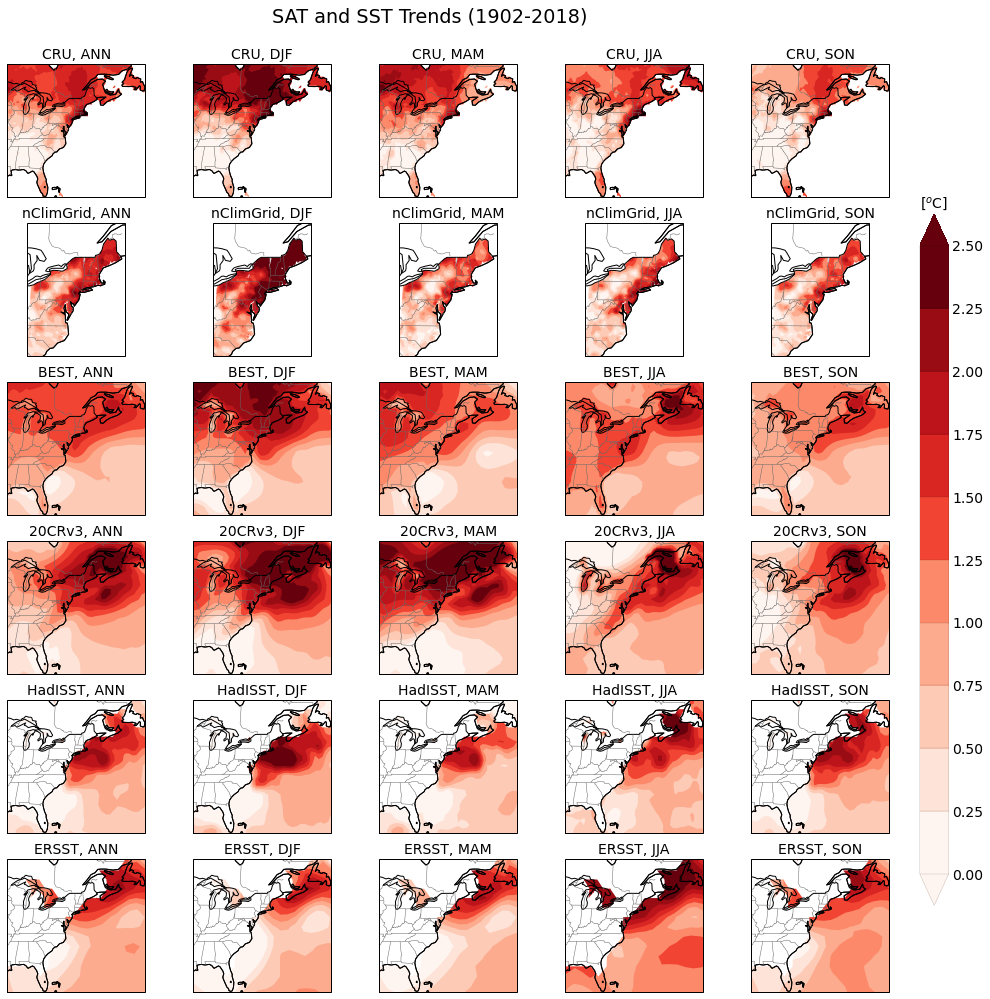

In [68]:
# supp_fig2
plotPeriod = 'full'
plotPeriodName = '1902-2018'
#figName = 'tas_trends_seasonal_%s' % plotPeriodName

matplotlib.rcParams.update({'font.size':16})
ft = 14
fig = plt.figure(figsize=(20,16))
nr=6; nc=5; kk=1
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0, 2.5, ncolors )
mapExtent = [-90,-56,25,52]

for dname in ['cru','ncg','best','20cr','hadisst','ersst']:
    for season in ['ANN','DJF','MAM','JJA','SON']:
        if dname=='hadisst':
            dummy = sst_trends_mk_sea_dict[season]
        elif dname=='ersst':
            dummy = esst_trends_mk_sea_dict[season]
        else:
            dummy = sat_trends_all[plotPeriod][dname][season]
        if dname is not 'ncg':
            dummy = dummy.extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
        ax = plt.subplot(nr, nc, kk, projection=ccrs.Mollweide(central_longitude=-73)) # PlateCarree())
        tle = '%s, %s' % (obsAbbr2Full[dname], season)
        cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)
        utls.plotStates(ax)
        if dname is not 'ncg':
            ax.set_extent(mapExtent)
        kk+=1
        
plt.subplots_adjust(wspace=-0.5, hspace=0.2, top=0.93)
plt.suptitle('SAT and SST Trends (%s)' % plotPeriodName)

cbar_ax = fig.add_axes([0.84, 0.2, 0.02, 0.6]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf1, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('[$^o$C]', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

saveFig = True
if saveFig:
    figName = 'Supp_Fig1'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of page](#outline)

## Supplementary Figure 2<a id="Supp_Fig2"></a>

In [69]:
sst_trends_mk_dict = {}
sstCube0 = ensutils.calc_seasonal_mean_local(hadisst_mon_anom, 'ANN', verbose=False)[1]

sstCube = ensutils.extract_years(sstCube0, 1902, 2018)
sst_trends_mk, sst_pvals_mk, sst_hvals_mk = calc_single_cube_trends_local_mk( sstCube.extract( utls.getLatLonCtr([-82,-55,25,50]) ) )
sst_trends_mk_dict.setdefault('full', sst_trends_mk); del sstCube

sstCube = ensutils.extract_years(sstCube0, 1902, 1960)
sst_trends_mk, sst_pvals_mk, sst_hvals_mk = calc_single_cube_trends_local_mk( sstCube.extract( utls.getLatLonCtr([-82,-55,25,50]) ) )
sst_trends_mk_dict.setdefault('early', sst_trends_mk); del sstCube

sstCube = ensutils.extract_years(sstCube0, 1959, 2018)
sst_trends_mk, sst_pvals_mk, sst_hvals_mk = calc_single_cube_trends_local_mk( sstCube.extract( utls.getLatLonCtr([-82,-55,25,50]) ) )
sst_trends_mk_dict.setdefault('late', sst_trends_mk); del sstCube

del sstCube0 

117
3.9468190670013428
59
2.9273369312286377
60
2.9331459999084473


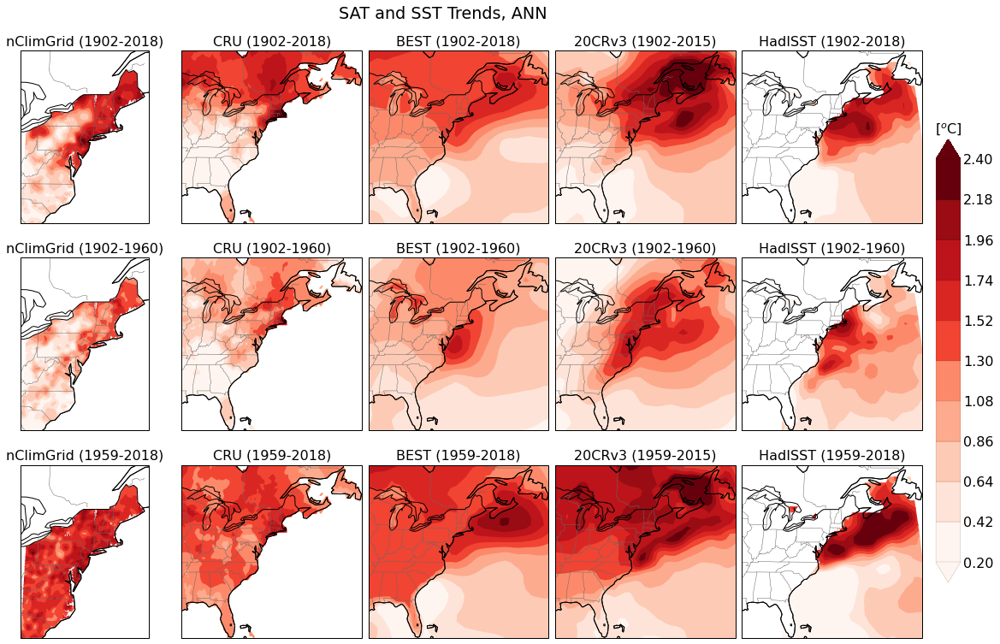

In [70]:
# supp_fig2
matplotlib.rcParams.update({'font.size':16})
ft = 16
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0.2, 2.4, ncolors )
mapExtent = [-90,-56,25,52]

# ===============================================
fig = plt.figure(figsize=(20,12))
nr=3; nc=5; kk=1
pickedSeason = 'ANN'

# ===============================================
for dname in ['ncg','cru','best','20cr','sst']:
    if dname=='sst':
        dummy = sst_trends_mk_dict['full']
    else:
        dummy = sat_trends_all['full'][dname][pickedSeason]
        if dname is not 'ncg':
            dummy = dummy.extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
    
    ax = plt.subplot(nr, nc, kk, projection=ccrs.Mollweide(central_longitude=-73)) # PlateCarree())
    
    if dname=='20cr':
        tle = '20CRv3 (1902-2015)'
    elif dname=='ncg':
        tle = 'nClimGrid (1902-2018)'
    elif dname=='sst':
        tle = 'HadISST (1902-2018)'
    else:
        tle = '%s (1902-2018)' % (dname.upper())
    cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)

    # hatching
    if False:
        if dname!='ncg':
            dummy_p.data = np.ma.masked_greater(dummy_p.data, pval_th)
            dummy_hatched = mylib.applyMask(dummy, dummy_p)
            cf_dummy = iplt.pcolor(dummy_hatched, hatch='//', alpha=0, cmap=cmap)
            colorBar = plt.colorbar(cf_dummy, use_gridspec=False, pad=0.1)
            colorBar.remove()
            plt.gcf().delaxes(plt.gcf().axes[kk])   # 7 is colorbar is included in the epsc
            del dummy_p, dummy_hatched#, cf_dummy, colorBar
    
    utls.plotStates(ax)
    if dname is not 'ncg':
        ax.set_extent(mapExtent)
    kk+=1
    
# ===============================================
for dname in ['ncg','cru','best','20cr','sst']:
    if dname=='sst':
        dummy = sst_trends_mk_dict['early']
    else:
        dummy = sat_trends_all['early'][dname][pickedSeason]
        if dname is not 'ncg':
            dummy = dummy.extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
    ax = plt.subplot(nr, nc, kk, projection=ccrs.Mollweide(central_longitude=-73)) # PlateCarree())
    if dname=='20cr':
        tle = '20CRv3 (1902-1960)'
    elif dname=='ncg':
        tle = 'nClimGrid (1902-1960)'
    elif dname=='sst':
        tle = 'HadISST (1902-1960)'
    else:
        tle = '%s (1902-1960)' % (dname.upper())
    cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)
    utls.plotStates(ax)
    if dname is not 'ncg':
        ax.set_extent(mapExtent)
    kk+=1

# ===============================================
for dname in ['ncg','cru','best','20cr','sst']:
    if dname=='sst':
        dummy = sst_trends_mk_dict['late']
    else:
        dummy = sat_trends_all['late'][dname][pickedSeason]
        if dname is not 'ncg':
            dummy = dummy.extract(utls.getLatLonCtr(utls.reg2bbox['NAM']))
    ax = plt.subplot(nr, nc, kk, projection=ccrs.Mollweide(central_longitude=-73)) # PlateCarree())
    if dname=='20cr':
        tle = '20CRv3 (1959-2015)'
    elif dname=='ncg':
        tle = 'nClimGrid (1959-2018)'
    elif dname=='sst':
        tle = 'HadISST (1959-2018)'
    else:
        tle = '%s (1959-2018)' % (dname.upper())
    cf1 = epsc( dummy, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, title=tle, ftsize=ft)
    utls.plotStates(ax)
    if dname is not 'ncg':
        ax.set_extent(mapExtent)
    kk+=1
        
plt.subplots_adjust(wspace=-0.1, hspace=0.2, top=0.92)
plt.suptitle('SAT and SST Trends, %s' % pickedSeason)

cbar_ax = fig.add_axes([0.9, 0.2, 0.02, 0.6]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf1, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('[$^o$C]', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

saveFig = True
if saveFig:
    figName = 'Supp_Fig2'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

##### Calculate lagged autocorrelation in all datasets

In [71]:
def calc_lagCorr_spatial(cube, lag, cubeLagged=None):
    lagcc = copy.deepcopy( cube[0] )
    nt, nlat, nlon = cube.shape
    for lt in np.arange(nlat):
        for ln in np.arange(nlon):
            if cubeLagged:
                lagcc.data[lt,ln] = np.corrcoef( cube.data[:,lt,ln], cubeLagged.data[:,lt,ln] )[0,1]
            else:
                lagcc.data[lt,ln] = np.corrcoef( cube.data[0:-lag,lt,ln], cube.data[lag:,lt,ln] )[0,1]
            
    del cube, nt, nlat, nlon
    return lagcc

In [72]:
# calculate and plot lag-1 autocorrelation
lag = 1
regCtr = regCtrENA

lagcc_sst_spatial_full      = calc_lagCorr_spatial( hadisst_mon_anom.extract(regCtr), lag)
lagcc_tas_best_spatial_full = calc_lagCorr_spatial( tas_ber_mon_anom.extract(regCtr), lag)
lagcc_tas_best_spatial_land = mylib.applyMask( lagcc_tas_best_spatial_full, bestLmask.extract(regCtr) )

lagcc_tas_cru_spatial_land = calc_lagCorr_spatial( tas_cru_mon_anom.extract(regCtr), lag)
lagcc_tas_ncg_spatial_land = calc_lagCorr_spatial( tas_ncg_mon_anom.extract(regCtr), lag)

#lagcc_tas_spatial.data = np.ma.masked_greater(lagcc_tas_spatial.data, 0.23)

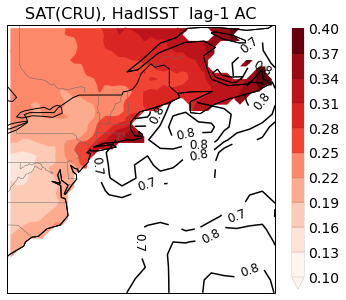

In [73]:
# Plot SAT and SST together (new figure below that's included in the paper)
reload(ensutils)
fig = plt.figure( figsize=(6, 6) )
nr = 1; nc = 1; ft = 16
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors); extend = 'min'

lagcc_sst_spatial_full_masked = copy.deepcopy(lagcc_sst_spatial_full)
lagcc_sst_spatial_full_masked.data = np.ma.masked_less(lagcc_sst_spatial_full_masked.data, 0.69)

# SAT ======================================
clev1 = np.linspace( 0.1, 0.4, ncolors )
ax = plt.subplot(nr,nc,1, projection=ccrs.PlateCarree())
tle = 'SAT(CRU), HadISST  lag-%d AC' % lag
ensutils.plot_spatial_contourf( lagcc_tas_cru_spatial_land, ax, clev=clev1, cmap=cmap, extend=extend, pcolor=False, colorbar=True, orient='vertical', title=tle, ftsize=ft,\
                                contour=[lagcc_sst_spatial_full_masked, 4, 12])
utls.plotStates(ax)

## Supplemetary Figure 5<a id="Supp_Fig5"></a>

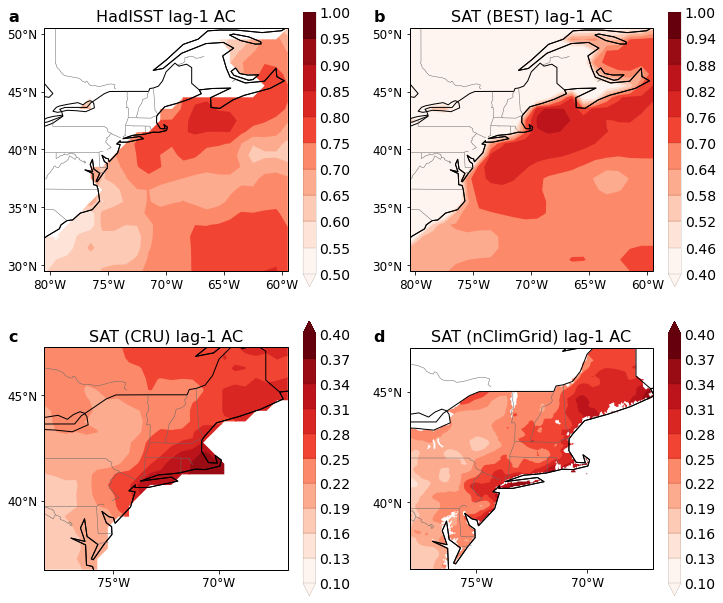

In [74]:
# Plot lag-1 AC
matplotlib.rcParams.update({'font.size':12})
fig = plt.figure( figsize=(12,12) )
nr = 2; nc = 2; ft = 16
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors); extend = 'min'

def showlatlons(ax, lons=[-80, -75,-70,-65,-60], lats=[30,35,40,45,50]):
    ax.set_xticks(lons, crs=ccrs.PlateCarree())
    ax.set_yticks(lats, crs=ccrs.PlateCarree())
    lon_formatter = LONGITUDE_FORMATTER #(degree_symbol='', dateline_direction_label=True)
    lat_formatter = LATITUDE_FORMATTER #(degree_symbol='')
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)

# HadISST ======================================
clev1 = np.linspace( 0.5, 1, ncolors )
ax = plt.subplot(nr,nc,1, projection=ccrs.PlateCarree())
tle = 'HadISST lag-%d AC' % lag
epsc( lagcc_sst_spatial_full, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, orient='vertical', title=tle, ftsize=ft)
utls.plotStates(ax)
plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.15)
showlatlons(ax)

# SAT ======================================
clev1 = np.linspace( 0.4, 1, ncolors )
ax = plt.subplot(nr,nc,2, projection=ccrs.PlateCarree())
tle = 'SAT (BEST) lag-%d AC' % lag
epsc( lagcc_tas_best_spatial_full, ax, clev=clev1, cmap=cmap, extend=extend, pcolor=False, colorbar=True, orient='vertical', title=tle, ftsize=ft)
utls.plotStates(ax)
plt.title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.15)
showlatlons(ax)

clev1 = np.linspace( 0.1, 0.4, ncolors ); extend = 'both'
# SAT ======================================
ax = plt.subplot(nr,nc,3, projection=ccrs.PlateCarree())
tle = 'SAT (CRU) lag-%d AC' % lag
epsc( lagcc_tas_cru_spatial_land.extract(regCtrNEBOX), ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, orient='vertical', pcolor=False, title=tle, ftsize=ft)
utls.plotStates(ax)
plt.title(r'$\bf{c}$', fontsize=ft, loc='left', x=-0.15)
showlatlons(ax, lons=[-75,-70], lats=[40,45])

# SAT ======================================
ax = plt.subplot(nr,nc,4, projection=ccrs.PlateCarree())
tle = 'SAT (nClimGrid) lag-%d AC' % lag
epsc( lagcc_tas_ncg_spatial_land.extract(regCtrNEBOX), ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, orient='vertical', pcolor=False, title=tle, ftsize=ft)
utls.plotStates(ax)
plt.title(r'$\bf{d}$', fontsize=ft, loc='left', x=-0.15)
showlatlons(ax, lons=[-75,-70], lats=[40,45])

#ncolors = 9; col = 'Greens'; cmap = cm.get_cmap(col, ncolors); extend = 'both'; ft=16
#clev1 = np.linspace( 50, 850, ncolors )
#ax = plt.subplot(nr,nc,4, projection=ccrs.PlateCarree()); kk+=1; tle='Elevation'
##iplt.contourf(elevne_regr_neus.extract(regCtrNEBOX))
#epsc( elevne_regr_neus.extract(regCtrNEBOX), ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, orient='vertical', title=tle, ftsize=ft, unit='meters')
#utls.plotStates(ax)

plt.subplots_adjust(hspace=-0.1, wspace=0.2)

saveFig = True
if saveFig:
    figName = 'Supp_Fig5'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'), dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

Lag-1 autocorrelations are computed for monthly SST and SAT anomalies to Lag-1 autocorrelations indicate that the coastal SATs show more persistance at a 1-month lag, clearly indicating the maritime influence on coastal NEUS temperatures. The SAT persistence over the adjacent Atlantic Ocean is naturally stronger, with lag-1 correlations of in NWS region being over 0.8.

[Top of Page](#outline)

### SST EOFs

In [75]:
#sst_yrarr   = np.arange(syr0, eyr0+1, 1)
sst_regCtr  = utls.getLatLonCtr([-180, 180, -80, 80]) #[-180, 180, -55, 65]([)
sst_regCtrReg = utls.getLatLonCtr([-80,-55,20,65])
sst_regCtrNHATL = utls.getLatLonCtr([-85,5,10,65])
sst_regCtrATL = utls.getLatLonCtr([-80,0,-65,65])
sst_regCtrGl= utls.getLatLonCtr([-180, 180, -80, 80])
sst_regCtrS = utls.getLatLonCtr([-82,-55,25,35])
sst_regCtrN = utls.getLatLonCtr([-80,-55,35,50])

sst_regCtrPacific = utls.getLatLonCtr([110,160,20,50])

#### SST EOFs for seasonal mean SSTs (ANN, DJF, JJA)

In [76]:
# EOFs (with global warming signal removed)
reload(utls)
nModes = 6
removeGlobalSST = True
eofs_hsst_minusgl_sea_dict = {}
pcs_hsst_minusgl_sea_dict = {}
for pickedSeason in ['ANN','DJF','JJA']:
    cube4eof_hsst_minusgl = hadisstFull_mon_anom.extract( sst_regCtr )
    cube4eof_hsst_minusgl = ensutils.calc_seasonal_mean_local(cube4eof_hsst_minusgl, pickedSeason, verbose=False)[1]
    
    if removeGlobalSST:
        hsst_gl_sea = ensutils.calc_seasonal_mean_local(hadisstFull_mon_anom.extract(sst_regCtrGl), pickedSeason, verbose=False)[1]
        hglaa = mylib.areaAverage(hsst_gl_sea)
        cube4eof_hsst_minusgl = mylib.subtractCubes(cube4eof_hsst_minusgl, hglaa)

    print(cube4eof_hsst_minusgl.shape)
    print(cube4eof_hsst_minusgl.coord('time')[0])
    print(cube4eof_hsst_minusgl.coord('time')[-1])

    eofs_hsst_minusgl, pcs_hsst_minusgl, solver_hsst_minusgl = utls.calc_eofs(cube4eof_hsst_minusgl, nModes=nModes, detrend=False, remove_gmt=False)
    eigv_fraction_hsst_minusgl = solver_hsst_minusgl.varianceFraction(nModes).data*100.

    mult_hsst_minusgl = [1.0, 1.0, 1.0]
    if pickedSeason=='JJA':
        mult_hsst_minusgl = [-1.0, -1.0, -1.0]

    for nn in np.arange(3):
        eofs_hsst_minusgl.data[nn]  = eofs_hsst_minusgl.data[nn]  * mult_hsst_minusgl[nn]
        pcs_hsst_minusgl.data[:,nn] = pcs_hsst_minusgl.data[:,nn] * mult_hsst_minusgl[nn]
        
    eofs_hsst_minusgl_sea_dict.setdefault( pickedSeason, eofs_hsst_minusgl )
    pcs_hsst_minusgl_sea_dict.setdefault( pickedSeason, pcs_hsst_minusgl )

(148, 162, 360)
DimCoord([1871-06-01 12:00:00], bounds=[[1870-12-01 00:00:00, 1871-12-01 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
DimCoord([2018-06-02 00:00:00], bounds=[[2017-12-01 00:00:00, 2018-12-02 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
(148, 162, 360)
DimCoord([1871-01-15 00:00:00], bounds=[[1870-12-01 00:00:00, 1871-03-01 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
DimCoord([2018-01-16 12:00:00], bounds=[[2017-12-01 00:00:00, 2018-03-04 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
(148, 162, 360)
DimCoord([1871-07-17 00:00:00], bounds=[[1871-06-01 00:00:00, 1871-09-01 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
DimCoord([2018-07-17 00:00:00], bounds=[[2018-06-01 00:00:00, 2018-09-01 00:00:00]], standard_name='time', calendar='gregorian', lon

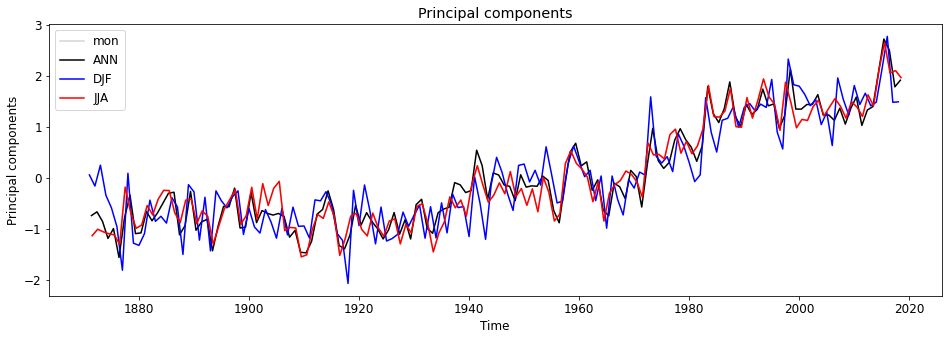

In [77]:
fig = plt.figure(figsize=(16,5))
ax = plt.subplot(111)
iplt.plot(pcs_hsst_minusgl[:,1], color='lightgrey', label='mon')
iplt.plot(pcs_hsst_minusgl_sea_dict['ANN'][:,1], color='k', label='ANN')
iplt.plot(pcs_hsst_minusgl_sea_dict['DJF'][:,1], color='b', label='DJF')
iplt.plot(pcs_hsst_minusgl_sea_dict['JJA'][:,1], color='r', label='JJA')
plt.legend(loc=2, fontsize=12)
#iplt.plot(pcs_hsst_minusgl[:,1])
#iplt.plot(pcs_hsst_minusgl_dict['DJF'][:,1])

##### 1902-2018 ANN (done for revisions to show that it's not different from much longer period)

In [78]:
hsst_gl_sea.coord('season_year').points

array([1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880, 1881,
       1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889, 1890, 1891, 1892,
       1893, 1894, 1895, 1896, 1897, 1898, 1899, 1900, 1901, 1902, 1903,
       1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911, 1912, 1913, 1914,
       1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925,
       1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936,
       1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947,
       1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958,
       1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969,
       1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980,
       1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018])

(117, 162, 360)
DimCoord([1902-06-01 12:00:00], bounds=[[1901-12-01 00:00:00, 1902-12-01 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
DimCoord([2018-06-02 00:00:00], bounds=[[2017-12-01 00:00:00, 2018-12-02 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')


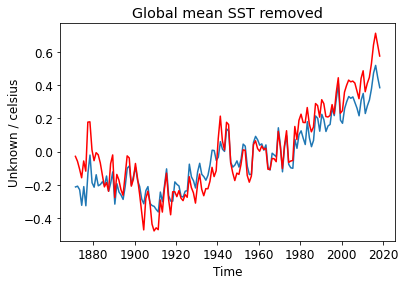

In [79]:
# EOFs (with global warming signal removed)
reload(utls)
nModes = 6
removeGlobalSST = True
pickedSeason = 'ANN'
cube4eof_hsst_minusgl = hadisstFull_mon_anom.extract( sst_regCtr )
cube4eof_esst_minusgl =   ersstFull_mon_anom.extract( sst_regCtr )

if pickedSeason:
    cube4eof_hsst_minusgl = ensutils.calc_seasonal_mean_local(cube4eof_hsst_minusgl, pickedSeason, verbose=False)[1]
    cube4eof_esst_minusgl = ensutils.calc_seasonal_mean_local(cube4eof_esst_minusgl, pickedSeason, verbose=False)[1]
    
    hsst_gl_sea = ensutils.calc_seasonal_mean_local(hadisstFull_mon_anom.extract(sst_regCtrGl),pickedSeason,verbose=False)[1]
    esst_gl_sea = ensutils.calc_seasonal_mean_local(  ersstFull_mon_anom.extract(sst_regCtrGl),pickedSeason,verbose=False)[1]
    
#cube4eof_hsst_minusgl = ensutils.extract_years(cube4eof_hsst_minusgl, 1871, 1995)
#cube4eof_esst_minusgl = ensutils.extract_years(cube4eof_esst_minusgl, 1871, 1995)

#hsst_gl_sea = ensutils.extract_years(hsst_gl_sea, 1902, 2018)
#esst_gl_sea = ensutils.extract_years(esst_gl_sea, 1902, 2018)

if removeGlobalSST:
    if pickedSeason:
        hglaa = mylib.areaAverage(hsst_gl_sea)
        eglaa = mylib.areaAverage(esst_gl_sea)
    else:
        hglaa = mylib.areaAverage(hadisstFull_mon_anom.extract(sst_regCtrGl))
        eglaa = mylib.areaAverage(  ersstFull_mon_anom.extract(sst_regCtrGl))
        
    cube4eof_hsst_minusgl = mylib.subtractCubes(cube4eof_hsst_minusgl, hglaa)
    cube4eof_esst_minusgl = mylib.subtractCubes(cube4eof_esst_minusgl, eglaa)
    
    iplt.plot(hglaa);
    iplt.plot(eglaa,'r-')
    plt.title('Global mean SST removed')

cube4eof_hsst_minusgl = ensutils.extract_years(cube4eof_hsst_minusgl, 1902, 2018)
cube4eof_esst_minusgl = ensutils.extract_years(cube4eof_esst_minusgl, 1902, 2018)

print(cube4eof_hsst_minusgl.shape)
print(cube4eof_hsst_minusgl.coord('time')[0])
print(cube4eof_hsst_minusgl.coord('time')[-1])

eofs_hsst_minusgl, pcs_hsst_minusgl, solver_hsst_minusgl = utls.calc_eofs(cube4eof_hsst_minusgl, nModes=nModes, detrend=False, remove_gmt=False)
eigv_fraction_hsst_minusgl = solver_hsst_minusgl.varianceFraction(nModes).data*100.

eofs_esst_minusgl, pcs_esst_minusgl, solver_esst_minusgl = utls.calc_eofs(cube4eof_esst_minusgl, nModes=nModes, detrend=False, remove_gmt=False)
eigv_fraction_esst_minusgl = solver_esst_minusgl.varianceFraction(nModes).data*100.

mult_hsst_minusgl = [-1.0, -1.0, 1.0]
mult_esst_minusgl = [-1.0, -1.0, 1.0]
if pickedSeason=='JJA':
    mult_hsst_minusgl = [-1.0, -1.0, -1.0]
    mult_esst_minusgl = [-1.0, -1.0, -1.0]
    
for nn in np.arange(3):
    eofs_hsst_minusgl.data[nn]  = eofs_hsst_minusgl.data[nn]  * mult_hsst_minusgl[nn]
    pcs_hsst_minusgl.data[:,nn] = pcs_hsst_minusgl.data[:,nn] * mult_hsst_minusgl[nn]
    
    eofs_esst_minusgl.data[nn]  = eofs_esst_minusgl.data[nn]  * mult_esst_minusgl[nn]
    pcs_esst_minusgl.data[:,nn] = pcs_esst_minusgl.data[:,nn] * mult_esst_minusgl[nn]
    
# Create seasonal means
if not pickedSeason:
    pcs_hsst_minusgl_dict = {}
    for season in ['ANN','DJF','MAM','JJA','SON']:
        pcs_hsst_minusgl_dict.setdefault( season, ensutils.calc_seasonal_mean_local(pcs_hsst_minusgl, season, verbose=False)[1] )

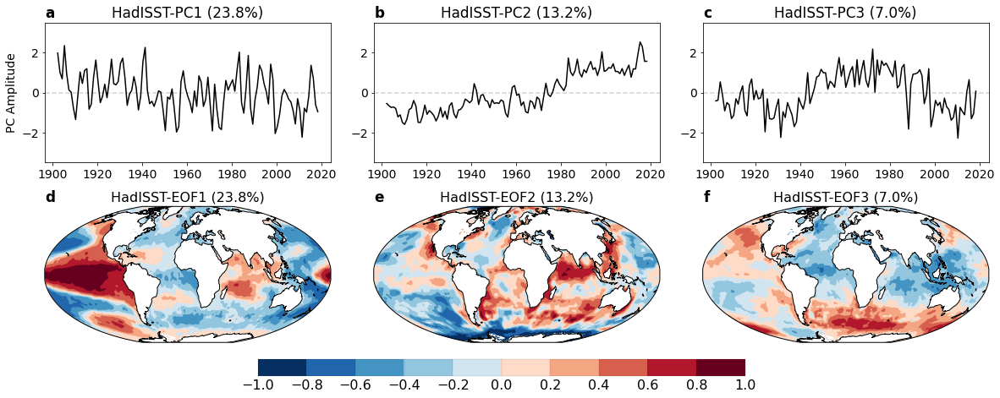

In [80]:
# Plot first three modes (global warming signal removed) for HadISST and ERSST
matplotlib.rcParams.update({'font.size':14})

# HadISST ====================================================
# ============================================================
nr = 2; nc = 3
panelnames = ['a','b','c','d','e','f','g','h','i','j','k','l']

fig = plt.figure( figsize=(20,7) )
ncolors = 11; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend = None; ft=16
clev1 = np.linspace( -1, 1, ncolors )

# SST ======================================
for nn in [0,1,2]:
    ax = plt.subplot(nr,nc,nn+1)
    plt.axhline(y=0, ls='--', color='lightgrey')
    ts = pcs_hsst_minusgl[:,nn]
    #plt.plot(ts.coord('season_year').points, ts.data, 'k-')
    iplt.plot(ts, 'k-')
    plt.title('HadISST-PC%s (%.1f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl[nn] ))
    plt.title(r'$\bf{%s}$' % panelnames[nn], loc='left')
    ax.set_ylabel('PC Amplitude') if nn==0 else ax.set_ylabel('')
    ax.set_ylim(-3.5, 3.5)
    plt.xlabel('')
    del ts
    
    #regmap, cormap = utls.regress_map_ts( cube4eof_sst_minusgl, pcs_sst_minusgl[:,nn].data, mask=True )
    ut = '${^o}$C/sd' #$^{-1}$'
    ax = plt.subplot(nr,nc,nn+4, projection=ccrs.Mollweide()) #PlateCarree())
    tle = 'HadISST-EOF%s (%.1f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl[nn] )
    cf = epsc( eofs_hsst_minusgl[nn], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
    plt.xlabel('')
    plt.title(r'$\bf{%s}$' % panelnames[nn+3], loc='left')
    #utls.plotStates(ax)
    #del regmap, cormap
    
plt.subplots_adjust(wspace=0.15, hspace=0.3)
##unit='$^o$C' # (%d-%d trends)' % (1961, 2015)            ################################################################################### <------------------------------ CHANGE THIS
unit = ''
cbar_ax = fig.add_axes([0.3, 0.05, 0.4, 0.04]); orient='horizontal'; rot=-360 if orient=='horizontal' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

# Don't show ERSST
if False:
    # ERSST ====================================================
    # ============================================================
    #nr = 2; nc = 3

    #fig = plt.figure( figsize=(20,7) )
    ncolors = 11; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend = None; ft=16
    clev1 = np.linspace( -1, 1, ncolors )

    # SST ======================================
    for nn in [0,1,2]:
        ax = plt.subplot(nr,nc,6+nn+1)
        plt.axhline(y=0, ls='--', color='lightgrey')
        ts = pcs_esst_minusgl[:,nn]
        #plt.plot(ts.coord('season_year').points, ts.data, 'k-')
        iplt.plot(ts, 'k-')
        plt.title('ERSST-PC%s (%.1f%%)' % ( str(nn+1), eigv_fraction_esst_minusgl[nn] ))
        plt.title(r'$\bf{%s}$' % panelnames[6+nn], loc='left')
        ax.set_ylabel('PC Amplitude') if nn==0 else ax.set_ylabel('')
        ax.set_ylim(-3.5, 3.5)
        plt.xlabel('')
        del ts

        #regmap, cormap = utls.regress_map_ts( cube4eof_sst_minusgl, pcs_sst_minusgl[:,nn].data, mask=True )
        ut = '${^o}$C/sd' #$^{-1}$'
        ax = plt.subplot(nr,nc,6+nn+4, projection=ccrs.Mollweide()) #PlateCarree())
        tle = 'ERSST-EOF%s (%.1f%%)' % ( str(nn+1), eigv_fraction_esst_minusgl[nn] )
        cf = epsc( eofs_esst_minusgl[nn], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
        plt.xlabel('')
        plt.title(r'$\bf{%s}$' % panelnames[6+nn+3], loc='left')
        #utls.plotStates(ax)
        #del regmap, cormap

    plt.subplots_adjust(wspace=0.15, hspace=0.2)
    #unit='$^o$C' # (%d-%d trends)' % (1961, 2015)            ################################################################################### <------------------------------ CHANGE THIS
    unit = ''
    cbar_ax = fig.add_axes([0.3, 0.09, 0.4, 0.02]); orient='horizontal'; rot=-360 if orient=='horizontal' else 0   #[0.48, 0.18, 0.4, 0.02]
    cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
    cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

(117, 162, 360)
DimCoord([1902-06-01 12:00:00], bounds=[[1901-12-01 00:00:00, 1902-12-01 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
DimCoord([2018-06-02 00:00:00], bounds=[[2017-12-01 00:00:00, 2018-12-02 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')


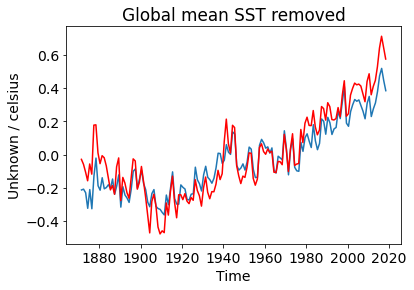

In [81]:
# EOFs (with global warming signal removed)
reload(utls)
nModes = 6
removeGlobalSST = True
pickedSeason = 'ANN'
cube4eof_hsst_minusgl = hadisstFull_mon_anom.extract( sst_regCtr )
cube4eof_esst_minusgl =   ersstFull_mon_anom.extract( sst_regCtr )

if pickedSeason:
    cube4eof_hsst_minusgl = ensutils.calc_seasonal_mean_local(cube4eof_hsst_minusgl, pickedSeason, verbose=False)[1]
    cube4eof_esst_minusgl = ensutils.calc_seasonal_mean_local(cube4eof_esst_minusgl, pickedSeason, verbose=False)[1]
    
    hsst_gl_sea = ensutils.calc_seasonal_mean_local(hadisstFull_mon_anom.extract(sst_regCtrGl),pickedSeason,verbose=False)[1]
    esst_gl_sea = ensutils.calc_seasonal_mean_local(  ersstFull_mon_anom.extract(sst_regCtrGl),pickedSeason,verbose=False)[1]
    
#cube4eof_hsst_minusgl = ensutils.extract_years(cube4eof_hsst_minusgl, 1871, 1995)
#cube4eof_esst_minusgl = ensutils.extract_years(cube4eof_esst_minusgl, 1871, 1995)

#hsst_gl_sea = ensutils.extract_years(hsst_gl_sea, 1902, 2018)
#esst_gl_sea = ensutils.extract_years(esst_gl_sea, 1902, 2018)

if removeGlobalSST:
    if pickedSeason:
        hglaa = mylib.areaAverage(hsst_gl_sea)
        eglaa = mylib.areaAverage(esst_gl_sea)
    else:
        hglaa = mylib.areaAverage(hadisstFull_mon_anom.extract(sst_regCtrGl))
        eglaa = mylib.areaAverage(  ersstFull_mon_anom.extract(sst_regCtrGl))
        
    cube4eof_hsst_minusgl = mylib.subtractCubes(cube4eof_hsst_minusgl, hglaa)
    cube4eof_esst_minusgl = mylib.subtractCubes(cube4eof_esst_minusgl, eglaa)
    
    iplt.plot(hglaa);
    iplt.plot(eglaa,'r-')
    plt.title('Global mean SST removed')

cube4eof_hsst_minusgl = ensutils.extract_years(cube4eof_hsst_minusgl, 1902, 2018)
cube4eof_esst_minusgl = ensutils.extract_years(cube4eof_esst_minusgl, 1902, 2018)

print(cube4eof_hsst_minusgl.shape)
print(cube4eof_hsst_minusgl.coord('time')[0])
print(cube4eof_hsst_minusgl.coord('time')[-1])

cube4eof_hsst_minusgl_atl = cube4eof_hsst_minusgl.extract(sst_regCtrATL)
cube4eof_esst_minusgl_atl = cube4eof_esst_minusgl.extract(sst_regCtrATL)

eofs_hsst_minusgl_atl, pcs_hsst_minusgl_atl, solver_hsst_minusgl_atl = utls.calc_eofs(cube4eof_hsst_minusgl_atl, nModes=nModes, detrend=False, remove_gmt=False)
eigv_fraction_hsst_minusgl_atl = solver_hsst_minusgl_atl.varianceFraction(nModes).data*100.

eofs_esst_minusgl_atl, pcs_esst_minusgl_atl, solver_esst_minusgl_atl = utls.calc_eofs(cube4eof_esst_minusgl_atl, nModes=nModes, detrend=False, remove_gmt=False)
eigv_fraction_esst_minusgl_atl = solver_esst_minusgl_atl.varianceFraction(nModes).data*100.

mult_hsst_minusgl_atl = [1.0, 1.0, 1.0]
mult_esst_minusgl_atl = [-1.0, -1.0, 1.0]
if pickedSeason=='JJA':
    mult_hsst_minusgl_atl = [-1.0, -1.0, -1.0]
    mult_esst_minusgl_atl = [-1.0, -1.0, -1.0]
    
for nn in np.arange(3):
    eofs_hsst_minusgl_atl.data[nn]  = eofs_hsst_minusgl_atl.data[nn]  * mult_hsst_minusgl_atl[nn]
    pcs_hsst_minusgl_atl.data[:,nn] = pcs_hsst_minusgl_atl.data[:,nn] * mult_hsst_minusgl_atl[nn]
    
    eofs_esst_minusgl_atl.data[nn]  = eofs_esst_minusgl_atl.data[nn]  * mult_esst_minusgl_atl[nn]
    pcs_esst_minusgl_atl.data[:,nn] = pcs_esst_minusgl_atl.data[:,nn] * mult_esst_minusgl_atl[nn]
    
# Create seasonal means
if not pickedSeason:
    pcs_hsst_minusgl_dict_atl = {}
    for season in ['ANN','DJF','MAM','JJA','SON']:
        pcs_hsst_minusgl_dict_atl.setdefault( season, ensutils.calc_seasonal_mean_local(pcs_hsst_minusgl_atl, season, verbose=False)[1] )

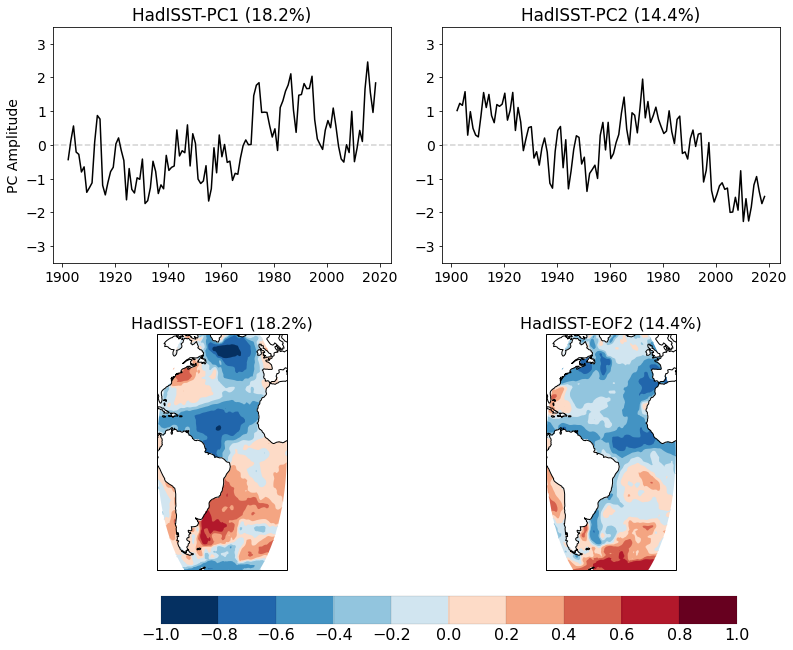

In [82]:
# Plot first three modes (global warming signal removed) for HadISST and ERSST
matplotlib.rcParams.update({'font.size':14})

# HadISST ====================================================
# ============================================================
nr = 2; nc = 3
panelnames = ['a','b','c','d','e','f','g','h','i','j','k','l']

fig = plt.figure( figsize=(20,10) )
ncolors = 11; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend = None; ft=16
clev1 = np.linspace( -1, 1, ncolors )

# SST ======================================
for nn in [0,1]:
    ax = plt.subplot(nr,nc,nn+1)
    plt.axhline(y=0, ls='--', color='lightgrey')
    ts = pcs_hsst_minusgl_atl[:,nn]
    #plt.plot(ts.coord('season_year').points, ts.data, 'k-')
    iplt.plot(ts, 'k-')
    plt.title('HadISST-PC%s (%.1f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl_atl[nn] ))
    #plt.title(r'$\bf{%s}$' % panelnames[nn], loc='left')
    ax.set_ylabel('PC Amplitude') if nn==0 else ax.set_ylabel('')
    ax.set_ylim(-3.5, 3.5)
    plt.xlabel('')
    del ts
    
    #regmap, cormap = utls.regress_map_ts( cube4eof_sst_minusgl, pcs_sst_minusgl[:,nn].data, mask=True )
    ut = '${^o}$C/sd' #$^{-1}$'
    ax = plt.subplot(nr,nc,nn+4, projection=ccrs.Mollweide(central_longitude=-40.)) #PlateCarree())
    tle = 'HadISST-EOF%s (%.1f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl_atl[nn] )
    cf = epsc( eofs_hsst_minusgl_atl[nn], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
    plt.xlabel('')
    #plt.title(r'$\bf{%s}$' % panelnames[nn+3], loc='left')
    #utls.plotStates(ax)
    #del regmap, cormap
    
plt.subplots_adjust(wspace=0.15, hspace=0.3)
##unit='$^o$C' # (%d-%d trends)' % (1961, 2015)            ################################################################################### <------------------------------ CHANGE THIS
unit = ''
cbar_ax = fig.add_axes([0.2, 0.05, 0.4, 0.04]); orient='horizontal'; rot=-360 if orient=='horizontal' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

## Supplemenatry Figure 3<a id="Supp_Fig3"></a>

##### 1871-2018 ANN

(148, 162, 360)
DimCoord([1871-06-01 12:00:00], bounds=[[1870-12-01 00:00:00, 1871-12-01 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
DimCoord([2018-06-02 00:00:00], bounds=[[2017-12-01 00:00:00, 2018-12-02 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')


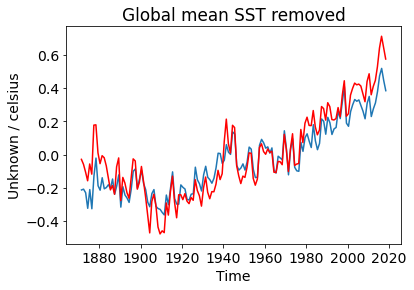

In [83]:
# EOFs (with global warming signal removed)
reload(utls)
nModes = 6
removeGlobalSST = True
pickedSeason = 'ANN'
cube4eof_hsst_minusgl = hadisstFull_mon_anom.extract( sst_regCtr )
cube4eof_esst_minusgl =   ersstFull_mon_anom.extract( sst_regCtr )

if pickedSeason:
    cube4eof_hsst_minusgl = ensutils.calc_seasonal_mean_local(cube4eof_hsst_minusgl, pickedSeason, verbose=False)[1]
    cube4eof_esst_minusgl = ensutils.calc_seasonal_mean_local(cube4eof_esst_minusgl, pickedSeason, verbose=False)[1]
    
    hsst_gl_sea = ensutils.calc_seasonal_mean_local(hadisstFull_mon_anom.extract(sst_regCtrGl),pickedSeason,verbose=False)[1]
    esst_gl_sea = ensutils.calc_seasonal_mean_local(  ersstFull_mon_anom.extract(sst_regCtrGl),pickedSeason,verbose=False)[1]
    
#cube4eof_hsst_minusgl = ensutils.extract_years(cube4eof_hsst_minusgl, 1871, 1995)
#cube4eof_esst_minusgl = ensutils.extract_years(cube4eof_esst_minusgl, 1871, 1995)

#hsst_gl_sea = ensutils.extract_years(hsst_gl_sea, 1871, 1995)
#esst_gl_sea = ensutils.extract_years(esst_gl_sea, 1871, 1995)

if removeGlobalSST:
    if pickedSeason:
        hglaa = mylib.areaAverage(hsst_gl_sea)
        eglaa = mylib.areaAverage(esst_gl_sea)
    else:
        hglaa = mylib.areaAverage(hadisstFull_mon_anom.extract(sst_regCtrGl))
        eglaa = mylib.areaAverage(  ersstFull_mon_anom.extract(sst_regCtrGl))
        
    cube4eof_hsst_minusgl = mylib.subtractCubes(cube4eof_hsst_minusgl, hglaa)
    cube4eof_esst_minusgl = mylib.subtractCubes(cube4eof_esst_minusgl, eglaa)
    
    iplt.plot(hglaa);
    iplt.plot(eglaa,'r-')
    plt.title('Global mean SST removed')

print(cube4eof_hsst_minusgl.shape)
print(cube4eof_hsst_minusgl.coord('time')[0])
print(cube4eof_hsst_minusgl.coord('time')[-1])

eofs_hsst_minusgl, pcs_hsst_minusgl, solver_hsst_minusgl = utls.calc_eofs(cube4eof_hsst_minusgl, nModes=nModes, detrend=False, remove_gmt=False)
eigv_fraction_hsst_minusgl = solver_hsst_minusgl.varianceFraction(nModes).data*100.

eofs_esst_minusgl, pcs_esst_minusgl, solver_esst_minusgl = utls.calc_eofs(cube4eof_esst_minusgl, nModes=nModes, detrend=False, remove_gmt=False)
eigv_fraction_esst_minusgl = solver_esst_minusgl.varianceFraction(nModes).data*100.

mult_hsst_minusgl = [1.0, 1.0, 1.0]
mult_esst_minusgl = [1.0, 1.0, 1.0]
if pickedSeason=='JJA':
    mult_hsst_minusgl = [-1.0, -1.0, -1.0]
    mult_esst_minusgl = [-1.0, -1.0, -1.0]
    
for nn in np.arange(3):
    eofs_hsst_minusgl.data[nn]  = eofs_hsst_minusgl.data[nn]  * mult_hsst_minusgl[nn]
    pcs_hsst_minusgl.data[:,nn] = pcs_hsst_minusgl.data[:,nn] * mult_hsst_minusgl[nn]
    
    eofs_esst_minusgl.data[nn]  = eofs_esst_minusgl.data[nn]  * mult_esst_minusgl[nn]
    pcs_esst_minusgl.data[:,nn] = pcs_esst_minusgl.data[:,nn] * mult_esst_minusgl[nn]
    
# Create seasonal means
if not pickedSeason:
    pcs_hsst_minusgl_dict = {}
    for season in ['ANN','DJF','MAM','JJA','SON']:
        pcs_hsst_minusgl_dict.setdefault( season, ensutils.calc_seasonal_mean_local(pcs_hsst_minusgl, season, verbose=False)[1] )

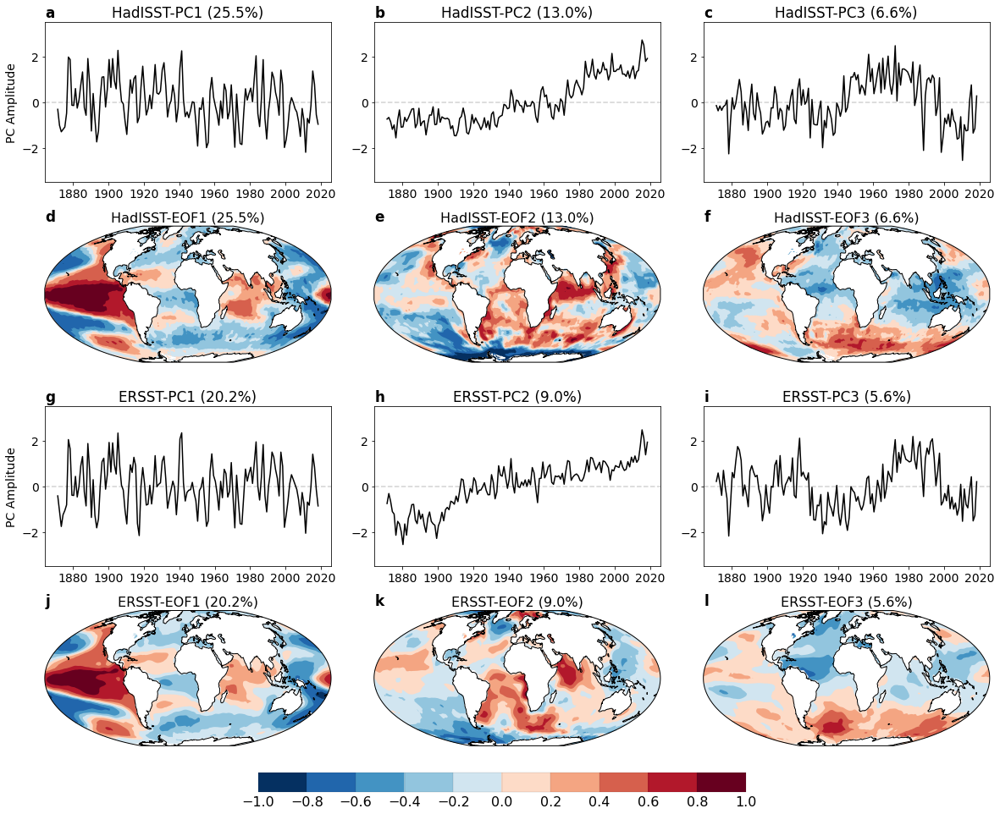

In [84]:
# Plot first three modes (global warming signal removed) for HadISST and ERSST
matplotlib.rcParams.update({'font.size':14})

# HadISST ====================================================
# ============================================================
nr = 4; nc = 3
panelnames = ['a','b','c','d','e','f','g','h','i','j','k','l']

fig = plt.figure( figsize=(20,16) )
ncolors = 11; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend = None; ft=16
clev1 = np.linspace( -1, 1, ncolors )

# SST ======================================
for nn in [0,1,2]:
    ax = plt.subplot(nr,nc,nn+1)
    plt.axhline(y=0, ls='--', color='lightgrey')
    ts = pcs_hsst_minusgl[:,nn]
    #plt.plot(ts.coord('season_year').points, ts.data, 'k-')
    iplt.plot(ts, 'k-')
    plt.title('HadISST-PC%s (%.1f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl[nn] ))
    plt.title(r'$\bf{%s}$' % panelnames[nn], loc='left')
    ax.set_ylabel('PC Amplitude') if nn==0 else ax.set_ylabel('')
    ax.set_ylim(-3.5, 3.5)
    plt.xlabel('')
    del ts
    
    #regmap, cormap = utls.regress_map_ts( cube4eof_sst_minusgl, pcs_sst_minusgl[:,nn].data, mask=True )
    ut = '${^o}$C/sd' #$^{-1}$'
    ax = plt.subplot(nr,nc,nn+4, projection=ccrs.Mollweide()) #PlateCarree())
    tle = 'HadISST-EOF%s (%.1f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl[nn] )
    cf = epsc( eofs_hsst_minusgl[nn], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
    plt.xlabel('')
    plt.title(r'$\bf{%s}$' % panelnames[nn+3], loc='left')
    #utls.plotStates(ax)
    #del regmap, cormap
    
plt.subplots_adjust(wspace=0.15, hspace=0.2)
##unit='$^o$C' # (%d-%d trends)' % (1961, 2015)            ################################################################################### <------------------------------ CHANGE THIS
#unit = ''
#cbar_ax = fig.add_axes([0.3, 0.05, 0.4, 0.04]); orient='horizontal'; rot=-360 if orient=='horizontal' else 0   #[0.48, 0.18, 0.4, 0.02]
#cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
#cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)


# ERSST ====================================================
# ============================================================
#nr = 2; nc = 3

#fig = plt.figure( figsize=(20,7) )
ncolors = 11; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend = None; ft=16
clev1 = np.linspace( -1, 1, ncolors )

# SST ======================================
for nn in [0,1,2]:
    ax = plt.subplot(nr,nc,6+nn+1)
    plt.axhline(y=0, ls='--', color='lightgrey')
    ts = pcs_esst_minusgl[:,nn]
    #plt.plot(ts.coord('season_year').points, ts.data, 'k-')
    iplt.plot(ts, 'k-')
    plt.title('ERSST-PC%s (%.1f%%)' % ( str(nn+1), eigv_fraction_esst_minusgl[nn] ))
    plt.title(r'$\bf{%s}$' % panelnames[6+nn], loc='left')
    ax.set_ylabel('PC Amplitude') if nn==0 else ax.set_ylabel('')
    ax.set_ylim(-3.5, 3.5)
    plt.xlabel('')
    del ts
    
    #regmap, cormap = utls.regress_map_ts( cube4eof_sst_minusgl, pcs_sst_minusgl[:,nn].data, mask=True )
    ut = '${^o}$C/sd' #$^{-1}$'
    ax = plt.subplot(nr,nc,6+nn+4, projection=ccrs.Mollweide()) #PlateCarree())
    tle = 'ERSST-EOF%s (%.1f%%)' % ( str(nn+1), eigv_fraction_esst_minusgl[nn] )
    cf = epsc( eofs_esst_minusgl[nn], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
    plt.xlabel('')
    plt.title(r'$\bf{%s}$' % panelnames[6+nn+3], loc='left')
    #utls.plotStates(ax)
    #del regmap, cormap
    
plt.subplots_adjust(wspace=0.15, hspace=0.2)
#unit='$^o$C' # (%d-%d trends)' % (1961, 2015)            ################################################################################### <------------------------------ CHANGE THIS
unit = ''
cbar_ax = fig.add_axes([0.3, 0.09, 0.4, 0.02]); orient='horizontal'; rot=-360 if orient=='horizontal' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

saveFig = True
if saveFig:
    figName = 'Supp_Fig3'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'), dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

The first three modes of annual mean SST variability in HadISST and ERSST datasets are very similar in term of their spatial structure (EOFs) and the temporal evolution (PCs) except for mode number two. The second mode shows the same spatial pattern and trend but is uncorelated when the PCs are detrended. This indicates that this mode describes purely long-term changes.

[Top of Page](#outline)

##### Correlations between HadISST and ERSST EOFs

In [85]:
print('n\t PC\t PC-d\t EOF' )
for nn in [0,1,2]:
    ts_ann_h = pcs_hsst_minusgl[:,nn]
    ts_ann_e = pcs_esst_minusgl[:,nn]
    rr_ts = np.corrcoef( ts_ann_h.data, ts_ann_e.data)[0,1]
    rr_ts_dtr = np.corrcoef( utls.detrend_cube(ts_ann_h).data, utls.detrend_cube(ts_ann_e).data )[0,1]
    
    hh = eofs_hsst_minusgl[nn]
    ee = eofs_esst_minusgl[nn]
    hh = hh.regrid(ee, iris.analysis.Nearest())
    rr_sp = iris.analysis.stats.pearsonr(hh, ee).data #, corr_coords=None)
    print('%d\t %.2f\t %.2f\t %.2f' % (nn+1, rr_ts, rr_ts_dtr, rr_sp))
    del ts_ann_h, ts_ann_e, hh, ee, rr_ts, rr_sp

n	 PC	 PC-d	 EOF
1	 0.96	 0.97	 0.94
2	 0.78	 0.10	 0.62
3	 0.67	 0.67	 0.71


##### SST EOFs and their relationship with AMOC-related indices

In [86]:
sstCube = ensutils.calc_seasonal_mean_local(hadisst_mon_anom, 'ANN', verbose=False)[1]
#sstCube = mylib.subtractCubes(sstCube, mylib.areaAverage(sstCube))
sst_trends_ann_gl = calc_single_cube_trends_local_linalg(sstCube)
#sst_trends_mon = calc_single_cube_trends_local_linalg(sstCube.extract( utls.getLatLonCtr([-82,-55,25,50]) ))
sst_trends_ann = sst_trends_ann_gl.extract( utls.getLatLonCtr([-82,-55,25,50]) )

117
0.1400771141052246


In [87]:
sstCube = ensutils.calc_seasonal_mean_local(hadisst_mon_anom, 'ANN', verbose=False)[1]
sst_trends_mk, sst_pvals_mk, sst_hvals_mk = calc_single_cube_trends_local_mk( sstCube.extract( utls.getLatLonCtr([-82,-55,25,50]) ) )

117
3.915649175643921


In [88]:
#
pickedSeason = 'ANN'

# Looking at global EOF2 with global warming removed
nn = 1
print('Season = %s' % pickedSeason)
print('SST Mode = %d' % (nn+1))

#tspc = ensutils.calc_seasonal_mean_local(pcs_hsst_minusgl[:,nn], pickedSeason, verbose=False)[1] #1871-2018
tspc = pcs_hsst_minusgl[:,nn]

# HadISST and ERSST comparison
#tspcTmp = ensutils.calc_seasonal_mean_local(pcs_esst_minusgl[:,nn], pickedSeason, verbose=False)[1]
tspcTmp = pcs_esst_minusgl[:,nn]
print('\nComparison between HadISST and ERSST EOFs')
corResults = scipy.stats.linregress(tspc.data, tspcTmp.data)
print('r(HadISST-PC%d, ERSST-PC%d) = %.2f (p-val = %.5f)' % ((nn+1), (nn+1), corResults.rvalue, corResults.pvalue)); del corResults, tspcTmp

# Caesar et al. 2018
print('\nCorrelations with Caesar et al. 2018 indices based on SSTs')
dumts   = ensutils.extract_years(tspc,        1871, 2016)
amoc_gs = ensutils.extract_years(amocInfo.gs, 1871, 2016)
amoc_sg = ensutils.extract_years(amocInfo.sg, 1871, 2016) * -1.0
corResults = scipy.stats.linregress(dumts.data, amoc_gs.data)
print('r(SST-PC%d, Gulf Stream Index) = %.2f (p-val = %.5f)' % ((nn+1), corResults.rvalue, corResults.pvalue)); del corResults
corResults = scipy.stats.linregress(dumts.data, amoc_sg.data)
print('r(SST-PC%d, Subpolar Gy Index) = %.2f (p-val = %.5f)' % ((nn+1), corResults.rvalue, corResults.pvalue)); del corResults

# Rahmstorf et al. 2015
print('\nCorrelations with Rahmstorf et al. 2015 index based on paleo')
dumts   = ensutils.extract_years(tspc, 1871, 1995)
amoc_r  = amocInfo.rahmstorf15[971:] * -1.0
corResults = scipy.stats.linregress(dumts.data, amoc_r.data)
print('r(SST-PC%d, Gulf Stream Index) = %.2f (p-val = %.5f)' % ((nn+1), corResults.rvalue, corResults.pvalue)); del corResults

# AMV 
print('\nCorrelation with observed AMV')
amv = ensutils.calc_seasonal_mean_local(natmodes['AMO'], pickedSeason, verbose=False)[1]
amv = ensutils.extract_years(amv, 1871, 2018)
corResults = scipy.stats.linregress(tspc.data, amv.data)
print('r(SST-PC%d, AMV Index) = %.2f (p-val = %.5f)' % ((nn+1), corResults.rvalue, corResults.pvalue)); del corResults

nn = 2
#tspc = ensutils.calc_seasonal_mean_local(pcs_hsst_minusgl[:,nn], pickedSeason, verbose=False)[1] #1871-2018
tspc = pcs_hsst_minusgl[:,nn]
corResults = scipy.stats.linregress(tspc.data, amv.data)
print('r(SST-PC%d, AMV Index) = %.2f (p-val = %.5f)' % ((nn+1), corResults.rvalue, corResults.pvalue)); del corResults

del nn

# Spatial pattern correlation betwen SST-PC2 and SST trend pattern
print('\nSpatial pattern correlation betwen SST-PC2 and SST trend pattern')
rr_sp = iris.analysis.stats.pearsonr(sst_trends_ann_gl.extract(sst_regCtr), eofs_hsst_minusgl[1])
print('r(SST-PC2, SST-Trend) = %.2f' % rr_sp.data)

Season = ANN
SST Mode = 2

Comparison between HadISST and ERSST EOFs
r(HadISST-PC2, ERSST-PC2) = 0.78 (p-val = 0.00000)

Correlations with Caesar et al. 2018 indices based on SSTs
r(SST-PC2, Gulf Stream Index) = 0.41 (p-val = 0.00000)
r(SST-PC2, Subpolar Gy Index) = 0.72 (p-val = 0.00000)

Correlations with Rahmstorf et al. 2015 index based on paleo
r(SST-PC2, Gulf Stream Index) = 0.81 (p-val = 0.00000)

Correlation with observed AMV
r(SST-PC2, AMV Index) = 0.21 (p-val = 0.01120)
r(SST-PC3, AMV Index) = -0.54 (p-val = 0.00000)

Spatial pattern correlation betwen SST-PC2 and SST trend pattern
r(SST-PC2, SST-Trend) = 0.87


0.410557869433669


Text(0.0, 1.0, '$\\bf{b}$')

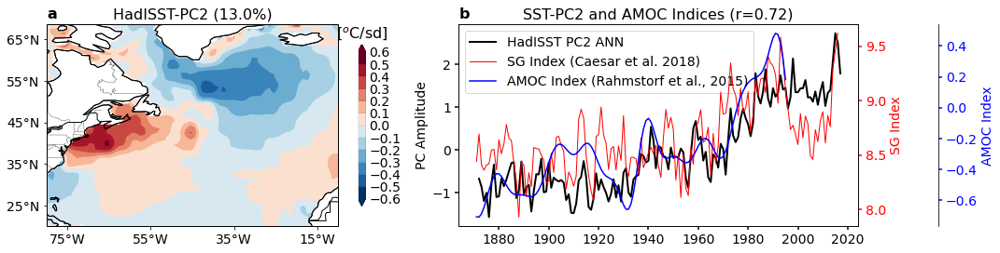

In [89]:
# Plot (global warming signal removed)
matplotlib.rcParams.update({'font.size':14})

reload(utls)
pickedSeason = 'ANN'
regCtrATL = utls.getLatLonCtr( [-80, -10, 20, 65] )
regCtrATLCalc = utls.getLatLonCtr( [-120, 20, 10, 75] )
# ============================================================
# ============================================================
nn = 1
sm = 120
nr = 1; nc = 2

fig = plt.figure( figsize=(20,4) )
grid = plt.GridSpec(2, 3, hspace=0.3, wspace=0.4)

ncolors = 13; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend = 'both'; ft=16
clev1 = np.linspace( -0.6, 0.6, ncolors )

# SST ======================================
tsCube = pcs_hsst_minusgl[:,nn]
regmap, cormap = utls.regress_map_ts( cube4eof_hsst_minusgl.extract(regCtrATLCalc), tsCube.data, mask=True )
ut = '${^o}$C/sd' #$^{-1}$'
ax = plt.subplot(nr,nc,1, projection=ccrs.PlateCarree()) #ccrs.Mollweide(central_longitude=-45.)) #
#ax1 = plt.subplot(grid[0, 0], projection=ccrs.PlateCarree())
tle = 'HadISST-PC%s (%.1f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl[nn] )
epsc( regmap, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, orient='vertical', title=tle, ftsize=ft, unit=ut)
utls.plotStates(ax)
ax.set_extent( [-80, -10, 20, 65] )
showlatlons(ax, lons=[-75,-55,-35,-15], lats=[25,35,45,55,65])
plt.title(r'$\bf{a}$', fontsize=ft, loc='left')
del regmap, cormap

# =====================================================================
ts_ann_h = ensutils.calc_seasonal_mean_local(pcs_hsst_minusgl[:,nn], pickedSeason, verbose=False)[1]
#ts_ann_e = pcs_esst_minusgl[:,nn]
amoc_gs  = ensutils.extract_years(amocInfo.gs, 1871, 2016)
amoc_sg  = ensutils.extract_years(amocInfo.sg, 1871, 2016) * -1.0

#ax = plt.subplot(nr,nc,2)
##ax2 = plt.subplot(grid[0, 1:2])
#plt.axhline(y=0, ls='--', color='lightgrey')
#plt.plot(ts_ann_h.coord('season_year').points, ts_ann_h.data, 'k-', lw=2, label='HadISST PC%d ANN' % (nn+1))
#plt.plot(ts_ann_e.coord('season_year').points, ts_ann_e.data, 'k--', lw=1, label='ERSST PC%d ANN' % (nn+1))
#ax.set_ylim(-3.5, 3.5)
#plt.title('', fontsize=ft)
#plt.xlabel('Time', fontsize=ft)
#plt.ylabel('Normalized PC1', fontsize=ft)
#plt.legend(loc=2, fontsize=ft-2)

def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

host = plt.subplot(nr,nc,2)

#fig, host = plt.subplots( figsize=(16,4) )
plt.subplots_adjust(right=0.75, wspace=0.1)

par1 = host.twinx()
par2 = host.twinx()
par2.spines["right"].set_position(("axes", 1.2))
make_patch_spines_invisible(par2)
par2.spines["right"].set_visible(True)

p1, = host.plot(ts_ann_h.coord('season_year').points, ts_ann_h.data, 'k-', lw=2, label='HadISST PC%d ANN' % (nn+1))
#host.plot(ts_ann_e.coord('season_year').points, ts_ann_e.data, 'k--', lw=1, label='ERSST PC%d ANN' % (nn+1))
#host.plot(ts_ann.coord('season_year').points, ts_ann.data, '-', lw=1, color='lightgrey', label='PC1 ANN')
#p1, = host.plot(ts_ann_minusgl.coord('season_year').points, ts_ann_minusgl.data, 'k-', lw=2, label='SST-PC%d ANN' % (nn+1)); #plt.plot(pcs_hadisst.data[:,2],'m-')
p2, = par1.plot(amoc_sg.coord('year').points, amoc_sg.data, 'r-', lw=1, label='SG Index (Caesar et al. 2018)')
p3, = par2.plot(amocInfo.rahmstorf15[971:].coord('year').points, amocInfo.rahmstorf15[971:].data*-1.0, "b-", label="AMOC Index (Rahmstorf et al., 2015)")

#host.set_xlim(0, 2)
#host.set_ylim(0, 2)
#par1.set_ylim(0, 4)
#par2.set_ylim(1, 65)

host.set_xlabel("")
host.set_ylabel("PC Amplitude")
par1.set_ylabel("SG Index")
par2.set_ylabel("AMOC Index")

host.yaxis.label.set_color(p1.get_color())
par1.yaxis.label.set_color(p2.get_color())
par2.yaxis.label.set_color(p3.get_color())

tkw = dict(size=4, width=1.5)
host.tick_params(axis='y', colors=p1.get_color(), **tkw)
par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
par2.tick_params(axis='y', colors=p3.get_color(), **tkw)
host.tick_params(axis='x', **tkw)

lines = [p1, p2, p3]

host.legend(lines, [l.get_label() for l in lines])
dum2 = ensutils.extract_years(pcs_hsst_minusgl[:,nn], 1871, 2016)
rr = np.corrcoef( amoc_sg.data, dum2.data)[0,1]
print(np.corrcoef(amoc_gs.data, dum2.data)[0,1])
del dum2

host.set_title('SST-PC2 and AMOC Indices (r=%.2f)' % rr, fontsize=ft) #Gulf Stream
plt.title(r'$\bf{b}$', fontsize=ft, loc='left')

##### Correlation/Regression maps between Global SST PC1 and regional SATs

In [90]:
pickedSeason = 'ANN'

In [91]:
reload(utls)
regCtr = utls.getLatLonCtr( utls.reg2bbox['ENA0'] )

tmpPer = [1902, 2018]
tmpCube1 = ensutils.extract_years( ensutils.calc_seasonal_mean_local( tas_cru_mon_anom.extract(regCtr), pickedSeason, verbose=False)[1], tmpPer[0], tmpPer[1])
tmpCube2 = ensutils.extract_years( ensutils.calc_seasonal_mean_local( bestAnom.extract(regCtr),         pickedSeason, verbose=False)[1], tmpPer[0], tmpPer[1])
tmpCube3 = ensutils.extract_years( data20cr_sea_anom_dict['tas'][pickedSeason].extract(regCtr),  tmpPer[0], 2015)

cor_sstpc_field_dict = {}
reg_sstpc_field_dict = {}

pval_th = 0.05
cor_sstpc_field_masked_dict = {}
reg_sstpc_field_masked_dict = {}

for nn in np.arange(3):
    tmptsCube = ensutils.extract_years(pcs_hsst_minusgl[:,nn], tmpPer[0], tmpPer[1])
    
    regmap, cormap = utls.regress_map_ts( tmpCube1, tmptsCube.data, mask=True )
    cor_sstpc_field_dict.setdefault( 'cru%d' % (nn+1), cormap )
    reg_sstpc_field_dict.setdefault( 'cru%d' % (nn+1), regmap )
    del regmap, cormap
    regmap, cormap = utls.regress_map_ts( tmpCube1, tmptsCube.data, mask=True, maskPval=pval_th )
    cor_sstpc_field_masked_dict.setdefault( 'cru%d' % (nn+1), cormap )
    reg_sstpc_field_masked_dict.setdefault( 'cru%d' % (nn+1), regmap )
    del regmap, cormap
    
    regmap, cormap = utls.regress_map_ts( tmpCube2, tmptsCube.data, mask=True )
    cor_sstpc_field_dict.setdefault( 'best%d' % (nn+1), cormap )
    reg_sstpc_field_dict.setdefault( 'best%d' % (nn+1), regmap )
    del regmap, cormap
    regmap, cormap = utls.regress_map_ts( tmpCube2, tmptsCube.data, mask=True, maskPval=pval_th )
    cor_sstpc_field_masked_dict.setdefault( 'best%d' % (nn+1), cormap )
    reg_sstpc_field_masked_dict.setdefault( 'best%d' % (nn+1), regmap )
    del regmap, cormap
    del tmptsCube
    
    tmptsCube = ensutils.extract_years(pcs_hsst_minusgl[:,nn], tmpPer[0], 2015)
    regmap, cormap = utls.regress_map_ts( tmpCube3, tmptsCube.data, mask=True )
    cor_sstpc_field_dict.setdefault( '20cr%d' % (nn+1), cormap )
    reg_sstpc_field_dict.setdefault( '20cr%d' % (nn+1), regmap )
    del regmap, cormap
    regmap, cormap = utls.regress_map_ts( tmpCube3, tmptsCube.data, mask=True, maskPval=pval_th )
    cor_sstpc_field_masked_dict.setdefault( '20cr%d' % (nn+1), cormap )
    reg_sstpc_field_masked_dict.setdefault( '20cr%d' % (nn+1), regmap )
    del regmap, cormap
    del tmptsCube

## Figure 2<a id="Figure2"></a>

In [92]:
mapExtent1 = [-82,-62,28,48]    # manuscript1 

0.410557869433669


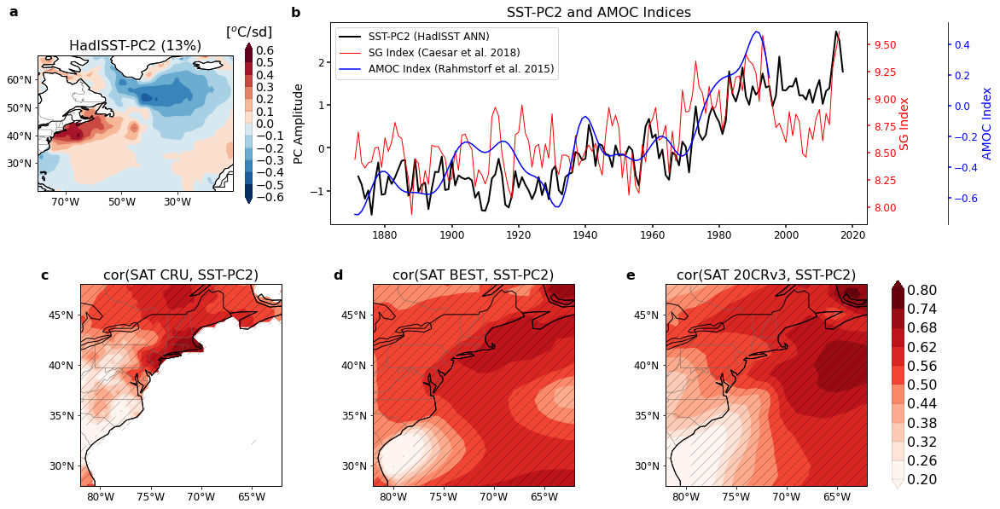

In [97]:
# Combine to sections above to create Fig. 2
# Plot (global warming signal removed)
matplotlib.rcParams.update({'font.size':12})
reload(utls)
pickedSeason = 'ANN'

# TOP ROW +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
regCtrATL = utls.getLatLonCtr( [-80, -10, 20, 65] )
regCtrATLCalc = utls.getLatLonCtr( [-120, 20, 10, 75] )
# ============================================================
# ============================================================
nn = 1
sm = 120
#nr = 1; nc = 2

fig = plt.figure( figsize=(20,10) )
grid = plt.GridSpec(2, 3, hspace=0.3, wspace=0.2)

ncolors = 13; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors); extend = 'both'; ft=16
clev1 = np.linspace( -0.6, 0.6, ncolors )

# SST ======================================
tsCube = pcs_hsst_minusgl[:,nn]
regmap, cormap = utls.regress_map_ts( cube4eof_hsst_minusgl.extract(regCtrATLCalc), tsCube.data, mask=True )
ut = '${^o}$C/sd' #$^{-1}$'
ax = plt.subplot(grid[0,0], projection=ccrs.PlateCarree()) #ccrs.Mollweide(central_longitude=-45.)) #
#ax1 = plt.subplot(grid[0, 0], projection=ccrs.PlateCarree())
tle = 'HadISST-PC%s (%.0f%%)' % ( str(nn+1), eigv_fraction_hsst_minusgl[nn] )
epsc( regmap, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, orient='vertical', title=tle, ftsize=ft, unit=ut)
utls.plotStates(ax)
showlatlons(ax, lons=[-70,-50,-30], lats=[30,40,50,60])
ax.set_extent( [-80, -10, 20, 65] )
plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.15, y=1.25)
del regmap, cormap

# =====================================================================
ts_ann_h = ensutils.calc_seasonal_mean_local(pcs_hsst_minusgl[:,nn], pickedSeason, verbose=False)[1]
#ts_ann_e = pcs_esst_minusgl[:,nn]
amoc_gs  = ensutils.extract_years(amocInfo.gs, 1871, 2016)
amoc_sg  = ensutils.extract_years(amocInfo.sg, 1871, 2016) * -1.0

#ax = plt.subplot(nr,nc,2)
##ax2 = plt.subplot(grid[0, 1:2])
#plt.axhline(y=0, ls='--', color='lightgrey')
#plt.plot(ts_ann_h.coord('season_year').points, ts_ann_h.data, 'k-', lw=2, label='HadISST PC%d ANN' % (nn+1))
#plt.plot(ts_ann_e.coord('season_year').points, ts_ann_e.data, 'k--', lw=1, label='ERSST PC%d ANN' % (nn+1))
#ax.set_ylim(-3.5, 3.5)
#plt.title('', fontsize=ft)
#plt.xlabel('Time', fontsize=ft)
#plt.ylabel('Normalized PC1', fontsize=ft)
#plt.legend(loc=2, fontsize=ft-2)

def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

host = plt.subplot(grid[0,1:3])

#fig, host = plt.subplots( figsize=(16,4) )
#plt.subplots_adjust(right=0.85, wspace=0.08)

par1 = host.twinx()
par2 = host.twinx()
par2.spines["right"].set_position(("axes", 1.15))
make_patch_spines_invisible(par2)
par2.spines["right"].set_visible(True)

p1, = host.plot(ts_ann_h.coord('season_year').points, ts_ann_h.data, 'k-', lw=2, label='SST-PC%d (HadISST ANN)' % (nn+1))
#host.plot(ts_ann_e.coord('season_year').points, ts_ann_e.data, 'k--', lw=1, label='ERSST PC%d ANN' % (nn+1))
#host.plot(ts_ann.coord('season_year').points, ts_ann.data, '-', lw=1, color='lightgrey', label='PC1 ANN')
#p1, = host.plot(ts_ann_minusgl.coord('season_year').points, ts_ann_minusgl.data, 'k-', lw=2, label='SST-PC%d ANN' % (nn+1)); #plt.plot(pcs_hadisst.data[:,2],'m-')
p2, = par1.plot(amoc_sg.coord('year').points, amoc_sg.data, 'r-', lw=1, label='SG Index (Caesar et al. 2018)')
p3, = par2.plot(amocInfo.rahmstorf15[971:].coord('year').points, amocInfo.rahmstorf15[971:].data*-1.0, "b-", label="AMOC Index (Rahmstorf et al. 2015)")

#host.set_xlim(0, 2)
#host.set_ylim(0, 2)
#par1.set_ylim(0, 4)
#par2.set_ylim(1, 65)

host.set_xlabel("")
host.set_ylabel("PC Amplitude", fontsize=ft-2)
par1.set_ylabel("SG Index",     fontsize=ft-2)
par2.set_ylabel("AMOC Index",   fontsize=ft-2)

host.yaxis.label.set_color(p1.get_color())
par1.yaxis.label.set_color(p2.get_color())
par2.yaxis.label.set_color(p3.get_color())

tkw = dict(size=4, width=1.5)
host.tick_params(axis='y', colors=p1.get_color(), **tkw)
par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
par2.tick_params(axis='y', colors=p3.get_color(), **tkw)
host.tick_params(axis='x', **tkw)

lines = [p1, p2, p3]

host.legend(lines, [l.get_label() for l in lines])
dum2 = ensutils.extract_years(pcs_hsst_minusgl[:,nn], 1871, 2016)
rr = np.corrcoef( amoc_sg.data, dum2.data)[0,1]
print(np.corrcoef(amoc_gs.data, dum2.data)[0,1])
del dum2

host.set_title('SST-PC2 and AMOC Indices', fontsize=ft) #Gulf Stream  (r=%.2f)' % rr
host.set_title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.075)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
nn=2
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0.2, 0.8, ncolors )

# ================
plotCube = cor_sstpc_field_dict['cru%d' % nn]
plotCube_masked = cor_sstpc_field_masked_dict['cru%d' % nn]
ax = plt.subplot(grid[1,0], projection=ccrs.PlateCarree())
#tle = 'cor(SAT CRU, SST-PC%s)\n1902-2018, %s' % (str(nn), pickedSeason)
tle = 'cor(SAT CRU, SST-PC%s)' % (str(nn))
cf1 = epsc( plotCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)

cf_dummy = iplt.pcolor(plotCube_masked, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=True) #, pad=-0.65)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[6])   # 7 is colorbar is included in the epsc
del cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent1)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{c}$', fontsize=ft, loc='left', x=-0.2)
del plotCube, plotCube_masked

# ================
plotCube = cor_sstpc_field_dict['best%d' % nn]
plotCube_masked = cor_sstpc_field_masked_dict['best%d' % nn]
ax = plt.subplot(grid[1,1], projection=ccrs.PlateCarree())
#tle = 'cor(SAT BEST, SST-PC%s)\n1902-2018, %s' % (str(nn), pickedSeason)
tle = 'cor(SAT BEST, SST-PC%s)' % (str(nn))
cf1 = epsc( plotCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)

cf_dummy = iplt.pcolor(plotCube_masked, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=True) #, pad=-0.65)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[7])   # 7 is colorbar is included in the epsc
del cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent1)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{d}$', fontsize=ft, loc='left', x=-0.2)
del plotCube, plotCube_masked

# ================
plotCube = cor_sstpc_field_dict['20cr%d' % nn]
plotCube_masked = cor_sstpc_field_masked_dict['20cr%d' % nn]
ax = plt.subplot(grid[1,2], projection=ccrs.PlateCarree())
#tle = 'cor(SAT BEST, SST-PC%s)\n1902-2018, %s' % (str(nn), pickedSeason)
tle = 'cor(SAT 20CRv3, SST-PC%s)' % (str(nn))
cf1 = epsc( plotCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)

cf_dummy = iplt.pcolor(plotCube_masked, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=True) #, pad=-0.65)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[8])   # 7 is colorbar is included in the epsc
del cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent1)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{e}$', fontsize=ft, loc='left', x=-0.2)
del plotCube, plotCube_masked

plt.subplots_adjust(right=0.8)
#offset=-0.023
#axmove.set_position([bbox.x0+offset, bbox.y0, bbox.x1-bbox.x0, bbox.y1-bbox.y0])

cbar_ax = fig.add_axes([0.82, 0.12, 0.01, 0.34]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
#cbar_ax = fig.add_axes([0.85, 0.2, 0.02, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf1, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

saveFig = True
if saveFig:
    figName = 'Fig2'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

## Supplementary Figure 4<a id="Supp_Fig4"></a>

In [99]:
pickedSeason = 'ANN'
tmpPer = [1902, 2018]

cru_glmean = mylib.areaAverage(tas_cru_mon_anom)
ber_glmean = mylib.areaAverage(bestAnom)

cru_glmean = ensutils.extract_years( ensutils.calc_seasonal_mean_local( cru_glmean, pickedSeason, verbose=False)[1], tmpPer[0], tmpPer[1])
ber_glmean = ensutils.extract_years( ensutils.calc_seasonal_mean_local( ber_glmean, pickedSeason, verbose=False)[1], tmpPer[0], tmpPer[1])

In [100]:
tmp_20cr_mon_anom, tmp_20cr_mon_clim = utls.calc_monthly_anomalies(data20cr['tas'], climPeriod=baseline, norm=norm)
cr20_glmean = mylib.areaAverage(tmp_20cr_mon_anom)
cr20_glmean = ensutils.extract_years( ensutils.calc_seasonal_mean_local( cr20_glmean, pickedSeason, verbose=False)[1], tmpPer[0], 2015)


Monthly Anomalies relative to  [1951, 1980]
Anomalies shape:  (1380, 181, 360)
Climatology shape:  (12, 181, 360)


In [101]:
# Create just the bottom row for reviewers
pickedSeason = 'ANN'
detrendts = False

regCtr = utls.getLatLonCtr( utls.reg2bbox['ENA0'] )

tmpPer = [1902, 2018]
tmpCube10 = ensutils.extract_years( ensutils.calc_seasonal_mean_local( tas_cru_mon_anom.extract(regCtr), pickedSeason, verbose=False)[1], tmpPer[0], tmpPer[1])
tmpCube20 = ensutils.extract_years( ensutils.calc_seasonal_mean_local( bestAnom.extract(regCtr),         pickedSeason, verbose=False)[1], tmpPer[0], tmpPer[1])
tmpCube30 = ensutils.extract_years( data20cr_sea_anom_dict['tas'][pickedSeason].extract(regCtr),  tmpPer[0], 2015)

tmpCube1 = mylib.subtractCubes(tmpCube10, cru_glmean)
tmpCube2 = mylib.subtractCubes(tmpCube20, ber_glmean)
tmpCube3 = mylib.subtractCubes(tmpCube30, cr20_glmean)

cor_sstpc_field_dict_glrem = {}
reg_sstpc_field_dict_glrem = {}

pval_th = 0.05
cor_sstpc_field_masked_dict_glrem = {}
reg_sstpc_field_masked_dict_glrem = {}

for nn in np.arange(3):
    tmptsCube = ensutils.extract_years(pcs_hsst_minusgl[:,nn], tmpPer[0], tmpPer[1])
    if detrendts:
        tmptsCube = utls.detrend_cube(tmptsCube)
    
    regmap, cormap = utls.regress_map_ts( tmpCube1, tmptsCube.data, mask=True )
    cor_sstpc_field_dict_glrem.setdefault( 'cru%d' % (nn+1), cormap )
    reg_sstpc_field_dict_glrem.setdefault( 'cru%d' % (nn+1), regmap )              # PCs are standardized already.
    del regmap, cormap
    regmap, cormap = utls.regress_map_ts( tmpCube1, tmptsCube.data, mask=True, maskPval=pval_th )
    cor_sstpc_field_masked_dict_glrem.setdefault( 'cru%d' % (nn+1), cormap )
    reg_sstpc_field_masked_dict_glrem.setdefault( 'cru%d' % (nn+1), regmap )              # PCs are standardized already.
    del regmap, cormap
    
    regmap, cormap = utls.regress_map_ts( tmpCube2, tmptsCube.data, mask=True )
    cor_sstpc_field_dict_glrem.setdefault( 'best%d' % (nn+1), cormap )
    reg_sstpc_field_dict_glrem.setdefault( 'best%d' % (nn+1), regmap )
    del regmap, cormap
    regmap, cormap = utls.regress_map_ts( tmpCube2, tmptsCube.data, mask=True, maskPval=pval_th )
    cor_sstpc_field_masked_dict_glrem.setdefault( 'best%d' % (nn+1), cormap )
    reg_sstpc_field_masked_dict_glrem.setdefault( 'best%d' % (nn+1), regmap )
    del regmap, cormap
    del tmptsCube
    
    tmptsCube = ensutils.extract_years(pcs_hsst_minusgl[:,nn], tmpPer[0], 2015)
    regmap, cormap = utls.regress_map_ts( tmpCube3, tmptsCube.data, mask=True )
    cor_sstpc_field_dict_glrem.setdefault( '20cr%d' % (nn+1), cormap )
    reg_sstpc_field_dict_glrem.setdefault( '20cr%d' % (nn+1), regmap )
    del regmap, cormap
    regmap, cormap = utls.regress_map_ts( tmpCube3, tmptsCube.data, mask=True, maskPval=pval_th )
    cor_sstpc_field_masked_dict_glrem.setdefault( '20cr%d' % (nn+1), cormap )
    reg_sstpc_field_masked_dict_glrem.setdefault( '20cr%d' % (nn+1), regmap )
    del regmap, cormap
    del tmptsCube

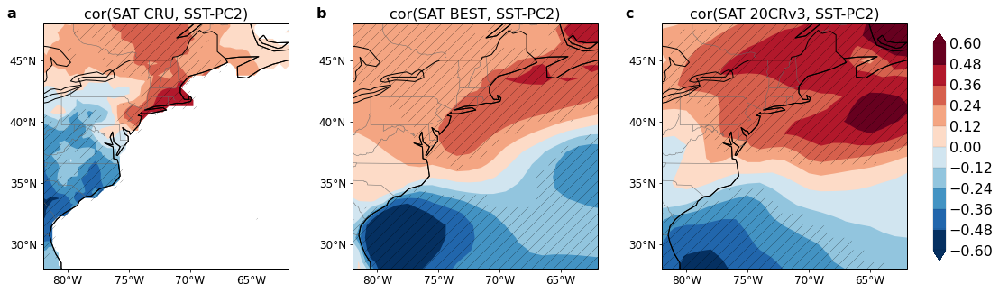

In [141]:
# Supp Fig. 5
matplotlib.rcParams.update({'font.size':12})
reload(utls)
pickedSeason = 'ANN'

# TOP ROW +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
regCtrATL = utls.getLatLonCtr( [-80, -10, 20, 65] )
regCtrATLCalc = utls.getLatLonCtr( [-120, 20, 10, 75] )
# ============================================================
# ============================================================
nn = 1
sm = 120

fig = plt.figure( figsize=(20,5) )
#grid = plt.GridSpec(1, 3, hspace=0.3, wspace=0.2)
nr=1; nc=3


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
nn=2

ncolors = 11; col = 'RdBu_r'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( -0.6, 0.6, ncolors )

# ================
plotCube = cor_sstpc_field_dict_glrem['cru%d' % nn] #cor_sstpc_field_dict['cru%d' % nn]
plotCube_masked = cor_sstpc_field_masked_dict_glrem['cru%d' % nn]
ax = plt.subplot(nr,nc,1, projection=ccrs.PlateCarree())
#tle = 'cor(SAT CRU, SST-PC%s)\n1902-2018, %s' % (str(nn), pickedSeason)
tle = 'cor(SAT CRU, SST-PC%s)' % (str(nn))
cf1 = epsc( plotCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)

cf_dummy = iplt.pcolor(plotCube_masked, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=True) #, pad=-0.65)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[1])   # 7 is colorbar is included in the epsc
del cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent1)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.15)
del plotCube, plotCube_masked

# ================
plotCube = cor_sstpc_field_dict_glrem['best%d' % nn] #cor_sstpc_field_dict['best%d' % nn]
plotCube_masked = cor_sstpc_field_masked_dict_glrem['best%d' % nn]
ax = plt.subplot(nr,nc,2, projection=ccrs.PlateCarree())
#tle = 'cor(SAT BEST, SST-PC%s)\n1902-2018, %s' % (str(nn), pickedSeason)
tle = 'cor(SAT BEST, SST-PC%s)' % (str(nn))
cf1 = epsc( plotCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)

cf_dummy = iplt.pcolor(plotCube_masked, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=True) #, pad=-0.65)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[2])   # 7 is colorbar is included in the epsc
del cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent1)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.15)
del plotCube, plotCube_masked

# ================
plotCube = cor_sstpc_field_dict_glrem['20cr%d' % nn] #cor_sstpc_field_dict['20cr%d' % nn]
plotCube_masked = cor_sstpc_field_masked_dict_glrem['20cr%d' % nn]
ax = plt.subplot(nr,nc,3, projection=ccrs.PlateCarree())
#tle = 'cor(SAT BEST, SST-PC%s)\n1902-2018, %s' % (str(nn), pickedSeason)
tle = 'cor(SAT 20CRv3, SST-PC%s)' % (str(nn))
cf1 = epsc( plotCube, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, orient='vertical', title=tle, ftsize=ft)

cf_dummy = iplt.pcolor(plotCube_masked, hatch='//', alpha=0, cmap=cmap)
colorBar = plt.colorbar(cf_dummy, use_gridspec=True) #, pad=-0.65)
colorBar.remove()
plt.gcf().delaxes(plt.gcf().axes[3])   # 7 is colorbar is included in the epsc
del cf_dummy, colorBar

utls.plotStates(ax)
showlatlons(ax)
ax.set_extent(mapExtent1)
plt.title(tle, fontsize=ft)
plt.title(r'$\bf{c}$', fontsize=ft, loc='left', x=-0.15)
del plotCube, plotCube_masked

plt.subplots_adjust(right=0.8)
#offset=-0.023
#ax.set_position([bbox.x0+offset, bbox.y0, bbox.x1-bbox.x0, bbox.y1-bbox.y0])  #axmove

cbar_ax = fig.add_axes([0.82, 0.15, 0.01, 0.7]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
#cbar_ax = fig.add_axes([0.85, 0.2, 0.02, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf1, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

saveFig = True
if saveFig:
    figName = 'Supp_Fig4'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

#### Seasonal correlations between SAT and Z500 in 20CRv3

In [103]:
print( 'r(SAT, z500) =  FULL  COASTAL  INTERIOR' )
for sn in ['ANN','DJF','MAM','JJA','SON']:
    xx0 = ensutils.extract_years( data20cr_sea_anom_dict['z500'][sn].extract(regCtrNEBOX), 1902, 2015 )
    yy0 = ensutils.extract_years( data20cr_sea_anom_dict['tas'][sn].extract(regCtrNEBOX), 1902, 2015 )
    
    xx = mylib.areaAverage(xx0)
    yy = mylib.areaAverage(yy0)
    xxc = mylib.areaAverage( mylib.applyMask(xx0, neus_masks_coastal['20cr'])  )
    yyc = mylib.areaAverage( mylib.applyMask(yy0, neus_masks_coastal['20cr'])  )
    xxi = mylib.areaAverage( mylib.applyMask(xx0, neus_masks_interior['20cr']) )
    yyi = mylib.areaAverage( mylib.applyMask(yy0, neus_masks_interior['20cr']) )
    
    print( '%s:\t\t%.2f\t%.2f\t%.2f' % ( sn, np.corrcoef(xx.data, yy.data)[0,1], np.corrcoef(xxc.data, yyc.data)[0,1], np.corrcoef(xxi.data, yyi.data)[0,1] ) )
    del xx, yy, xxc, yyc, xxi, yyi

r(SAT, z500) =  FULL  COASTAL  INTERIOR
ANN:		0.74	0.71	0.75
DJF:		0.70	0.68	0.71
MAM:		0.69	0.66	0.74
JJA:		0.80	0.77	0.83
SON:		0.78	0.75	0.77


### SST-Z500 Maximum Covariance Analysis

In [104]:
matplotlib.rcParams.update({'font.size':14})
def quickplot_mcamode(mcaClass, modeNum, mult=1.0, ltcol=['RdBu_r',-0.4,0.4], rtcol=['Reds',0.2,1.0], fldNames=['SST','SAT'], xlims=[1900, 2020], showbar=False, plotMode=None):
    # Get mode spatial and temporal patterns
    lspCube, rspCube, ltsCube, rtsCube = mcaClass.get_mca(modeNum=modeNum, mult=mult, plot=False)
    lspCube = lspCube*ltsCube.data.std()
    rspCube = rspCube*rtsCube.data.std()
    lt = ltsCube/ltsCube.data.std()
    rt = rtsCube/rtsCube.data.std()
    
    per = mcaClass.eigval_per[modeNum-1]
    
    nr=1; nc=4; ft=14
    fig = plt.figure( figsize=(20,4) )
    grid = plt.GridSpec(nr, nc, hspace=0.1, wspace=0.2)
    
    ncolors = 11; col = ltcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'
    clev1 = np.linspace( ltcol[1], ltcol[2], ncolors )
    ax1 = plt.subplot(grid[0, 0], projection=ccrs.PlateCarree())
    #ax1 = plt.subplot(nr,nc,1, projection=ccrs.PlateCarree()); kk+=1 #Mollweide(central_longitude=-65.)); kk+=1
    epsc( lspCube, ax1, clev=clev1, cmap=cmap, extend=extend, colorbar=showbar, title='%s MCA%s (%.1f%%)' % (fldNames[0], str(modeNum), per), ftsize=ft, orient='vertical')
    utls.plotStates(ax1)
    
    ncolors = 11; col = rtcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'
    clev1 = np.linspace( rtcol[1], rtcol[2], ncolors )
    ax2 = plt.subplot(grid[0, 1], projection=ccrs.PlateCarree())
    #ax2 = plt.subplot(nr,nc,2, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-65.)); kk+=1 #ccrs.PlateCarree()
    epsc( rspCube, ax2, clev=clev1, cmap=cmap, extend=extend, pcolor=False, colorbar=showbar, title='%s MCA%s (%.1f%%)' % (fldNames[1], str(modeNum), per), ftsize=ft, orient='vertical')
    utls.plotStates(ax2)
    #plt.subplots_adjust(wspace=-0.1)

    #fig = plt.figure( figsize=(12,5) )
    #ax = plt.subplot(121)

    ax3 = plt.subplot(grid[0, 2:4])
    #ax3 = plt.subplot(nr,nc,3)
    #lt.data = np.ma.masked_outside(lt.data, -2.5, 2.5)
    plt.plot( lt.coord('season_year').points, lt.data, 'b-', label='%s MCA%s' % (fldNames[0], str(modeNum)))#, color='#0571b0', lw=2)#, alpha=0.5 )
    plt.plot( rt.coord('season_year').points, rt.data, 'g-', label='%s MCA%s' % (fldNames[1], str(modeNum)))#, color='#ca0020', lw=2)#, alpha=0.5 )
    #iplt.plot( lt, 'b-')#, color='#0571b0', lw=2)#, alpha=0.5 )
    #iplt.plot( rt, 'g-')#, color='#ca0020', lw=2)#, alpha=0.5 )
    plt.legend(loc=2, fontsize=ft-2)
    plt.title('Principal components', fontsize=ft)
    
    if plotMode:
        # Plot global PC1
        #tsgl = pcs_hsst_minusgl[:,2]
        #plt.plot(tsgl.coord('season_year').points, tsgl.data, 'k')
        
        mName = plotMode
        modedata = ensutils.extract_years(natmodes.modes[plotMode]['ANN'], 1902, 2018)
        ya = np.arange(1902, 2019, 1)
        ax4 = fig.add_subplot(grid[0, 2:4], sharex=ax3, frameon=False)
        tsyr   = modedata.coord('year').points
        indpos = np.where(modedata.data > 0)
        indneg = np.where(modedata.data < 0)
        plt.bar(ya[indpos], modedata.data[indpos], width=1, color='red',  alpha=0.15, label='%s +ve' % mName)
        plt.bar(ya[indneg], modedata.data[indneg], width=1, color='blue', alpha=0.15, label='%s -ve' % mName)

        ax4.yaxis.tick_right()
        ax4.yaxis.set_label_position("right")
        ax4.set_ylim([-1.5, 1.5])
        #ax2.set_ylabel('AMV/AMOC', fontsize=ft)
        
    if modeNum==1:
        pass
        # Plot global PC2
        #tsgl = pcs_hsst_minusgl[:,1]
        #plt.plot(tsgl.coord('season_year').points, tsgl.data, '-', color='#92c5de')
    
    ax3.set_xlim(xlims)
    ax3.set_ylim(-3, 3)

    ax.set_title('r=%.2f' % np.ma.corrcoef(lt.data, rt.data)[0,1])
    print('r(%s, %s in phase)=%.2f'         % (fldNames[0], fldNames[1], np.ma.corrcoef(lt.data, rt.data)[0,1]))
    print('r(%s-dtr, %s-dtr in phase)=%.2f' % (fldNames[0], fldNames[1], np.ma.corrcoef(utls.detrend_cube(lt).data, utls.detrend_cube(rt).data)[0,1]))
    print('r(%s leads %s by 1 tunit)=%.2f'  % (fldNames[0], fldNames[1], np.ma.corrcoef(lt.data[0:-1], rt.data[1:])[0,1]))
    print('r(%s lags %s by 1 tunit)=%.2f'   % (fldNames[0], fldNames[1], np.ma.corrcoef(lt.data[1:], rt.data[0:-1])[0,1]))

    return lt, rt, lspCube, rspCube

Left field:  4389 (114, 3653)
Right field:  4256 (114, 4256)
U, s, V shapes:  (3653, 3653) (3653,) (4256, 4256)
Left field:  1131 (114, 967)
Right field:  4256 (114, 4256)
U, s, V shapes:  (967, 967) (967,) (4256, 4256)


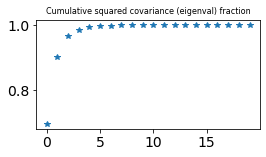

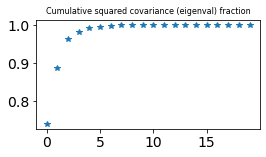

In [105]:
# SAT-SST #mca-sst-z500
reload(utls)
pickedSeason = 'ANN'
mcaPeriod = [1902, 2015]
mcaSstReg = utls.getLatLonCtr([-80,-10,10,65])
mcaSstReg = utls.getLatLonCtr([-85,-10,10,65])

# HadISST --- MAIN ONE INCLUDED IN THE PAPER
#dummy_sst = dummy_sst0.extract( mcaSstReg )
dummy_sst = copy.deepcopy(hadisstFull_mon_anom)
dummy_sst = ensutils.extract_years(dummy_sst, mcaPeriod[0], mcaPeriod[1])
tmpgl     = mylib.areaAverage( ensutils.calc_seasonal_mean_local(dummy_sst.extract(sst_regCtrGl), pickedSeason, verbose=False)[1] )
dummy_sst = ensutils.calc_seasonal_mean_local(dummy_sst.extract( mcaSstReg ), pickedSeason, verbose=False)[1]
#dummy_sst = mylib.subtractCubes(dummy_sst, tmpgl); del tmpgl
#dummy_sst,dum = moving_average_sp(dummy_sst, winlen=3)

# ERSST --- for other checks
dummy_esst = copy.deepcopy(ersstFull_mon_anom)
dummy_esst = ensutils.extract_years(dummy_esst, mcaPeriod[0], mcaPeriod[1])
dummy_esst = ensutils.calc_seasonal_mean_local(dummy_esst.extract( mcaSstReg ), pickedSeason, verbose=False)[1]

# Z500 - 20CRv3
dummy_z500 = copy.deepcopy(data20cr_sea_anom_dict['z500'][pickedSeason].extract( mcaSstReg ))  #utls.getLatLonCtr([-95,0,25,65])
dummy_z500 = ensutils.extract_years(dummy_z500, mcaPeriod[0], mcaPeriod[1])
#dummy_z500 = mylib.subtractCubes(dummy_z500, mylib.areaAverage(dummy_z500) )
#dummy_z500,dum = moving_average_sp(dummy_z500, winlen=11)

mcaAnalysis_sst_z500 = utls.calc_mca(dummy_sst, dummy_z500)        # <--- Main one -- HadISST-based
mcaAnalysis_esst_z500 = utls.calc_mca(dummy_esst, dummy_z500)      # <--- for checks -- ERSST-based
del dummy_z500

r(SST, Z500 in phase)=0.84
r(SST-dtr, Z500-dtr in phase)=0.74
r(SST leads Z500 by 1 tunit)=0.65
r(SST lags Z500 by 1 tunit)=0.61
r(SST, Z500 in phase)=0.80
r(SST-dtr, Z500-dtr in phase)=0.78
r(SST leads Z500 by 1 tunit)=0.25
r(SST lags Z500 by 1 tunit)=0.45

Correlations:
r( SST MCA2, Z500 MCA2) = 0.80

r( SST MCA2, NAO) = 0.59
r(Z500 MCA2, NAO) = 0.80

r( SST MCA2, SST PC2 GL, 1902-2015) = 0.44
r(Z500 MCA2, SST PC2 GL, 1902-2015) = 0.36

r( SST MCA2, SST PC2 GL, 1951-2015) = 0.56
r(Z500 MCA2, SST PC2 GL, 1951-2015) = 0.51

r(SST, Z500 in phase)=0.79
r(SST-dtr, Z500-dtr in phase)=0.79
r(SST leads Z500 by 1 tunit)=0.15
r(SST lags Z500 by 1 tunit)=0.36


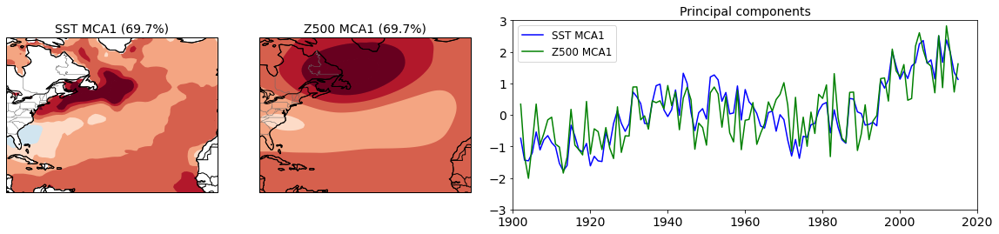

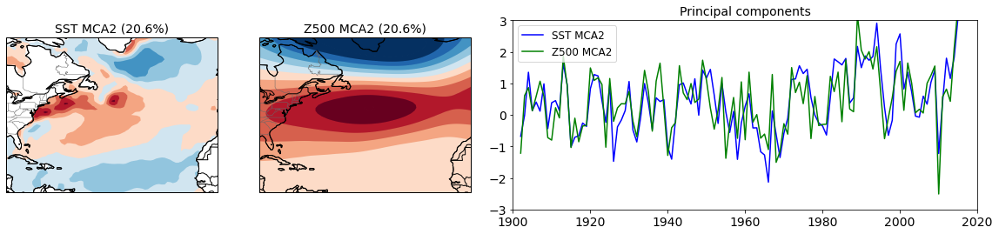

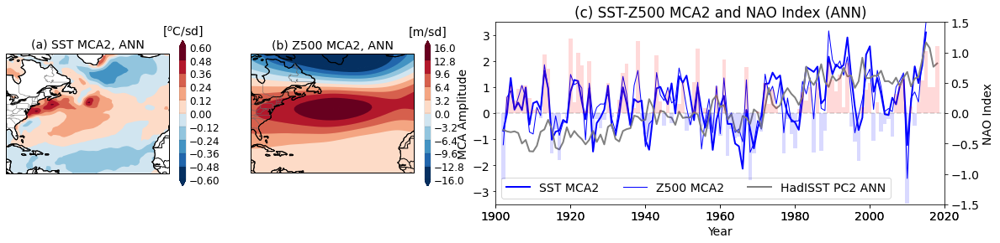

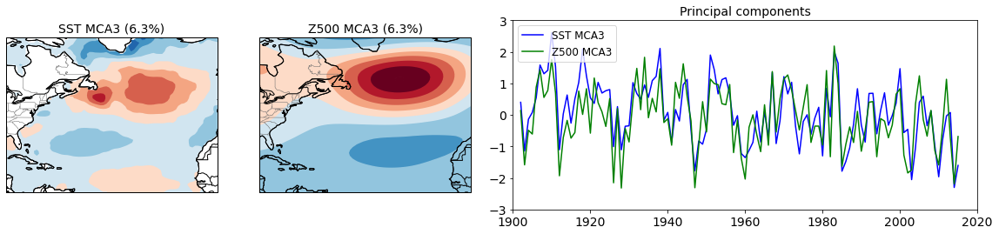

In [106]:
# Plot the first three modes
sstz_l1, sstz_r1, sstz_lsp1, sstz_rsp1 = quickplot_mcamode(mcaAnalysis_sst_z500, 1, mult=1.0, ltcol=['RdBu_r',-0.6,0.6], rtcol=['RdBu_r',-16,16], fldNames=['SST','Z500'])
sstz_l2, sstz_r2, sstz_lsp2, sstz_rsp2 = quickplot_mcamode(mcaAnalysis_sst_z500, 2, mult=1.0, ltcol=['RdBu_r',-0.6,0.6], rtcol=['RdBu_r',-16,16], fldNames=['SST','Z500'])
# Also plot NAO with the second mode (ONLY IN THE CASE OF *ANN*
if pickedSeason=='ANN':
    fldNames= ['SST','Z500']
    modeNum = 2
    lspCube = sstz_lsp2
    rspCube = sstz_rsp2
    lt      = sstz_l2
    rt      = sstz_r2
    ltcol   = ['RdBu_r',-0.6,0.6]
    rtcol   = ['RdBu_r',-16,16]

    nr=1; nc=4; ft=14
    #nr=2; nc=3; ft=14
    fig = plt.figure( figsize=(20,4) )
    grid = plt.GridSpec(nr, nc, hspace=0.1, wspace=0.2)

    # Left SST mode
    ncolors = 11; col = ltcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'; clev1 = np.linspace( ltcol[1], ltcol[2], ncolors )
    ax1 = plt.subplot(grid[0, 0], projection=ccrs.PlateCarree()) #grid[0, 0]
    tle = '(a) SST MCA%s, %s' % (str(modeNum),pickedSeason)
    epsc( lspCube, ax1, clev=clev1, cmap=cmap, extend=extend, colorbar=True, title=tle, ftsize=ft, orient='vertical', unit='$^o$C/sd')
    utls.plotStates(ax1)

    # Right SST mode
    ncolors = 11; col = rtcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'; clev1 = np.linspace( rtcol[1], rtcol[2], ncolors )
    ax2 = plt.subplot(grid[0, 1], projection=ccrs.PlateCarree()) #grid[0, 1]
    tle = '(b) Z500 MCA%s, %s' % (str(modeNum),pickedSeason)
    epsc( rspCube, ax2, clev=clev1, cmap=cmap, extend=extend, pcolor=False, colorbar=True, title=tle, ftsize=ft, orient='vertical', unit='m/sd')
    utls.plotStates(ax2)

    # Time series
    def make_patch_spines_invisible(ax):
        ax.set_frame_on(True)
        ax.patch.set_visible(False)
        for sp in ax.spines.values():
            sp.set_visible(False)

    ax3 = plt.subplot(grid[0, 2:4])  #grid[0:2, 1:3]
    #par1 = ax3.twinx()
    ##par2 = ax3.twinx(); par2.spines["right"].set_position(("axes", 1.2)); make_patch_spines_invisible(par2); par2.spines["right"].set_visible(True)

    ax3.axhline(y=0, ls='--', color='lightgrey')
    p1, = ax3.plot( lt.coord('season_year').points, lt.data, 'b-', lw=2, label='%s MCA%d' % (fldNames[0],modeNum))#, alpha=0.5, color='#0571b0', lw=2)# )
    p11,= ax3.plot( rt.coord('season_year').points, rt.data, 'b-', lw=1, label='%s MCA%d' % (fldNames[1],modeNum))#, color='#ca0020')
    plt.title('(c) SST-Z500 MCA%d and NAO Index (%s)' % (modeNum,pickedSeason))

    #ax3.yaxis.label.set_color(p1.get_color())
    #par1.yaxis.label.set_color(p2.get_color())
    #par2.yaxis.label.set_color(p3.get_color())

    #tkw = dict(size=4, width=1.5)
    #ax3.tick_params(axis='y', colors=p1.get_color(), **tkw)
    #par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
    ##par2.tick_params(axis='y', colors=p3.get_color(), **tkw)
    #ax3.tick_params(axis='x', **tkw)

    mName = 'NAO'
    modedata = ensutils.extract_years(natmodes.modes['NAO']['ANN'], 1902, 2018)
    ya = np.arange(1902, 2019, 1)
    ax4 = fig.add_subplot(grid[0, 2:4], sharex=ax3, frameon=False) #grid[0:2, 1:3]
    tsyr   = modedata.coord('year').points
    indpos = np.where(modedata.data > 0)
    indneg = np.where(modedata.data < 0)
    plt.bar(ya[indpos], modedata.data[indpos], width=1, color='red',  alpha=0.15, label='%s +ve' % mName)
    plt.bar(ya[indneg], modedata.data[indneg], width=1, color='blue', alpha=0.15, label='%s -ve' % mName)

    ax4.yaxis.tick_right()
    ax4.yaxis.set_label_position("right")
    ax4.set_ylim([-1.5, 1.5])
    #ax2.set_ylabel('AMV/AMOC', fontsize=ft)

    if modeNum==2:
        # Plot global PC2
        #tsgl = ensutils.extract_years(pcs_hsst_minusgl[:,1], 1902, 2018)
        nn_sst_pc = 2
        tsgl = ensutils.extract_years(pcs_hsst_minusgl_sea_dict[pickedSeason][:,nn_sst_pc-1], 1902, 2018)
        ax3.plot(tsgl.coord('season_year').points, tsgl.data, '-', lw=2, color='grey', label='HadISST PC2 ANN') #, color='#92c5de')

    ax3.legend(loc=3, fontsize=ft, ncol=3)
    ax3.set_xlim(1900, 2020)
    ax3.set_ylim(-3.5, 3.5)

    ax3.set_xlabel("Year")
    ax3.set_ylabel("MCA Amplitude")
    ax4.set_ylabel("NAO Index")
    #par2.set_ylabel("AMOC Index")

    ax.set_title('r=%.2f' % np.ma.corrcoef(lt.data, rt.data)[0,1])

    # -----------------------------
    print('\nCorrelations:')
    print( 'r( SST MCA2, Z500 MCA2) = %.2f' % np.corrcoef(lt.data, rt.data)[0,1] )
    print()
    modedata = ensutils.extract_years(modedata, 1902, 2015)
    print( 'r( SST MCA2, NAO) = %.2f' % np.corrcoef(lt.data, modedata.data)[0,1] )
    print( 'r(Z500 MCA2, NAO) = %.2f' % np.corrcoef(rt.data, modedata.data)[0,1] )
    print()
    tssst = ensutils.extract_years( pcs_hsst_minusgl_sea_dict[pickedSeason][:,nn_sst_pc-1], 1902, 2015 )
    print( 'r( SST MCA2, SST PC%d GL, 1902-2015) = %.2f' % (nn_sst_pc, np.corrcoef(lt.data, tssst.data)[0,1]))
    print( 'r(Z500 MCA2, SST PC%d GL, 1902-2015) = %.2f' % (nn_sst_pc, np.corrcoef(rt.data, tssst.data)[0,1]))
    print()
    print( 'r( SST MCA2, SST PC%d GL, 1951-2015) = %.2f' % (nn_sst_pc, np.corrcoef(lt.data[-65:], tssst.data[-65:])[0,1]))
    print( 'r(Z500 MCA2, SST PC%d GL, 1951-2015) = %.2f' % (nn_sst_pc, np.corrcoef(rt.data[-65:], tssst.data[-65:])[0,1]))
    print()

sstz_l3, sstz_r3, sstz_lsp3, sstz_rsp3 = quickplot_mcamode(mcaAnalysis_sst_z500, 3, mult=-1.0, ltcol=['RdBu_r',-0.6,0.6], rtcol=['RdBu_r',-18,18], fldNames=['SST','Z500'])

## Supplementary Figure 6<a id="Supp_Fig6"></a>


Correlations:
r( SST MCA1, Z500 MCA1) = 0.84 (0.000)

r( SST MCA1, AMO) = 0.87 (0.000)
r(Z500 MCA1, AMO) = 0.66 (0.000)

r( SST MCA1, SST PC2 GL, 1902-2015) = 0.60
r(Z500 MCA1, SST PC2 GL, 1902-2015) = 0.55

r( SST MCA1, SST PC2 GL, 1951-2015) = 0.41
r(Z500 MCA1, SST PC2 GL, 1951-2015) = 0.41



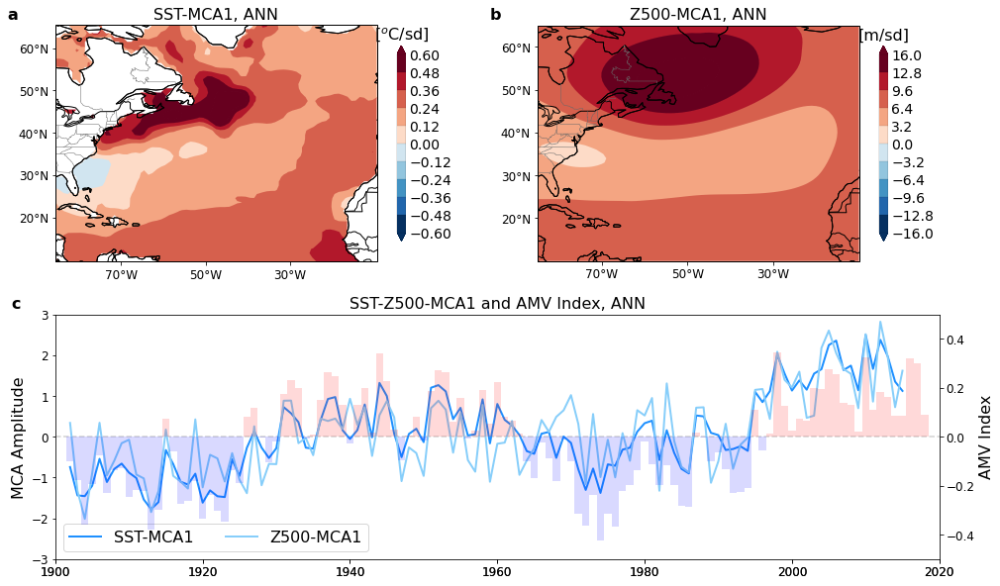

In [107]:
matplotlib.rcParams.update({'font.size':12})
if pickedSeason=='ANN':
    fldNames= ['SST','Z500']
    modeNum = 1
    lspCube = sstz_lsp1
    rspCube = sstz_rsp1
    lt      = sstz_l1
    rt      = sstz_r1
    ltcol   = ['RdBu_r',-0.6,0.6]
    rtcol   = ['RdBu_r',-16,16]

    #nr=1; nc=4; ft=14
    nr=2; nc=2; ft=16
    fig = plt.figure( figsize=(16,10) )
    grid = plt.GridSpec(nr, nc, hspace=0.2, wspace=0.2)

    # Left SST mode
    ncolors = 11; col = ltcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'; clev1 = np.linspace( ltcol[1], ltcol[2], ncolors )
    ax1 = plt.subplot(grid[0, 0], projection=ccrs.PlateCarree()) #ccrs.Mollweide(central_longitude=-40.0)) # # #grid[0, 0]
    tle = 'SST-MCA%s, %s' % (str(modeNum),pickedSeason)
    epsc( lspCube, ax1, clev=clev1, cmap=cmap, extend=extend, colorbar=True, title=tle, ftsize=ft, orient='vertical', unit='$^o$C/sd')
    utls.plotStates(ax1)
    showlatlons(ax1, lons=[-70,-50,-30], lats=[20,30,40,50,60])
    plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.15)

    # Right SST mode
    ncolors = 11; col = rtcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'; clev1 = np.linspace( rtcol[1], rtcol[2], ncolors )
    ax2 = plt.subplot(grid[0, 1], projection=ccrs.PlateCarree()) #ccrs.Mollweide(central_longitude=-40.0)) #projection=ccrs.PlateCarree()) #grid[0, 1]
    tle = 'Z500-MCA%s, %s' % (str(modeNum),pickedSeason)
    epsc( rspCube, ax2, clev=clev1, cmap=cmap, extend=extend, pcolor=False, colorbar=True, title=tle, ftsize=ft, orient='vertical', unit='m/sd')
    utls.plotStates(ax2)
    showlatlons(ax2, lons=[-70,-50,-30], lats=[20,30,40,50,60])
    plt.title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.15)

    # Time series
    def make_patch_spines_invisible(ax):
        ax.set_frame_on(True)
        ax.patch.set_visible(False)
        for sp in ax.spines.values():
            sp.set_visible(False)

    ax3 = plt.subplot(grid[1, 0:2])  #grid[0, 2:4], grid[0:2, 1:3]
    #par1 = ax3.twinx()
    ##par2 = ax3.twinx(); par2.spines["right"].set_position(("axes", 1.2)); make_patch_spines_invisible(par2); par2.spines["right"].set_visible(True)

    ax3.axhline(y=0, ls='--', color='lightgrey')
    p1, = ax3.plot( lt.coord('season_year').points, lt.data, '-', color='dodgerblue', lw=2, label='%s-MCA%d' % (fldNames[0],modeNum))#, alpha=0.5, color='#0571b0', lw=2)# )
    p11,= ax3.plot( rt.coord('season_year').points, rt.data, '-', color='lightskyblue', lw=2, label='%s-MCA%d' % (fldNames[1],modeNum))#, color='#ca0020')
    plt.title('SST-Z500-MCA%d and AMV Index, %s' % (modeNum,pickedSeason), fontsize=ft)
    plt.title(r'$\bf{c}$', fontsize=ft, loc='left', x=-0.05)
    
    #ax3.yaxis.label.set_color(p1.get_color())
    #par1.yaxis.label.set_color(p2.get_color())
    #par2.yaxis.label.set_color(p3.get_color())

    #tkw = dict(size=4, width=1.5)
    #ax3.tick_params(axis='y', colors=p1.get_color(), **tkw)
    #par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
    ##par2.tick_params(axis='y', colors=p3.get_color(), **tkw)
    #ax3.tick_params(axis='x', **tkw)

    mName = 'AMO'
    modedata = ensutils.extract_years(natmodes.modes[mName]['ANN'], 1902, 2018)
    ya = np.arange(1902, 2019, 1)
    ax4 = fig.add_subplot(grid[1, 0:2], sharex=ax3, frameon=False) #grid[0, 2:4], grid[0:2, 1:3]
    tsyr   = modedata.coord('year').points
    indpos = np.where(modedata.data > 0)
    indneg = np.where(modedata.data < 0)
    plt.bar(ya[indpos], modedata.data[indpos], width=1, color='red',  alpha=0.15, label='%s +ve' % mName)
    plt.bar(ya[indneg], modedata.data[indneg], width=1, color='blue', alpha=0.15, label='%s -ve' % mName)

    ax4.yaxis.tick_right()
    ax4.yaxis.set_label_position("right")
    ax4.set_ylim([-0.5, 0.5])
    #ax2.set_ylabel('AMV/AMOC', fontsize=ft)

    if modeNum==2:
        # Plot global PC2
        #tsgl = ensutils.extract_years(pcs_hsst_minusgl[:,1], 1902, 2018)
        nn_sst_pc = 2
        tsgl = ensutils.extract_years(pcs_hsst_minusgl_sea_dict[pickedSeason][:,nn_sst_pc-1], 1902, 2018)
        ax3.plot(tsgl.coord('season_year').points, tsgl.data, '-', lw=2, color='k', label='SST-PC2 ANN') #, color='#92c5de')

    ax3.legend(loc=3, fontsize=ft, ncol=3)
    ax3.set_xlim(1900, 2020)
    ax3.set_ylim(-3, 3)

    #ax3.set_xlabel("Year", fontsize=ft-2)
    ax3.set_ylabel("MCA Amplitude", fontsize=ft)
    ax4.set_ylabel("AMV Index", fontsize=ft)
    #par2.set_ylabel("AMOC Index")

    ax.set_title('r=%.2f' % np.ma.corrcoef(lt.data, rt.data)[0,1])

    # -----------------------------
    print('\nCorrelations:')
    rval, pval = scipy.stats.pearsonr(lt.data, rt.data)
    print( 'r( SST MCA1, Z500 MCA1) = %.2f (%.3f)' % (rval, pval) ); del rval, pval
    print()
    modedata = ensutils.extract_years(modedata, 1902, 2015)
    
    rval,pval = scipy.stats.pearsonr(lt.data, modedata.data)
    print( 'r( SST MCA1, %s) = %.2f (%.3f)' % (mName, rval, pval) ); del rval, pval
    rval,pval = scipy.stats.pearsonr(rt.data, modedata.data)
    print( 'r(Z500 MCA1, %s) = %.2f (%.3f)' % (mName, rval, pval) ); del rval, pval
    print()
    tssst = ensutils.extract_years( pcs_hsst_minusgl_sea_dict[pickedSeason][:,nn_sst_pc-1], 1902, 2015 )
    print( 'r( SST MCA1, SST PC%d GL, 1902-2015) = %.2f' % (nn_sst_pc, np.corrcoef(lt.data, tssst.data)[0,1]))
    print( 'r(Z500 MCA1, SST PC%d GL, 1902-2015) = %.2f' % (nn_sst_pc, np.corrcoef(rt.data, tssst.data)[0,1]))
    print()
    print( 'r( SST MCA1, SST PC%d GL, 1951-2015) = %.2f' % (nn_sst_pc, np.corrcoef(lt.data[-65:], tssst.data[-65:])[0,1]))
    print( 'r(Z500 MCA1, SST PC%d GL, 1951-2015) = %.2f' % (nn_sst_pc, np.corrcoef(rt.data[-65:], tssst.data[-65:])[0,1]))
    print()
    
saveFig = True
if saveFig:
    figName = 'Supp_Fig6'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

## Figure 3<a id="Figure3"></a>


Correlations:
r( SST MCA2, Z500 MCA2) = 0.80 (0.000)

r( SST MCA2, NAO) = 0.59 (0.000)
r(Z500 MCA2, NAO) = 0.80 (0.000)

r( SST MCA2, SST PC2 GL, 1902-2015) = 0.44
r(Z500 MCA2, SST PC2 GL, 1902-2015) = 0.36

r( SST MCA2, SST PC2 GL, 1951-2015) = 0.56
r(Z500 MCA2, SST PC2 GL, 1951-2015) = 0.51



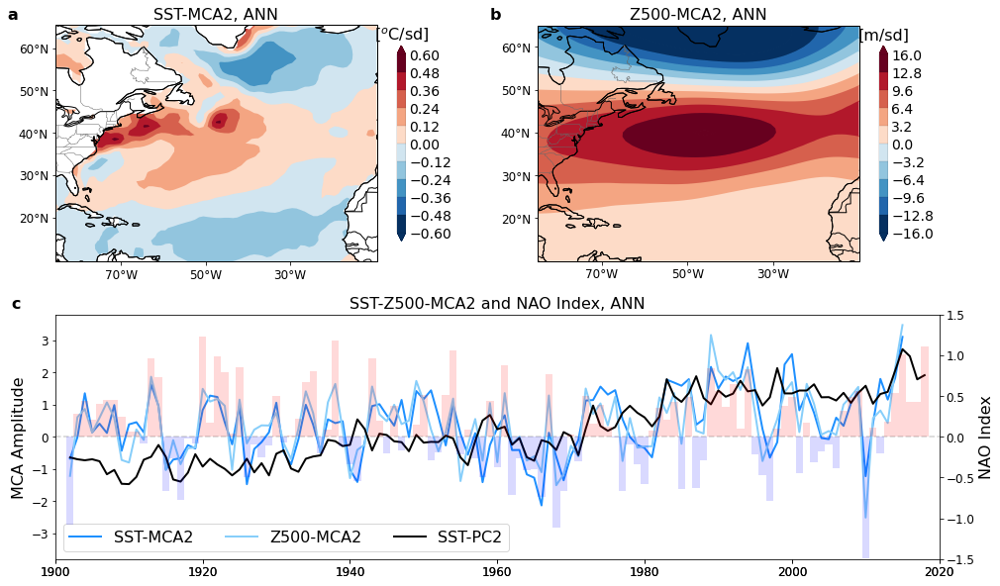

In [108]:
matplotlib.rcParams.update({'font.size':12})
if pickedSeason=='ANN':
    fldNames= ['SST','Z500']
    modeNum = 2
    lspCube = sstz_lsp2
    rspCube = sstz_rsp2
    lt      = sstz_l2
    rt      = sstz_r2
    ltcol   = ['RdBu_r',-0.6,0.6]
    rtcol   = ['RdBu_r',-16,16]

    #nr=1; nc=4; ft=14
    nr=2; nc=2; ft=16
    fig = plt.figure( figsize=(16,10) )
    grid = plt.GridSpec(nr, nc, hspace=0.2, wspace=0.2)

    # Left SST mode +++++++++++++++++++++++++++++++++++
    ncolors = 11; col = ltcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'; clev1 = np.linspace( ltcol[1], ltcol[2], ncolors )
    ax1 = plt.subplot(grid[0, 0], projection=ccrs.PlateCarree()) #ccrs.Mollweide(central_longitude=-40.0)) # # #grid[0, 0]
    tle = 'SST-MCA%s, %s' % (str(modeNum),pickedSeason)
    epsc( lspCube, ax1, clev=clev1, cmap=cmap, extend=extend, colorbar=True, title=tle, ftsize=ft, orient='vertical', unit='$^o$C/sd')
    utls.plotStates(ax1)
    showlatlons(ax1, lons=[-70,-50,-30], lats=[20,30,40,50,60])
    plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.15)
    
    #mcaSstReg = utls.getLatLonCtr([-80,-10,10,65])
    #mcaSstReg = utls.getLatLonCtr([-85,-10,10,65])

    # Right Z500 mode +++++++++++++++++++++++++++++++++++
    ncolors = 11; col = rtcol[0]; cmap = cm.get_cmap(col, ncolors); extend = 'both'; clev1 = np.linspace( rtcol[1], rtcol[2], ncolors )
    ax2 = plt.subplot(grid[0, 1], projection=ccrs.PlateCarree()) #ccrs.Mollweide(central_longitude=-40.0)) #projection=ccrs.PlateCarree()) #grid[0, 1]
    tle = 'Z500-MCA%s, %s' % (str(modeNum),pickedSeason)
    epsc( rspCube, ax2, clev=clev1, cmap=cmap, extend=extend, pcolor=False, colorbar=True, title=tle, ftsize=ft, orient='vertical', unit='m/sd')
    utls.plotStates(ax2)
    showlatlons(ax2, lons=[-70,-50,-30], lats=[20,30,40,50,60])
    plt.title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.15)

    # Time series +++++++++++++++++++++++++++++++++++
    def make_patch_spines_invisible(ax):
        ax.set_frame_on(True)
        ax.patch.set_visible(False)
        for sp in ax.spines.values():
            sp.set_visible(False)

    ax3 = plt.subplot(grid[1, 0:2])  #grid[0, 2:4], grid[0:2, 1:3]
    #par1 = ax3.twinx()
    ##par2 = ax3.twinx(); par2.spines["right"].set_position(("axes", 1.2)); make_patch_spines_invisible(par2); par2.spines["right"].set_visible(True)

    ax3.axhline(y=0, ls='--', color='lightgrey')
    p1, = ax3.plot( lt.coord('season_year').points, lt.data, '-', color='dodgerblue', lw=2, label='%s-MCA%d' % (fldNames[0],modeNum))#, alpha=0.5, color='#0571b0', lw=2)# )
    p11,= ax3.plot( rt.coord('season_year').points, rt.data, '-', color='lightskyblue', lw=2, label='%s-MCA%d' % (fldNames[1],modeNum))#, color='#ca0020')
    plt.title('SST-Z500-MCA%d and NAO Index, %s' % (modeNum,pickedSeason), fontsize=ft)
    plt.title(r'$\bf{c}$', fontsize=ft, loc='left', x=-0.05)

    #ax3.yaxis.label.set_color(p1.get_color())
    #par1.yaxis.label.set_color(p2.get_color())
    #par2.yaxis.label.set_color(p3.get_color())

    #tkw = dict(size=4, width=1.5)
    #ax3.tick_params(axis='y', colors=p1.get_color(), **tkw)
    #par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
    ##par2.tick_params(axis='y', colors=p3.get_color(), **tkw)
    #ax3.tick_params(axis='x', **tkw)

    mName = 'NAO'
    modedata = ensutils.extract_years(natmodes.modes['NAO']['ANN'], 1902, 2018)
    ya = np.arange(1902, 2019, 1)
    ax4 = fig.add_subplot(grid[1, 0:2], sharex=ax3, frameon=False) #grid[0, 2:4], grid[0:2, 1:3]
    tsyr   = modedata.coord('year').points
    indpos = np.where(modedata.data > 0)
    indneg = np.where(modedata.data < 0)
    plt.bar(ya[indpos], modedata.data[indpos], width=1, color='red',  alpha=0.15, label='%s +ve' % mName)
    plt.bar(ya[indneg], modedata.data[indneg], width=1, color='blue', alpha=0.15, label='%s -ve' % mName)

    ax4.yaxis.tick_right()
    ax4.yaxis.set_label_position("right")
    ax4.set_ylim([-1.5, 1.5])
    #ax2.set_ylabel('AMV/AMOC', fontsize=ft)

    if modeNum==2:
        # Plot global PC2
        #tsgl = ensutils.extract_years(pcs_hsst_minusgl[:,1], 1902, 2018)
        nn_sst_pc = 2
        tsgl = ensutils.extract_years(pcs_hsst_minusgl_sea_dict[pickedSeason][:,nn_sst_pc-1], 1902, 2018)
        ax3.plot(tsgl.coord('season_year').points, tsgl.data, '-', lw=2, color='k', label='SST-PC2') #, color='#92c5de')

    ax3.legend(loc=3, fontsize=ft, ncol=3)
    ax3.set_xlim(1900, 2020)
    ax3.set_ylim(-3.8, 3.8)

    #ax3.set_xlabel("Year", fontsize=ft-2)
    ax3.set_ylabel("MCA Amplitude", fontsize=ft)
    ax4.set_ylabel("NAO Index", fontsize=ft)
    #par2.set_ylabel("AMOC Index")

    ax.set_title('r=%.2f' % np.ma.corrcoef(lt.data, rt.data)[0,1])

    # -----------------------------
    print('\nCorrelations:')
    rval, pval = scipy.stats.pearsonr(lt.data, rt.data)
    print( 'r( SST MCA2, Z500 MCA2) = %.2f (%.3f)' % (rval, pval) ); del rval, pval
    print()
    modedata = ensutils.extract_years(modedata, 1902, 2015)
    
    rval,pval = scipy.stats.pearsonr(lt.data, modedata.data)
    print( 'r( SST MCA2, %s) = %.2f (%.3f)' % (mName, rval, pval) ); del rval, pval
    rval,pval = scipy.stats.pearsonr(rt.data, modedata.data)
    print( 'r(Z500 MCA2, %s) = %.2f (%.3f)' % (mName, rval, pval) ); del rval, pval
    print()
    tssst = ensutils.extract_years( pcs_hsst_minusgl_sea_dict[pickedSeason][:,nn_sst_pc-1], 1902, 2015 )
    print( 'r( SST MCA2, SST PC%d GL, 1902-2015) = %.2f' % (nn_sst_pc, np.corrcoef(lt.data, tssst.data)[0,1]))
    print( 'r(Z500 MCA2, SST PC%d GL, 1902-2015) = %.2f' % (nn_sst_pc, np.corrcoef(rt.data, tssst.data)[0,1]))
    print()
    print( 'r( SST MCA2, SST PC%d GL, 1951-2015) = %.2f' % (nn_sst_pc, np.corrcoef(lt.data[-65:], tssst.data[-65:])[0,1]))
    print( 'r(Z500 MCA2, SST PC%d GL, 1951-2015) = %.2f' % (nn_sst_pc, np.corrcoef(rt.data[-65:], tssst.data[-65:])[0,1]))
    print()
    
saveFig = True
if saveFig:
    figName = 'Fig3'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

##### Test correlation coefficients

In [109]:
winlen_arr = np.arange(1,13,2)
winlen_cc_lt = []
winlen_cc_rt = []
for winlen in winlen_arr:
    ww       = int(np.floor(winlen/2))
    lt_sm    = moving_average_ts(lt, winlen=winlen)
    rt_sm    = moving_average_ts(rt, winlen=winlen)
    tssst_sm = moving_average_ts(tssst, winlen=winlen)
    
    if winlen>1:
        winlen_cc_lt.append( np.ma.corrcoef(lt_sm.data[ww:-ww], tssst_sm.data[ww:-ww])[0,1] )
        winlen_cc_rt.append( np.ma.corrcoef(rt_sm.data[ww:-ww], tssst_sm.data[ww:-ww])[0,1] )
    else:
        winlen_cc_lt.append( np.ma.corrcoef(lt_sm.data, tssst_sm.data)[0,1] )
        winlen_cc_rt.append( np.ma.corrcoef(rt_sm.data, tssst_sm.data)[0,1] )
    
winlen_cc_lt = np.array(winlen_cc_lt)
winlen_cc_rt = np.array(winlen_cc_rt)

# all detrended
winlen_cc_lt_dtr = []
winlen_cc_rt_dtr = []
for winlen in winlen_arr:
    ww       = int(np.floor(winlen/2))
    lt_sm    = moving_average_ts(utls.detrend_cube(lt), winlen=winlen)
    rt_sm    = moving_average_ts(utls.detrend_cube(rt), winlen=winlen)
    tssst_sm = moving_average_ts(utls.detrend_cube(tssst), winlen=winlen)

    if winlen>1:
        winlen_cc_lt_dtr.append( np.ma.corrcoef(lt_sm.data[ww:-ww], tssst_sm.data[ww:-ww])[0,1] )
        winlen_cc_rt_dtr.append( np.ma.corrcoef(rt_sm.data[ww:-ww], tssst_sm.data[ww:-ww])[0,1] )
    else:
        winlen_cc_lt_dtr.append( np.ma.corrcoef(lt_sm.data, tssst_sm.data)[0,1] )
        winlen_cc_rt_dtr.append( np.ma.corrcoef(rt_sm.data, tssst_sm.data)[0,1] )
    
winlen_cc_lt_dtr = np.array(winlen_cc_lt_dtr)
winlen_cc_rt_dtr = np.array(winlen_cc_rt_dtr)

# Print results -------------------------------------
print('SST-MCA2 and SST-PC2')
print('win\tOrig\tDetr')
for ww, win in enumerate(winlen_arr):
    print('%d\t %.2f\t %.2f' % (win, winlen_cc_lt.data[ww], winlen_cc_lt_dtr.data[ww]))
    
print('\nZ500-MCA2 and SST-PC2')
print('win\tOrig\tDetr')
for ww, win in enumerate(winlen_arr):
    print('%d\t %.2f\t %.2f' % (win, winlen_cc_rt.data[ww], winlen_cc_rt_dtr.data[ww]))

SST-MCA2 and SST-PC2
win	Orig	Detr
1	 0.44	 0.36
3	 0.54	 0.56
5	 0.59	 0.65
7	 0.63	 0.70
9	 0.67	 0.76
11	 0.70	 0.81

Z500-MCA2 and SST-PC2
win	Orig	Detr
1	 0.36	 0.35
3	 0.45	 0.54
5	 0.51	 0.62
7	 0.57	 0.68
9	 0.62	 0.74
11	 0.64	 0.79


## Supplementary Figure 7<a id="Supp_Fig7"></a>

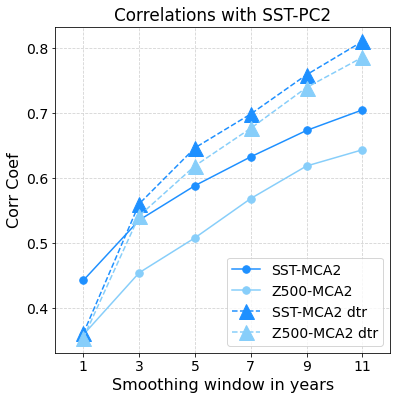

In [110]:
matplotlib.rcParams.update({'font.size':14})
fig = plt.figure(figsize=(6,6))
ax = plt.subplot(111)

plt.plot(winlen_arr, winlen_cc_lt.data, '.-', color='dodgerblue', ms=15, label='SST-MCA2')
plt.plot(winlen_arr, winlen_cc_rt.data, '.-', color='lightskyblue', ms=15, label='Z500-MCA2')

plt.plot(winlen_arr, winlen_cc_lt_dtr.data, '^--', color='dodgerblue', ms=15, label='SST-MCA2 dtr')
plt.plot(winlen_arr, winlen_cc_rt_dtr.data, '^--', color='lightskyblue', ms=15, label='Z500-MCA2 dtr')

xt = ax.set_xticks(winlen_arr)
xt = ax.set_xticklabels(winlen_arr)
del xt

ax.set_xlim(0,12)
plt.grid(ls='--', color='lightgrey')
plt.legend(loc=4)
plt.xlabel('Smoothing window in years', fontsize=16)
plt.ylabel('Corr Coef', fontsize=16)
plt.title('Correlations with SST-PC2')

saveFig = True
if saveFig:
    figName = 'Supp_Fig7'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

### Regressions #regr

In [111]:
# Calculate regressions between 20CR fields (anomalies) and SST-PC1
pickedSeason = 'ANN'

ts_sst = sstz_l2    # from SST (HadISST)-Z500 (20CR) MCA
tsName = 'SST-Z500-MCA2'

mult = 1.0

ts_sst = ensutils.extract_years( ts_sst, 1902, 2015, calendarYear=False )
ts_sst.data = ts_sst.data/ts_sst.data.std()
#ts_sst = ensutils.calc_seasonal_mean_local(ts_sst, pickedSeason, verbose=False)[1]
print( ts_sst.coord('time')[0]  )
print( ts_sst.coord('time')[-1] ) 
#iplt.plot(ts_sst)

regmap_sst_dict = {}; cormap_sst_dict = {}
tmpList = list(data20cr_sea_anom_dict.keys())

#tmpListShort  = ['tas', 'psl', 't850', 'z500', 'qnet', 'thfl', 'u500', 'v500', 'u850', 'v850', 'uw10', 'vw10', 'v250']
tmpListShort  = ['tas', 't850', 'z500', 'qnet', 'u500', 'v500', 'u850', 'v850', 'uw10', 'vw10']#, 'v250']
for var in tmpListShort:
    if var=='t850':
        vCube = data20cr_sea_anom_dict['ta_p'][pickedSeason].extract( iris.Constraint(Level=850.) )
    elif var=='thfl':
        vCube = data20cr_sea_anom_dict['lhfl'][pickedSeason] + data20cr_sea_anom_dict['shfl'][pickedSeason]
    else:
        vCube = data20cr_sea_anom_dict[var][pickedSeason]   
        
    if var=='z500' or var=='v250' or var=='tas':
        vCube = data20cr_nhem_sea_anom_dict[var][pickedSeason] 
        cube = ensutils.extract_years(vCube.extract(regCtrNHEM), 1902, 2015, calendarYear=False)
    else:
        cube = ensutils.extract_years(vCube.extract(regCtrCONUSNAT), 1902, 2015, calendarYear=False)
        
    #if var=='tas':
    #    cube = ensutils.extract_years( ensutils.calc_seasonal_mean_local(tas_ber_mon_anom.extract(regCtrCONUSNAT),pickedSeason,verbose=False)[1], 1902, 2015, calendarYear=False)
    
    #if var=='tas':
    #    cube = ensutils.calc_seasonal_mean_local(bestAnom.extract(regCtrCONUSNAT), sn, verbose=False)[1]
    #    cube = ensutils.extract_years(cube, 1902, 2015, calendarYear=False)
    #else:
    #    cube = ensutils.extract_years(data20cr_mon_anom_dict[var].extract(regCtrCONUSNAT), 1902, 2015, calendarYear=False)
    rr, cc = utls.regress_map_ts( cube, ts_sst.data, mask=True )
    regmap_sst_dict.setdefault(var, rr)
    cormap_sst_dict.setdefault(var, cc)
    del rr, cc, cube

# CRU
cube = ensutils.calc_seasonal_mean_local(tas_cru_mon_anom.extract(regCtrCONUSNAT), pickedSeason, verbose=False)[1]
cube = ensutils.extract_years(cube, 1902, 2015, calendarYear=False)
rr, cc = utls.regress_map_ts( cube, ts_sst.data, mask=True )
regmap_sst_dict.setdefault('tas_cru', rr)
cormap_sst_dict.setdefault('tas_cru', cc)
del rr, cc, cube

# BEST 
cube = ensutils.calc_seasonal_mean_local(bestAnom.extract(regCtrCONUSNAT), pickedSeason, verbose=False)[1]
cube = ensutils.extract_years(cube, 1902, 2015, calendarYear=False)
rr, cc = utls.regress_map_ts( cube, ts_sst.data, mask=True )
regmap_sst_dict.setdefault('tas_best', rr)
cormap_sst_dict.setdefault('tas_best', cc)
del rr, cc, cube

del ts_sst

DimCoord([1902-06-01 12:00:00], bounds=[[1901-12-01 00:00:00, 1902-12-01 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')
DimCoord([2015-06-02 00:00:00], bounds=[[2014-12-01 00:00:00, 2015-12-02 00:00:00]], standard_name='time', calendar='gregorian', long_name='Time', var_name='time')


## Supplementary Figure 8<a id="Supp_Fig8"></a>

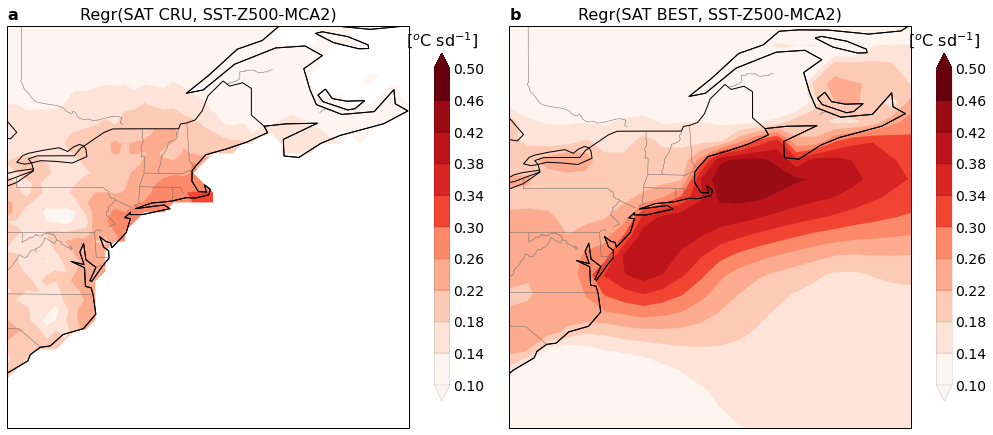

In [112]:
fig = plt.figure( figsize=(18,8) )
nr=1; nc=2
ncolors = 11; extend = 'both'; ft=16
col = 'Reds'; clev1 = np.linspace( 0.1, 0.5, ncolors ); cmap = cm.get_cmap(col, ncolors)
    
cb0 = regmap_sst_dict['tas_cru']
tle = 'Regr(SAT CRU, %s)' % tsName
ut = '$^o$C sd$^{-1}$'
ax = plt.subplot(nr,nc,1, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-160.))
cb0 = cb0.extract(regCtrENA)
epsc( cb0, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, pcolor=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
utls.plotStates(ax)
plt.title(r'$\bf{a}$', fontsize=ft, loc='left')
del cb0, tle, ut

cb0 = regmap_sst_dict['tas_best']
tle = 'Regr(SAT BEST, %s)' % tsName
ut = '$^o$C sd$^{-1}$'
ax = plt.subplot(nr,nc,2, projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-160.))
cb0 = cb0.extract(regCtrENA)
epsc( cb0, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, pcolor=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
utls.plotStates(ax)
plt.title(r'$\bf{b}$', fontsize=ft, loc='left')
del cb0, tle, ut

plt.subplots_adjust(wspace=0)

saveFig = True
if saveFig:
    figName = 'Supp_Fig8'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

## Extended Data Figure 2<a id="ExtendedData_Fig2"></a>

#### Cross-sections

114
0.023601055145263672
114
0.009477853775024414


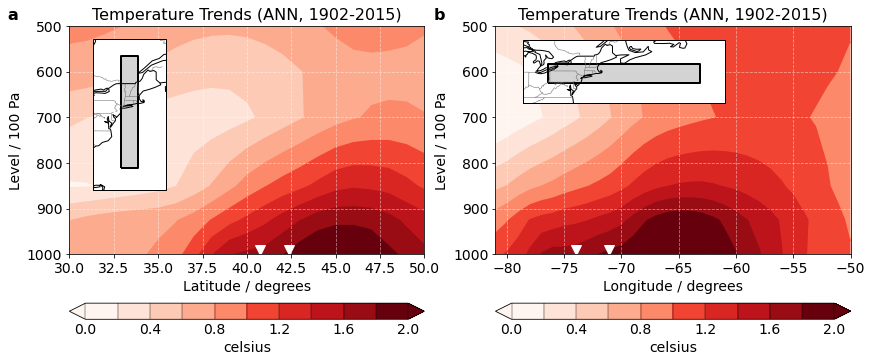

In [113]:
# Zonal and Meridional Cross Sections (Trends)
pickedSeason = 'ANN'
syr1 = 1902
eyr1 = 2015

lon_boston = -71.0589
lon_nyc = -74

lat_boston = 42.3601
lat_nyc = 40.7128

# =============================
matplotlib.rcParams.update({'font.size':14})
fig = plt.figure(figsize=(14,6))
nr = 1; nc = 2
ncolors = 11; extend = 'both'; ft=16

# =============================
# Plotting trends in tropospehric temperatures
crossSecBox = [-74,-71,30,50]
crosssecCtr = utls.getLatLonCtr(crossSecBox)
dummyCube = data20cr_sea_anom_dict['ta_p'][pickedSeason].extract(crosssecCtr).collapsed('longitude', iris.analysis.MEAN)
col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0, 2, ncolors )
dummyCube0 = ensutils.extract_years(dummyCube, syr1, eyr1)
dummyTrends = calc_single_cube_trends_local_linalg(dummyCube0); del dummyCube0
ax = plt.subplot(nr,nc,1) #, projection=ccrs.PlateCarree())
tle = 'Temperature Trends (%s, 1902-2015)' % pickedSeason
iplt.contourf(dummyTrends[:6], clev1, cmap=cmap, extend=extend, clev=clev1) #; del dummyTrends
plt.plot(lat_boston, 990., 'v', mfc='w', mec='w', ms=10)
plt.plot(lat_nyc, 990., 'v', mfc='w', mec='w', ms=10)
tl = plt.title(tle, fontsize=ft)
ax.grid(ls='--', color='w', alpha=0.5)
plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.175)

axin = plt.axes([0.01, 0.5, 0.35, 0.35], projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-45.)) 
utls.show_regBox(crossSecBox, axesHandle=axin, facecolor='lightgrey')
axin.set_extent( [crossSecBox[0]-5, crossSecBox[1]+5, crossSecBox[2]-4, crossSecBox[3]+3] )
#gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='lightgray', alpha=0.5, linestyle='-')
#gl.xlabels_top = False
#gl.xlabels_bottom = False
##gl.ylabels_left = False
#gl.ylabels_right = False
#gl.ylocator = mticker.FixedLocator([25,30,35,40,45])
#gl.yformatter = LATITUDE_FORMATTER

# =============================
# Plotting trends in tropospehric temperatures
crossSecBox = [-81,-50,39.5,43.5]
crosssecCtr = utls.getLatLonCtr(crossSecBox)
dummyCube = data20cr_sea_anom_dict['ta_p'][pickedSeason].extract(crosssecCtr).collapsed('latitude', iris.analysis.MEAN)
col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0, 2, ncolors )
dummyCube0 = ensutils.extract_years(dummyCube, syr1, eyr1)
dummyTrends = calc_single_cube_trends_local_linalg(dummyCube0); del dummyCube0
ax = plt.subplot(nr,nc,2) #, projection=ccrs.PlateCarree())
tle = 'Temperature Trends (%s, 1902-2015)' % pickedSeason
iplt.contourf(dummyTrends[:6], clev1, cmap=cmap, extend=extend, clev=clev1) #; del dummyTrends
plt.plot(lon_boston, 990., 'v', mfc='w', mec='w', ms=10)
plt.plot(lon_nyc, 990., 'v', mfc='w', mec='w', ms=10)
tl = plt.title(tle, fontsize=ft)
ax.grid(ls='--', color='w', alpha=0.5)
plt.title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.175)

axin = plt.axes([0.575, 0.675, 0.2, 0.2], projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-45.)) 
utls.show_regBox(crossSecBox, axesHandle=axin, facecolor='lightgrey')
axin.set_extent( [crossSecBox[0]-5, crossSecBox[1]+5, crossSecBox[2]-4, crossSecBox[3]+3] )

saveFig = True
if saveFig:
    figName = 'ExtendedData_Fig2'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

## Figure 4<a id="Figure4"></a>

In [114]:
ts_sst = sstz_l2   # from SST (HadISST)-Z500 (20CR) MCA
tsName = 'SST-Z500-MCA2'

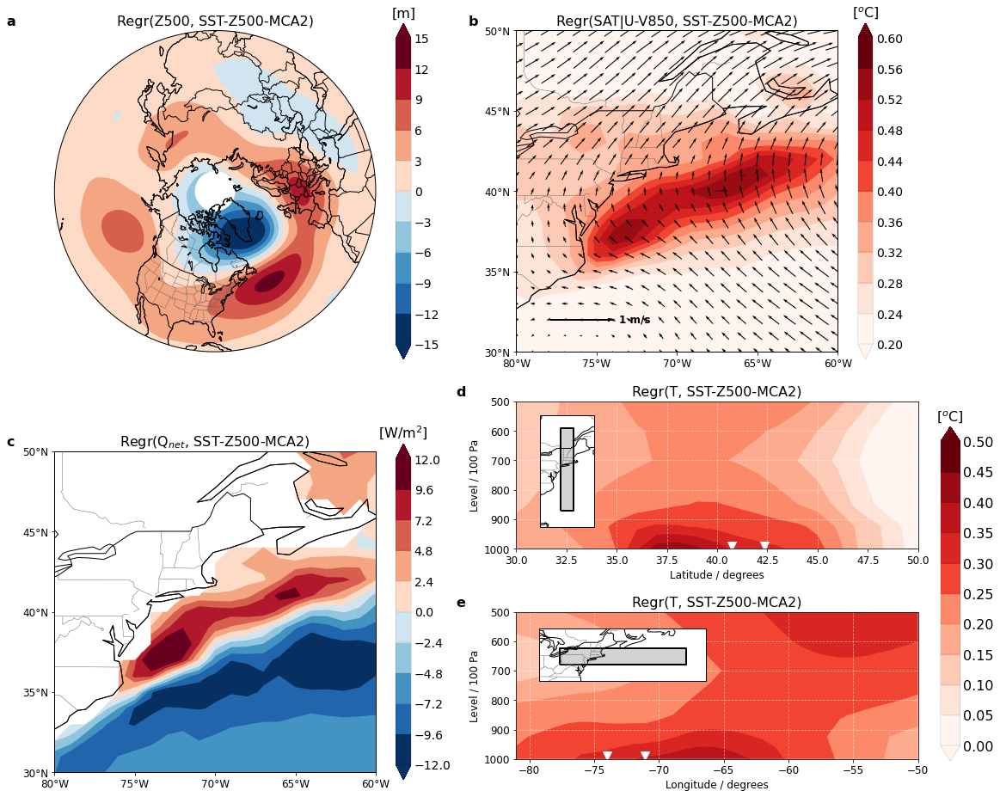

In [115]:
# Putting all the above together in Fig. 4
matplotlib.rcParams.update({'font.size':12})

# 20CR - Regression maps global PC2
tmpListShort  = ['z500', 'tas', 'qnet']#, 'v250']
tmpListTitles = ['(a) Regr(Z500, %s)' % tsName, '(b) Regr(SAT|U-V850, %s)' % tsName, '(c) Regr(Q$_{net}$, %s)' % tsName, 'Regr(V250, %s)' % tsName]
tmpListUnits  = ['m sd$^{-1}$', '$^o$C sd$^{-1}$', 'W m$^{-2}$ sd$^{-1}$', 'm s$^{-1}$ sd$^{-1}$']
tmpListClev   = {'tas': [0,0.8], 'psl': [0,0.8], 'qnet':[-15, 15], 'sh_p': [1e-4,4e-4], 'z500': [0,20], 'pr':[-0.2, 0.2]}

#tmpListShortTitles = ['regmap(SAT, SST-PC1)', 'regmap(LW sfc flux, SST-PC1)', 'regmap(SHUM sfc, SST-PC1)']

#tmpListClev = {'tas': [0.2,0.8], 'psl': [0,0.8], 'qnet':[-0.5, 0.5], 'sh_p': [1e-4,4e-4], 'lhfl': [-4,4], 'shfl': [-4,4], 'z500': [0,0.5], 'pr':[-0.2, 0.2]}
tmpListUnit = {'z500':'m','lwsfl':'W/m$^{-2}$','sh_p':'gm/kg', 'pr':'mm/d', 'qnet':'W/m$^2$', 'tas':'$^o$C', 'psl':'hPa'}
tmpListCol  = {'z500':'Oranges','qnet':'RdBu_r','sh_p':'Greens', 'pr':'Greens', 'tas': 'Reds', 'psl':'Oranges'}

tmpRegCtr = regCtrENA # utls.getLatLonCtr( [-100,0,20,70] )#CONUSNAT #regCtrENA
#tmpRegCtr = utls.getLatLonCtr( [-85,-45,25,60] )
    
fig = plt.figure( figsize=(18,18) )
nr=4; nc=2

grid = plt.GridSpec(4, 2, hspace=0, wspace=0.15)

ncolors = 11; extend = 'both'; ft=16; kk=1
# Z500
col = 'RdBu_r'; clev1 = np.linspace( -15, 15, ncolors ); cmap = cm.get_cmap(col, ncolors)
cb0 = regmap_sst_dict[var]
ax = plt.subplot(grid[0:2,0], projection=ccrs.NorthPolarStereo(central_longitude=-80.))
cb0 = regmap_sst_dict['z500']
tle = 'Regr(Z500, %s)' % tsName
ut  = 'm'
epsc( cb0, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, pcolor=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
utls.plotStates(ax)
plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.15)
utls.make_it_circular(ax)
del cb0

# SAT
col = 'Reds'; clev1 = np.linspace( 0.2, 0.6, ncolors ); cmap = cm.get_cmap(col, ncolors)
cb0 = regmap_sst_dict['tas']
ax = plt.subplot(grid[0:2,1], projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-160.))
cb0 = cb0.extract(tmpRegCtr)
tle = 'Regr(SAT|U-V850, %s)' % tsName
ut  = '$^o$C'
epsc( cb0, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, pcolor=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
winds_quickplot(regmap_sst_dict['u850'].extract(tmpRegCtr), regmap_sst_dict['v850'].extract(tmpRegCtr), scale=1)
utls.plotStates(ax)
showlatlons(ax)
plt.title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.15)
del cb0

# Qnet
col = 'RdBu_r'; clev1 = np.linspace( -12, 12, ncolors ); cmap = cm.get_cmap(col, ncolors)
cb0 = regmap_sst_dict['qnet']
cb0 = mylib.applyMask(cb0, lsm_20cr_ocean.extract(regCtrCONUSNAT))
ax = plt.subplot(grid[2:4,0], projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-160.))
cb0 = cb0.extract(tmpRegCtr)
tle = 'Regr(Q$_{net}$, %s)' % tsName
ut  = 'W/m$^2$'
epsc( cb0, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=True, pcolor=False, orient='vertical', title=tle, ftsize=ft, unit=ut)
utls.plotStates(ax)
showlatlons(ax)
plt.title(r'$\bf{c}$', fontsize=ft, loc='left', x=-0.15)
del cb0

## LAG-1 AC
#col='Reds'; cmap = cm.get_cmap(col, ncolors); clev1 = np.linspace( 0.1, 0.4, ncolors )
#ax = plt.subplot(grid[2:4,1], projection=ccrs.PlateCarree())
##tle = '(d) SAT(CRU), HadISST  lag-%d AC' % lag
#ensutils.plot_spatial_contourf( lagcc_tas_cru_spatial_land, ax, clev=clev1, cmap=cmap, extend=extend, pcolor=False, colorbar=True, orient='vertical', title=tle, ftsize=ft,\
#                                contour=[lagcc_sst_spatial_full_masked, 4, 12])
#utls.plotStates(ax)

del tmpRegCtr

# ======================
ts_sst = ensutils.extract_years( ts_sst, 1902, 2015, calendarYear=False )
ts_sst.data = ts_sst.data/ts_sst.data.std()

# heyah
pickedSeason = 'ANN'
syr1 = 1902
eyr1 = 2015

lon_boston = -71.0589
lon_nyc = -74

lat_boston = 42.3601
lat_nyc = 40.7128

# =============================
# Plotting trends in tropospehric temperatures
crossSecBox = [-74,-71,30,50]
crosssecCtr = utls.getLatLonCtr(crossSecBox)
dummyCube = data20cr_sea_anom_dict['ta_p'][pickedSeason].extract(crosssecCtr).collapsed('longitude', iris.analysis.MEAN)
col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0, 0.5, ncolors )
dummyCube0 = ensutils.extract_years(dummyCube, syr1, eyr1)
#dummyTrends = calc_single_cube_trends_local_linalg(dummyCube0); del dummyCube0
rr, cc = utls.regress_map_ts( dummyCube0, ts_sst.data, mask=True ); del dummyCube0        #<---------------------
ax = plt.subplot(grid[2,1]) #, projection=ccrs.PlateCarree())
tle = 'Regr(T, %s)' % tsName #'Temperature Trends (%s, 1902-2015)' % pickedSeason
cf = iplt.contourf(rr[:6], clev1, cmap=cmap, extend=extend, clev=clev1) #; del dummyTrends
plt.plot(lat_boston, 990., 'v', mfc='w', mec='w', ms=10)
plt.plot(lat_nyc, 990., 'v', mfc='w', mec='w', ms=10)
tl = plt.title(tle, fontsize=ft)
plt.title(r'$\bf{d}$', fontsize=ft, loc='left', x=-0.15)
cf.colorbar.set_label('[$^o$C sd$^{-1}$]')
cf.colorbar.remove()
ax.grid(ls='--', color='w', alpha=0.5)
crossSecBox1 = crossSecBox

# =============================
# Plotting trends in tropospehric temperatures
crossSecBox = [-81,-50,39.5,43.5]
crosssecCtr = utls.getLatLonCtr(crossSecBox)
dummyCube = data20cr_sea_anom_dict['ta_p'][pickedSeason].extract(crosssecCtr).collapsed('latitude', iris.analysis.MEAN)
col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
clev1 = np.linspace( 0, 0.5, ncolors )
dummyCube0 = ensutils.extract_years(dummyCube, syr1, eyr1)
#dummyTrends = calc_single_cube_trends_local_linalg(dummyCube0); del dummyCube0
rr, cc = utls.regress_map_ts( dummyCube0, ts_sst.data, mask=True ); del dummyCube0
ax = plt.subplot(grid[3,1]) #, projection=ccrs.PlateCarree())
tle = 'Regr(T, %s)' % tsName #'Temperature Trends (%s, 1902-2015)' % pickedSeason
cf = iplt.contourf(rr[:6], clev1, cmap=cmap, extend=extend, clev=clev1) #; del dummyTrends
plt.plot(lon_boston, 990., 'v', mfc='w', mec='w', ms=10)
plt.plot(lon_nyc, 990., 'v', mfc='w', mec='w', ms=10)
tl = plt.title(tle, fontsize=ft)
plt.title(r'$\bf{e}$', fontsize=ft, loc='left', x=-0.15)
cf.colorbar.set_label('[$^o$C sd$^{-1}$]')
cf.colorbar.remove()
ax.grid(ls='--', color='w', alpha=0.5)

axin = plt.axes([0.535, 0.39, 0.1, 0.1], projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-45.)) 
utls.show_regBox(crossSecBox1, axesHandle=axin, facecolor='lightgrey')
axin.set_extent( [crossSecBox1[0]-5, crossSecBox1[1]+5, crossSecBox1[2]-4, crossSecBox1[3]+3] )

axin = plt.axes([0.56, 0.2, 0.15, 0.15], projection=ccrs.PlateCarree()) #Mollweide(central_longitude=-45.)) 
utls.show_regBox(crossSecBox, axesHandle=axin, facecolor='lightgrey')
axin.set_extent( [crossSecBox[0]-5, crossSecBox[1]+5, crossSecBox[2]-4, crossSecBox[3]+3] )

# Coloarbar
cbar_ax = fig.add_axes([0.92, 0.18, 0.018, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.48, 0.18, 0.4, 0.02]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title('[$^o$C]', fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1)
cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

saveFig = True
if saveFig:
    figName = 'Fig4'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

## CMIP6 Analysis

#### Load CMIP6 data at their native resolution

In [116]:
# Load individual model data and calculate ensemble mean
# HISTORICAL
cmip6dir   = '/Volumes/WD2T/data/mip/cmip6/tas/historical'
cmip6files = [ os.path.join(cmip6dir, f) for f in os.listdir(cmip6dir) if ('cmip6_sm' in f) and ('AWI-CM-1-1-MR' not in f)]
cmip6_histOrig = iris.load( cmip6files )
cmip6_histOrig = [cube.extract( regCtrENA2 ) for cube in cmip6_histOrig] 
print('No. of models, historical: %d' % len(cmip6_histOrig))

# HighResMIP
filename = '/Volumes/WD2T/data/mip/cmip6/hiresmip/tas_mon_cmip6_highresSST-present_1950-2014_CONUSNAT.nc'
cmip6_hiresOrig = iris.load(filename); del filename
cmip6_hiresOrig = cmip6_hiresOrig.extract( regCtrENA2 )
print('No. of models, highresSST-present: %d' % len(cmip6_hiresOrig))

No. of models, historical: 36
No. of models, highresSST-present: 21


## Supplementary Figure 10<a id="Supp_Fig10"></a>

#### Calculate and plot highresSST-present trends

In [117]:
cmip6period = [1959,2014]

In [118]:
# HighResMIP - Calculate seasonal means and trends at 
# Individual models ---------------------------
hiresOrig_sea_trends_ann = iris.cube.CubeList()
hiresOrig_sea_trends_jja = iris.cube.CubeList()

#hiresOrig_sea_trends_19802014_ann = iris.cube.CubeList()
#hiresOrig_sea_trends_19802014_jja = iris.cube.CubeList()

for cube in cmip6_hiresOrig:
    if cube.shape[0]==780:
        #cube = hires.extract( iris.Constraint(realization=mod) )[0]
        # ===================
        pickedSeason = 'ANN'
        cube_sea0 = ensutils.calc_seasonal_mean_local(cube, pickedSeason, verbose=False)[1]

        cube_sea = ensutils.extract_years(cube_sea0, cmip6period[0], cmip6period[1])
        hiresOrig_sea_trends_ann.append( calc_single_cube_trends_local_linalg( cube_sea ) ); del cube_sea

        #cube_sea = ensutils.extract_years(cube_sea0, 1979, 2014)
        #hiresOrig_sea_trends_19792014_ann.append( calc_single_cube_trends_local_linalg( cube_sea ) ); del cube_sea, cube_sea0
        
        # ===================
        pickedSeason = 'JJA'
        cube_sea0 = ensutils.calc_seasonal_mean_local(cube, pickedSeason, verbose=False)[1]

        cube_sea = ensutils.extract_years(cube_sea0, cmip6period[0], cmip6period[1])
        hiresOrig_sea_trends_jja.append( calc_single_cube_trends_local_linalg( cube_sea ) ); del cube_sea

        #cube_sea = ensutils.extract_years(cube_sea0, 1979, 2014)
        #hiresOrig_sea_trends_19792014_jja.append( calc_single_cube_trends_local_linalg( cube_sea ) ); del cube_sea, cube_sea0

56
19.770575284957886
56
13.518080711364746
56
6.678954839706421
56
0.6887571811676025
56
1.2793159484863281
56
0.22575974464416504
56
5.462076187133789
56
0.6134090423583984
56
21.705176830291748
56
11.195864915847778
56
4.0507330894470215
56
0.2789120674133301
56
3.580451011657715
56
0.28658127784729004
56
5.789889812469482
56
0.5609469413757324
56
8.024290084838867
56
0.8181459903717041
56
38.19177031517029
56
24.17393708229065
56
8.059598684310913
56
4.946364879608154
56
25.478482961654663
56
16.297135829925537
56
17.799153804779053
56
13.41091513633728
56
6.1933581829071045
56
0.3257138729095459
56
8.372167348861694
56
0.7230401039123535
56
1.103562831878662
56
0.20547199249267578
56
0.7067294120788574
56
0.20409393310546875
56
1.702064037322998
56
0.23319602012634277
56
14.393015146255493
56
10.336725950241089
56
1.9369678497314453
56
0.2430100440979004
56
5.6065757274627686
56
0.31514477729797363


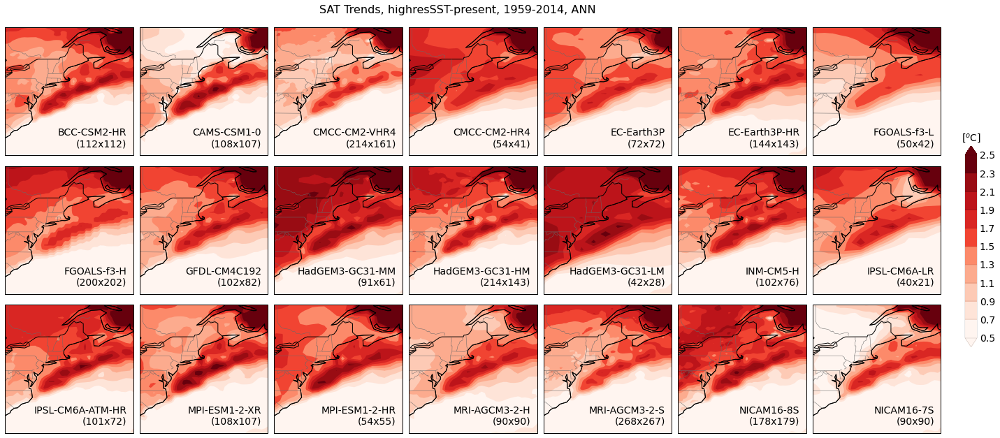

In [119]:
# ANN and JJA
tmpCube = hiresOrig_sea_trends_ann; periodName = '1959-2014'; snName = 'ANN'; clev1 = np.linspace( 0.5, 2.5, ncolors )
#tmpCube = hiresOrig_sea_trends_jja; periodName = '1959-2014'; snName = 'JJA'; clev1 = np.linspace( 1, 3, ncolors )

tmpMods = [cb.coord('realization').points[0] for cb in tmpCube]
tmpMods.sort(key=lambda x: x.split('-')[0])

ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
extend = 'both'; ft=14

fig = plt.figure(figsize=(24,10))
nr = 3; nc =7
for nn, mod in enumerate(tmpMods):
    cb = tmpCube.extract( iris.Constraint(realization=mod) )[0]
    ax = plt.subplot(nr, nc, nn+1, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
    transform = ccrs.PlateCarree()._as_mpl_transform(ax)
    cf = epsc( cb, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title='', ftsize=ft)
    ax.annotate('%s\n(%dx%d)' % (mod, cb.shape[0], cb.shape[1]), xy=(-61, 31), xycoords=transform, ha='right', va='bottom', fontsize=ft)
    utls.plotStates(ax)
    ax.set_extent(utls.reg2bbox['ENA'])
    
plt.suptitle('SAT Trends, highresSST-present, %s, %s' % (periodName, snName), fontsize=ft+2)

unit='[$^o$C]' # (%d-%d trends)' % (1961, 2015)    ##################################### <------------------------------ CHANGE THIS
cbar_ax = fig.add_axes([0.92, 0.3, 0.01, 0.4]); orient='horizontal'; rot=-360 if orient=='vertical' else 0   #[0.92, 0.2, 0.02, 0.5]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation='vertical', ticks=clev1, drawedges=True)
cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

del tmpCube, tmpMods, cb
plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.94)

saveFig = True
if saveFig:
    figName = 'Supp_Fig10'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, 'extra', figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, 'extra', figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

## Supplementary Figure 9<a id="Supp_Fig9"></a>

#### Calculate and plot historical trends

In [120]:
# ANN and JJA
histOrig_sea_trends_ann = iris.cube.CubeList()
histOrig_sea_trends_jja = iris.cube.CubeList()

for cube in cmip6_histOrig:
    #cube = hires.extract( iris.Constraint(realization=mod) )[0]
    # ===================
    pickedSeason = 'ANN'
    cube_sea0 = ensutils.calc_seasonal_mean_local(cube, pickedSeason, verbose=False)[1]

    cube_sea = ensutils.extract_years(cube_sea0, cmip6period[0], cmip6period[1])
    histOrig_sea_trends_ann.append( calc_single_cube_trends_local_linalg( cube_sea ) ); del cube_sea, cube_sea0

    # ===================
    pickedSeason = 'JJA'
    cube_sea0 = ensutils.calc_seasonal_mean_local(cube, pickedSeason, verbose=False)[1]

    cube_sea = ensutils.extract_years(cube_sea0, cmip6period[0], cmip6period[1])
    histOrig_sea_trends_jja.append( calc_single_cube_trends_local_linalg( cube_sea ) ); del cube_sea, cube_sea0

56
2.7089719772338867
56
2.2400200366973877
56
2.5755860805511475
56
2.0887668132781982
56
2.2229180335998535
56
1.4114749431610107
56
4.404173851013184
56
6.5643839836120605
56
1.8537330627441406
56
0.1523451805114746
56
6.212186098098755
56
9.968986749649048
56
4.748786211013794
56
5.573477029800415
56
4.213310956954956
56
7.0729079246521
56
3.9556400775909424
56
6.006659030914307
56
3.585062026977539
56
5.673435211181641
56
2.271066904067993
56
3.244741916656494
56
3.414396047592163
56
3.919226884841919
56
1.9571757316589355
56
0.15355706214904785
56
5.589255332946777
56
4.570759057998657
56
7.509252071380615
56
8.901949167251587
56
3.3072521686553955
56
0.18457674980163574
56
4.115655183792114
56
5.520463228225708
56
4.363907098770142
56
5.81101393699646
56
4.766668081283569
56
6.205681324005127
56
3.122936964035034
56
0.17801380157470703
56
3.0619382858276367
56
0.17572307586669922
56
2.2882630825042725
56
2.1853621006011963
56
12.350404977798462
56
13.321012258529663
56
2.0035212

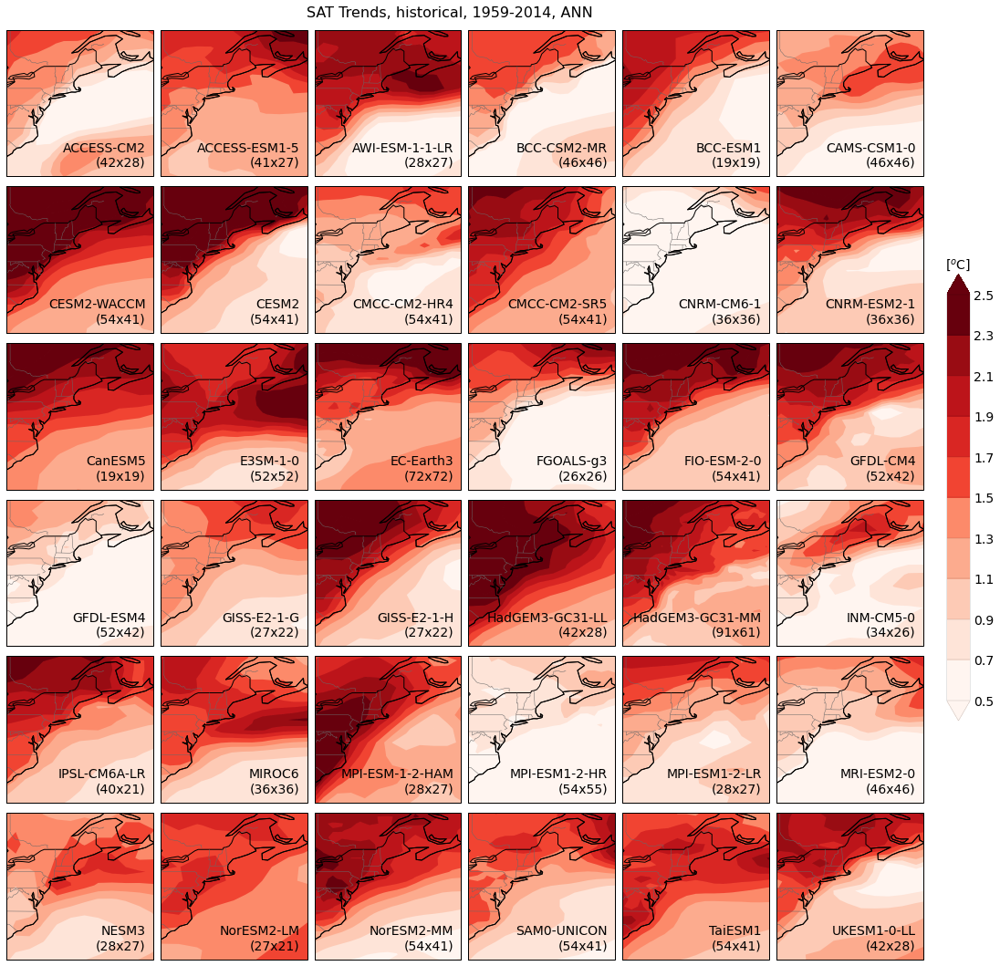

In [121]:
# ANN
tmpCube = histOrig_sea_trends_ann
plotPeriod = '1959-2014'

tmpMods = [cb.coord('realization').points[0] for cb in tmpCube]
tmpMods.sort(key=lambda x: x.split('-')[0])

ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
extend = 'both'; ft=14
clev1 = np.linspace( 0.5, 2.5, ncolors )

fig = plt.figure(figsize=(18,17))
nr = 6; nc = 6
for nn, mod in enumerate(tmpMods):
    cb = tmpCube.extract( iris.Constraint(realization=mod) )[0]
    ax = plt.subplot(nr, nc, nn+1, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
    transform = ccrs.PlateCarree()._as_mpl_transform(ax)
    cf = epsc( cb, ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title='', ftsize=ft)
    ax.annotate('%s\n(%dx%d)' % (mod, cb.shape[0], cb.shape[1]), xy=(-61, 31), xycoords=transform, ha='right', va='bottom', fontsize=ft)
    utls.plotStates(ax)
    ax.set_extent(utls.reg2bbox['ENA'])
    
plt.suptitle('SAT Trends, historical, %s, ANN' % plotPeriod, fontsize=ft+2)

unit='[$^o$C]' # (%d-%d trends)' % (1961, 2015)    ##################################### <------------------------------ CHANGE THIS
cbar_ax = fig.add_axes([0.92, 0.34, 0.02, 0.4]); orient='horizontal'; rot=-360 if orient=='vertical' else 0   #[0.92, 0.2, 0.02, 0.5]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation='vertical', ticks=clev1, drawedges=True)
cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

del tmpCube, tmpMods, cb
plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.96)

saveFig = True
if saveFig:
    figName = 'Supp_Fig9'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)

##### Regid both ensembles to be able to calcultae ensemble mean trends

In [122]:
# ================================================================
# Regrid historical data to 1.4x1.4 resoution (that of CNRM-ESM2-1)
cmip6_hist_gridded = {}
for season in ['ANN','JJA']:
    if season=='ANN': tmpCube = histOrig_sea_trends_ann
    if season=='JJA': tmpCube = histOrig_sea_trends_jja
    tmpCubeForRegrid = tmpCube.extract( iris.Constraint(realization='CNRM-ESM2-1') )[0]
    cmip6_hist_gridded_cl = iris.cube.CubeList()
    for cb in tmpCube:
        cb.attributes = {}
        cb.cell_methods = None
        coords = [crd.long_name for crd in cb.coords()] 
        if 'height' in coords: cb.remove_coord('height')
        cmip6_hist_gridded_cl.append( cb.regrid(tmpCubeForRegrid, iris.analysis.Nearest()) )
        del coords
        
    cmip6_hist_gridded_cl = cmip6_hist_gridded_cl.merge_cube()
    if season=='ANN': cmip6_hist_gridded.setdefault(season, cmip6_hist_gridded_cl)
    if season=='JJA': cmip6_hist_gridded.setdefault(season, cmip6_hist_gridded_cl)
    del cmip6_hist_gridded_cl, tmpCubeForRegrid, tmpCube
    
# ================================================================
# Regrid HighResMIP data to 1.4x1.4 resoution (that of MRI-AGCM3-2-H)
cmip6_hires_gridded = {}
for season in ['ANN','JJA']:
    if season=='ANN': tmpCube = hiresOrig_sea_trends_ann
    if season=='JJA': tmpCube = hiresOrig_sea_trends_jja
    tmpCubeForRegrid = tmpCube.extract( iris.Constraint(realization='MRI-AGCM3-2-H') )[0]
    tCoord = tmpCubeForRegrid.coord('time')
    cmip6_hires_gridded_cl = iris.cube.CubeList()
    for cb in tmpCube:
        cb.attributes = {}
        cb.cell_methods = None
        cb.var_name = 'tas'
        cb.remove_coord('time')
        cb.add_aux_coord(tCoord) # coord('time').var_name = 'time'
        cb.coord('realization').var_name = 'realization'
        coords = [crd.long_name for crd in cb.coords()] 
        if 'height' in coords: cb.remove_coord('height')
        cmip6_hires_gridded_cl.append( cb.regrid(tmpCubeForRegrid, iris.analysis.Nearest()) )
        del coords
        
    cmip6_hires_gridded_cl = cmip6_hires_gridded_cl.merge_cube()
    if season=='ANN': cmip6_hires_gridded.setdefault(season, cmip6_hires_gridded_cl)
    if season=='JJA': cmip6_hires_gridded.setdefault(season, cmip6_hires_gridded_cl)
    del cmip6_hires_gridded_cl, tmpCubeForRegrid, tmpCube

In [123]:
# Calculate ensemble mean trends
cmip6_hist_gridded_ensmean = {}
cmip6_hires_gridded_ensmean = {}

pickedSeason = 'ANN'
cmip6_hist_gridded_ensmean.setdefault(  pickedSeason, cmip6_hist_gridded[pickedSeason].collapsed('realization', iris.analysis.MEAN)  )
cmip6_hires_gridded_ensmean.setdefault( pickedSeason, cmip6_hires_gridded[pickedSeason].collapsed('realization', iris.analysis.MEAN) )

pickedSeason = 'JJA'
cmip6_hist_gridded_ensmean.setdefault(  pickedSeason, cmip6_hist_gridded[pickedSeason].collapsed('realization', iris.analysis.MEAN)  )
cmip6_hires_gridded_ensmean.setdefault( pickedSeason, cmip6_hires_gridded[pickedSeason].collapsed('realization', iris.analysis.MEAN) )

<iris 'Cube' of air_temperature / (celsius) (latitude: 90; longitude: 90)>

#### CESM-LENS

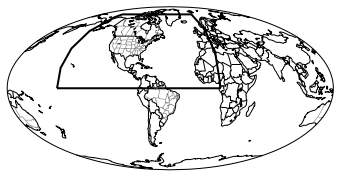

In [124]:
import cesmleUtils as leu
reload(leu)
reload(utls)

regLatLon = utls.reg2bbox['CONUSNAT']
utls.show_regBox(regLatLon)

In [125]:
# Load CESM-LE data
#cesmleDirRaw = '/Volumes/FreeAgent/CESM_LE-raw' #'/Users/akarma/Desktop/CESM_LE-raw'
cesmleDir    = '/Volumes/FreeAgent/CESM_LE-processed' #'/Users/akarma/Desktop/model_data/CESM_LE'

reload(leu)
reload(ensutils)
baseline = [1951, 1980]

var = 'tas'
# PICONTROL
le_tas_pic = leu.cesmle_data(var, control=True, years=None, mask=None, latlons=regLatLon, leDir=cesmleDir)
le_tas_pic.add_month()
le_tas_pic.add_year()
#le_tas_pic.applyMaskInPlace('land')

# HIST+RCP
le_tas     = leu.cesmle_data(var, years=None, mask=None, latlons=regLatLon, leDir=cesmleDir)
leClim_tas = ensutils.extract_years(le_tas.lens, baseline[0], baseline[1], calendarYear=True)
le_tas.add_month()
le_tas.add_year()
#le_tas.applyMaskInPlace('land')


USING: /Volumes/FreeAgent/CESM_LE-processed

---cesmleUtils.py: added a line here to change the calendar to work with extract_years
File Loaded: /Volumes/FreeAgent/CESM_LE-processed/tas/tas.pic.mon.CESM-LE.nc
File Loaded: /Volumes/FreeAgent/CESM_LE-processed/topo.CESM-LE.nc
File Loaded: /Volumes/FreeAgent/CESM_LE-processed/landfrc.CESM-LE.nc

USING: /Volumes/FreeAgent/CESM_LE-processed

---cesmleUtils.py: added a line here to change the calendar to work with extract_years
File Loaded: /Volumes/FreeAgent/CESM_LE-processed/tas/tas.mon.CESM-LE.nc
File Loaded: /Volumes/FreeAgent/CESM_LE-processed/topo.CESM-LE.nc
File Loaded: /Volumes/FreeAgent/CESM_LE-processed/landfrc.CESM-LE.nc


In [126]:
# Calculate seasonal means
reload(ensutils)
dummy = le_tas.lens.extract( utls.getLatLonCtr(utls.reg2bbox['ENA2']) ) #collapsed('realization', iris.analysis.MEAN) #calc_seasonal_mean()
dummy1 = ensutils.extract_years(dummy, cmip6period[0], cmip6period[1])
dummy_jja = ensutils.calc_seasonal_mean_local(dummy1, 'JJA', verbose=False)[1]
dummy_ann = ensutils.calc_seasonal_mean_local(dummy1, 'ANN', verbose=False)[1]
del dummy1

In [127]:
# Ensemble mean for seasonal meansC
cesmle_ensmean = {}
cesmle_ensmean.setdefault( 'JJA', dummy_jja.collapsed('realization', iris.analysis.MEAN) )
cesmle_ensmean.setdefault( 'ANN', dummy_ann.collapsed('realization', iris.analysis.MEAN) )

Reference Height Temperature (celsius),time,latitude,longitude
Shape,56,53,41
Dimension coordinates,,,
time,x,-,-
latitude,-,x,-
longitude,-,-,x
Auxiliary coordinates,,,
month_number,x,-,-
season_year,x,-,-
year,x,-,-
Scalar coordinates,,,


In [128]:
# Calculate ensembles mean trends
cesmle_ensmean_trends = {}
for season in ['ANN','JJA']:
    cbtr = calc_single_cube_trends_local_linalg( cesmle_ensmean[season] )
    cesmle_ensmean_trends.setdefault(season, cbtr)
    del cbtr

56
23.535987854003906
56
290.7300617694855


## Supplementary Figure 11<a id="Supp_Fig11"></a>

In [129]:
# Calculate trends for individual members
if False:
    lens_trendCube_jja = iris.cube.CubeList()
    for ii in np.arange(40):
        xdict = {}; xdict.setdefault('JJA', dummy_jja[ii])
        xtr, xp = calc_cube_trends_local_linalg(xdict, ['JJA'])
        lens_trendCube_jja.append(xtr)
        del xtr, xp, xdict

    lens_trendCube_ann = iris.cube.CubeList()
    for ii in np.arange(40):
        xdict = {}; xdict.setdefault('ANN', dummy_ann[ii])
        xtr, xp = calc_cube_trends_local_linalg(xdict, ['ANN'])
        lens_trendCube_ann.append(xtr)
        del xtr, xp, xdict
    
annlist = iris.cube.CubeList()
jjalist = iris.cube.CubeList()
for ii in np.arange(40):
    annlist.append( calc_single_cube_trends_local_linalg( dummy_ann[ii] ) )
    jjalist.append( calc_single_cube_trends_local_linalg( dummy_jja[ii] ) )

cesmle_trends = {}
cesmle_trends.setdefault('ANN', annlist)
cesmle_trends.setdefault('JJA', jjalist)

56
0.5435271263122559
56
2.49466872215271
56
0.33685302734375
56
2.5150132179260254
56
0.34926795959472656
56
2.4969427585601807
56
0.34393787384033203
56
2.4924988746643066
56
0.35346484184265137
56
2.4688210487365723
56
0.3388671875
56
2.4902830123901367
56
0.3548583984375
56
2.4608449935913086
56
0.3281841278076172
56
2.5285282135009766
56
0.3504209518432617
56
2.541027784347534
56
0.3316018581390381
56
2.453972101211548
56
0.349445104598999
56
2.500438928604126
56
0.36013007164001465
56
2.4830338954925537
56
0.32932090759277344
56
2.4976842403411865
56
0.3622879981994629
56
2.5852599143981934
56
0.35058093070983887
56
2.4453248977661133
56
0.38894104957580566
56
2.476001024246216
56
0.38375306129455566
56
2.4839279651641846
56
0.3582589626312256
56
2.5494630336761475
56
0.33565187454223633
56
2.4766290187835693
56
0.34653282165527344
56
2.460232734680176
56
0.34665822982788086
56
2.442304849624634
56
0.3442199230194092
56
2.5101940631866455
56
0.3643481731414795
56
2.50004816055297

[<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>,
<iris 'Cube' of Reference height temperature / (celsius) (latitude: 53; longitude: 41)>]

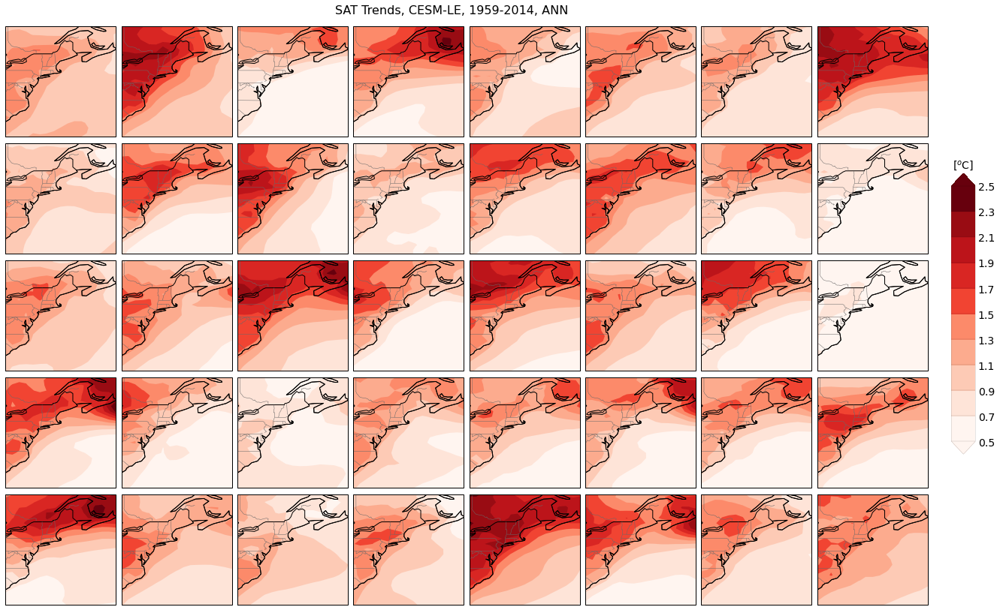

In [130]:
# Plot CESM-LE trends - ANN and JJA
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
extend = 'both'; ft=14
clev1 = np.linspace( 0.5, 2.5, ncolors )

for pickedSeason in ['ANN']:
    tmpCube = cesmle_trends[pickedSeason]
    
    fig = plt.figure(figsize=(22,13))
    nr = 5; nc = 8
    for nn in np.arange(len(tmpCube)):
        ax = plt.subplot(nr, nc, nn+1, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
        transform = ccrs.PlateCarree()._as_mpl_transform(ax)
        cf = epsc( tmpCube[nn], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title='', ftsize=ft)
        #ax.annotate('%s\n(%dx%d)' % (mod, cb.shape[0], cb.shape[1]), xy=(-61, 31), xycoords=transform, ha='right', va='bottom', fontsize=ft)
        utls.plotStates(ax)
        ax.set_extent(utls.reg2bbox['ENA'])

    plt.suptitle('SAT Trends, CESM-LE, 1959-2014, %s' % pickedSeason, fontsize=ft+2)

    unit='[$^o$C]' # (%d-%d trends)' % (1961, 2015)    ##################################### <------------------------------ CHANGE THIS
    cbar_ax = fig.add_axes([0.92, 0.34, 0.02, 0.4]); orient='horizontal'; rot=-360 if orient=='vertical' else 0   #[0.92, 0.2, 0.02, 0.5]
    cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation='vertical', ticks=clev1, drawedges=True)
    cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft)

    plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.95)

    saveFig = True
    if saveFig:
        figName = 'Supp_Fig11'        
        fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
        fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
        #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
        #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )
        
    del tmpCube

[Tope of Page](#outline)

### Top row of Fig. 5

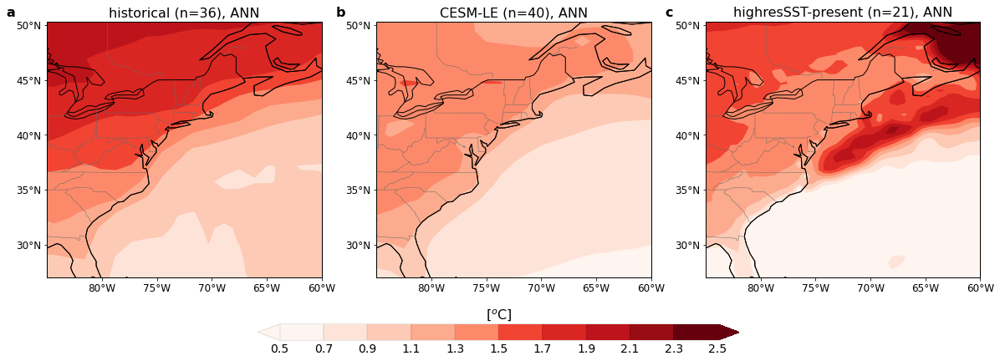

In [131]:
matplotlib.rcParams.update({'font.size': 12})
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
extend = 'both'; ft=16
clev1 = np.linspace( 0.5, 2.5, ncolors )
mapExtent = [-85,-60,27,50] #[-90,-56,25,52]

# =====================================
pickedSeason = 'ANN'
nr = 1; nc = 3; nn = 1
fig = plt.figure(figsize=(20, 9))

ax = plt.subplot(nr,nc,nn, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
tle = 'historical (n=%d), %s' % (cmip6_hist_gridded[pickedSeason].shape[0], pickedSeason)
cf = epsc( cmip6_hist_gridded_ensmean[pickedSeason], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title=tle, ftsize=ft )
utls.plotStates(ax); showlatlons(ax); ax.set_extent(mapExtent)
plt.title(r'$\bf{a}$', fontsize=ft, loc='left', x=-0.15)
nn+=1

ax = plt.subplot(nr,nc,nn, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
tle = 'CESM-LE (n=40), %s' % (pickedSeason)
cf = epsc( cesmle_ensmean_trends[pickedSeason], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title=tle, ftsize=ft )
utls.plotStates(ax); showlatlons(ax); ax.set_extent(mapExtent)
plt.title(r'$\bf{b}$', fontsize=ft, loc='left', x=-0.15)
nn+=1

ax = plt.subplot(nr,nc,nn, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
tle = 'highresSST-present (n=%d), %s' % (cmip6_hires_gridded[pickedSeason].shape[0], pickedSeason)
cf = epsc( cmip6_hires_gridded_ensmean[pickedSeason], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title=tle, ftsize=ft )
utls.plotStates(ax); showlatlons(ax); ax.set_extent(mapExtent)
plt.title(r'$\bf{c}$', fontsize=ft, loc='left', x=-0.15)

unit='[$^o$C]' # (%d-%d trends)' % (1961, 2015)    ##################################### <------------------------------ CHANGE THIS
cbar_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]); orient='horizontal'; rot=-360 if orient=='vertical' else 0   #[0.92, 0.2, 0.02, 0.5]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft-2)

saveFig = False
if saveFig:
    figName = 'Fig5'
    fig.savefig( os.path.join(figPath, 'extra', figName+'.png'),  dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, 'extra', figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, 'extra', figName+'.jpg'),  dpi=360, bbox_inches="tight" )

##### CMIP6 - NWS-interior NEUS differences

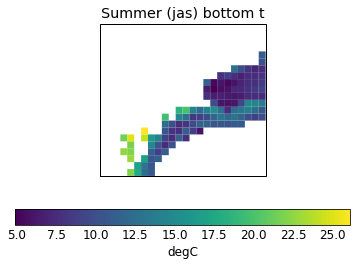

In [132]:
nws_mask = shelfCube.extract(regCtrNEBOX)
nws_mask_1dg  = nws_mask.regrid(neus_masks_coastal['best'], iris.analysis.Nearest())
nws_mask_05dg = nws_mask.regrid(neus_masks_coastal['cru'], iris.analysis.Nearest())

iplt.pcolor(nws_mask_05dg)

##### Old Supplementary Figure 14

In [133]:
# Old supplementary figure 14
if False:
    fig = plt.figure(figsize=(6, 6))
    #axi = plt.axes([0.33, 0.675, .2, .2], projection=ccrs.PlateCarree())
    axi = plt.subplot(111, projection=ccrs.PlateCarree())

    iCol = 'deepskyblue'
    cCol = 'red'
    oCol = 'blue'

    #axi = inset_axes(ax, width="30%", height="30%") #,projection=ccrs.PlateCarree())
    ncolors = 1; cols = [iCol, cCol, oCol] #; clev1 = np.arange()
    for rr, maskreg in enumerate([neus_masks_interior['cru'], neus_masks_coastal['cru'], nws_mask_05dg]):
        #cmap = cm.get_cmap(cols[rr], ncolors)
        cmap = matplotlib.colors.ListedColormap(cols[rr])
        iplt.pcolor(maskreg, cmap=cmap)
        #epsc(maskreg, axi, clev=clev1, cmap=cmap)
        axi.coastlines(linewidth=1) #0.2
        cb=plt.colorbar()
        cb.remove()
        plt.gcf().delaxes(plt.gcf().axes[1])

    axi.set_title('')
    utls.plotStates(axi)
    #axi.set_extent(utls.reg2bbox['NEBOX'])

    plt.text(-67, 39, 'Interior', color=iCol, fontsize=16, fontweight='bold', horizontalalignment='right', transform=ccrs.PlateCarree())
    plt.text(-67, 38, 'Coastal',  color=cCol, fontsize=16, fontweight='bold', horizontalalignment='right', transform=ccrs.PlateCarree())
    plt.text(-67, 37, 'NWS',      color=oCol, fontsize=16, fontweight='bold', horizontalalignment='right', transform=ccrs.PlateCarree())
    plt.title('Region masks', fontsize=16)

    saveFig = False
    if saveFig:
        figName = 'Supp_Fig14'
        fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
        fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
        #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
        #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

In [134]:
nhist   = len(histOrig_sea_trends_ann) #cmip6_hist_trends_diff.shape[0]
nhires  = len(hiresOrig_sea_trends_ann) #cmip6_hires_trends_diff.shape[0]
ncesmle = len(cesmle_trends['ANN']) #cesm_le_trends_diff.shape[0]

#### Calculate coastal-interior differences for two seasons

In [135]:
cmip6Period = [1959,2014]

In [136]:
# OBS
obs_trends_diff = {}
obs_trends_diff_o = {}
for sn in ['ANN','JJA']:
    dummy_dict = {}
    dummy_dict_o = {}
    # NCG
    tmp = ensutils.extract_years(tas_ncg_mon_anom.extract(regCtrNEBOX), cmip6Period[0], cmip6Period[1])
    tmp = ensutils.calc_seasonal_mean_local(tmp, sn, verbose=False)[1]
    ncg1_trends_SEA      = calc_single_cube_trends_local_linalg( tmp )
    ncg1_trends_c_aa_SEA = mylib.areaAverage( mylib.applyMask(ncg1_trends_SEA, neus_masks_coastal['ncg']) )
    ncg1_trends_i_aa_SEA = mylib.areaAverage( mylib.applyMask(ncg1_trends_SEA, neus_masks_interior['ncg']) )
    ncg1_trends_diff_SEA = ncg1_trends_c_aa_SEA - ncg1_trends_i_aa_SEA
    del tmp
    dummy_dict.setdefault('ncg', ncg1_trends_diff_SEA)

    # CRU
    tmp = ensutils.extract_years(tas_cru_mon_anom.extract(regCtrNEBOX), cmip6Period[0], cmip6Period[1])
    tmp = ensutils.calc_seasonal_mean_local(tmp, sn, verbose=False)[1]
    cru1_trends_SEA      = calc_single_cube_trends_local_linalg( tmp )
    cru1_trends_c_aa_SEA = mylib.areaAverage( mylib.applyMask(cru1_trends_SEA, neus_masks_coastal['cru']) )
    cru1_trends_i_aa_SEA = mylib.areaAverage( mylib.applyMask(cru1_trends_SEA, neus_masks_interior['cru']) )
    cru1_trends_diff_SEA = cru1_trends_c_aa_SEA - cru1_trends_i_aa_SEA
    del tmp
    dummy_dict.setdefault('cru', cru1_trends_diff_SEA)

    # BEST
    tmp = ensutils.extract_years(bestAnom.extract(regCtrNEBOX), cmip6Period[0], cmip6Period[1])
    tmp = ensutils.calc_seasonal_mean_local(tmp, sn, verbose=False)[1]
    ber1_trends_SEA      = calc_single_cube_trends_local_linalg( tmp )
    ber1_trends_c_aa_SEA = mylib.areaAverage( mylib.applyMask(ber1_trends_SEA, neus_masks_coastal['best']) )
    ber1_trends_i_aa_SEA = mylib.areaAverage( mylib.applyMask(ber1_trends_SEA, neus_masks_interior['best']) )
    ber1_trends_o_aa_SEA = mylib.areaAverage( mylib.applyMask(ber1_trends_SEA, nws_mask_1dg) )
    ber1_trends_diff_SEA   = ber1_trends_c_aa_SEA - ber1_trends_i_aa_SEA
    ber1_trends_diff_o_SEA = ber1_trends_o_aa_SEA - ber1_trends_i_aa_SEA
    del tmp
    dummy_dict.setdefault('best', ber1_trends_diff_SEA)
    dummy_dict_o.setdefault('best', ber1_trends_diff_o_SEA)

    # BEST
    tmp = ensutils.extract_years(data20cr_sea_anom_dict['tas'][sn].extract(regCtrNEBOX), cmip6Period[0], cmip6Period[1])
    cr201_trends_SEA      = calc_single_cube_trends_local_linalg( tmp )
    cr201_trends_c_aa_SEA = mylib.areaAverage( mylib.applyMask(cr201_trends_SEA, neus_masks_coastal['20cr']) )
    cr201_trends_i_aa_SEA = mylib.areaAverage( mylib.applyMask(cr201_trends_SEA, neus_masks_interior['20cr']) )
    tmp1 = cr201_trends_SEA.regrid(nws_mask_1dg, iris.analysis.Nearest())
    cr201_trends_o_aa_SEA = mylib.areaAverage( mylib.applyMask(tmp1, nws_mask_1dg) )
    cr201_trends_diff_SEA = cr201_trends_c_aa_SEA - cr201_trends_i_aa_SEA
    cr201_trends_diff_o_SEA = cr201_trends_o_aa_SEA - cr201_trends_i_aa_SEA
    del tmp, tmp1
    dummy_dict.setdefault('20cr', cr201_trends_diff_SEA)
    dummy_dict_o.setdefault('20cr', cr201_trends_diff_o_SEA)
    
    obs_trends_diff.setdefault(sn, dummy_dict)
    obs_trends_diff_o.setdefault(sn, dummy_dict_o)
    del dummy_dict, dummy_dict_o

55
37.24674892425537
56
0.008212089538574219
56
0.0070650577545166016
56
0.010040044784545898
56
28.03809690475464
56
0.011276960372924805
56
0.006192922592163086
56
0.008987903594970703


In [137]:
# CMIP6
cmip6_hist_trends_diff_sea = {}
cmip6_hires_trends_diff_sea = {}
cesm_le_trends_diff_sea = {}

cmip6_hist_trends_diff_o_sea = {}
cmip6_hires_trends_diff_o_sea = {}
cesm_le_trends_diff_o_sea = {}
for sn in ['ANN','JJA']:
    # Historical
    cmip6_hist_trends_SEA = cmip6_hist_gridded[sn].regrid(neus_masks_coastal['best'], iris.analysis.Nearest())
    cmip6_hist_trends_c_aa_SEA = mylib.areaAverage( mylib.applyMask(cmip6_hist_trends_SEA, neus_masks_coastal['best']) )
    cmip6_hist_trends_i_aa_SEA = mylib.areaAverage( mylib.applyMask(cmip6_hist_trends_SEA, neus_masks_interior['best']) )

    cmip6_hist_trends_o_SEA = cmip6_hist_gridded[sn].regrid(nws_mask_1dg, iris.analysis.Nearest())
    cmip6_hist_trends_o_aa_SEA = mylib.areaAverage( mylib.applyMask(cmip6_hist_trends_o_SEA, nws_mask_1dg) )

    # HighreResMIP
    cmip6_hires_trends_SEA = cmip6_hires_gridded[sn].regrid(neus_masks_coastal['cru'], iris.analysis.Nearest())
    cmip6_hires_trends_c_aa_SEA = mylib.areaAverage( mylib.applyMask(cmip6_hires_trends_SEA, neus_masks_coastal['cru']) )
    cmip6_hires_trends_i_aa_SEA = mylib.areaAverage( mylib.applyMask(cmip6_hires_trends_SEA, neus_masks_interior['cru']) )

    cmip6_hires_trends_o_SEA = cmip6_hires_gridded[sn].regrid(nws_mask_1dg, iris.analysis.Nearest())
    cmip6_hires_trends_o_aa_SEA = mylib.areaAverage( mylib.applyMask(cmip6_hires_trends_o_SEA, nws_mask_1dg) )

    # CESM-LE
    cesm_le_trends_merged_SEA = cesmle_trends[sn].merge_cube()
    cesm_le_trends_SEA = cesm_le_trends_merged_SEA.regrid(neus_masks_coastal['cru'], iris.analysis.Nearest())
    cesm_le_trends_c_aa_SEA = mylib.areaAverage( mylib.applyMask(cesm_le_trends_SEA, neus_masks_coastal['cru']) )
    cesm_le_trends_i_aa_SEA = mylib.areaAverage( mylib.applyMask(cesm_le_trends_SEA, neus_masks_interior['cru']) )

    cesm_le_trends_o_SEA = cesm_le_trends_merged_SEA.regrid(nws_mask_1dg, iris.analysis.Nearest())
    cesm_le_trends_o_aa_SEA = mylib.areaAverage( mylib.applyMask(cesm_le_trends_o_SEA, nws_mask_1dg) )
    
    # diff
    cmip6_hist_trends_diff_sea.setdefault(sn, cmip6_hist_trends_c_aa_SEA - cmip6_hist_trends_i_aa_SEA)
    cmip6_hires_trends_diff_sea.setdefault(sn, cmip6_hires_trends_c_aa_SEA - cmip6_hires_trends_i_aa_SEA)
    cesm_le_trends_diff_sea.setdefault(sn, cesm_le_trends_c_aa_SEA - cesm_le_trends_i_aa_SEA)
    
    cmip6_hist_trends_diff_o_sea.setdefault(sn, cmip6_hist_trends_o_aa_SEA - cmip6_hist_trends_i_aa_SEA)
    cmip6_hires_trends_diff_o_sea.setdefault(sn, cmip6_hires_trends_o_aa_SEA - cmip6_hires_trends_i_aa_SEA)
    cesm_le_trends_diff_o_sea.setdefault(sn, cesm_le_trends_o_aa_SEA - cesm_le_trends_i_aa_SEA)

##### Find similar models in different experiments

In [138]:
# Following models are versions persent in either two experiments

# Models with 'historical' simulations. Higher ocean resolution models are denoated by 1, others by 0
hist_set = ['BCC-CSM2-MR','CAMS-CSM1-0','CMCC-CM2-HR4','EC-Earth3','GFDL-CM4','HadGEM3-GC31-MM','INM-CM5-0','IPSL-CM6A-LR','MPI-ESM1-2-HR','MRI-ESM2-0']
hist_ocn_res  = [0,0,1,0,1,1,1,0,1,0]

# For models above, the following ones have highresSST-present counterpart at the exact same atmopshere model resolution (these AMIP-like so no ocean model)
hires_lr = [None,None,'CMCC-CM2-HR4','EC-Earth3P',None,'HadGEM3-GC31-MM',None,'IPSL-CM6A-LR','MPI-ESM1-2-HR',None ]

# For models above, the following ones have highresSST-present counterpart with HIGHER atmopshere model resolution (these AMIP-like so no ocean model)
hires_hr = ['BCC-CSM2-HR','CAMS-CSM1-0','CMCC-CM2-VHR4','EC-Earth3P-HR','GFDL-CM4C192','HadGEM3-GC31-HM','INM-CM5-H','IPSL-CM6A-ATM-HR','MPI-ESM1-2-XR','MRI-AGCM3-2-S']

print(len(hist_set))
print(len(hires_lr))
print(len(hires_hr))
print(len(hist_ocn_res))

# Create dictionaries
hist_sameHires = dict(zip(hist_set, hires_lr))
hist_highHires = dict(zip(hist_set, hires_hr))
hist_ocnRes    = dict(zip(hist_set, hist_ocn_res))

10
10
10
10


In [139]:
hist_hires_ocn_models = ['CMCC-CM2-HR4','GFDL-CM4','HadGEM3-GC31-MM','INM-CM5-0','MPI-ESM1-2-HR']
hires_counterparts = ['CMCC-CM2-VHR4','GFDL-CM4C192','HadGEM3-GC31-HM','INM-CM5-H','MPI-ESM1-2-XR']
hires_top5hires = ['MRI-AGCM3-2-S','FGOALS-f3-H','CMCC-CM2-HR4','NICAM16-8S','HadGEM3-GC31-HM']

## Figure 5<a id="Figure5"></a>

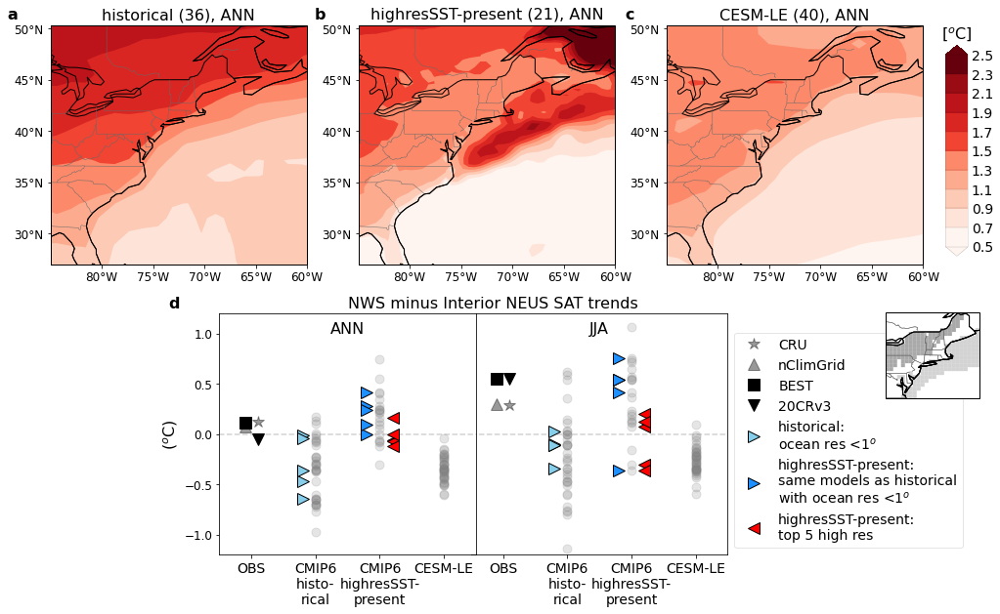

In [140]:
# Figure 5
matplotlib.rcParams.update({'font.size': 12})
ncolors = 11; col = 'Reds'; cmap = cm.get_cmap(col, ncolors)
extend = 'both'; ft=16
clev1 = np.linspace( 0.5, 2.5, ncolors )
mapExtent = [-85,-60,27,50] #[-90,-56,25,52]

# =====================================
pickedSeason = 'ANN'
nr = 2; nc = 3; nn = 1
fig = plt.figure(figsize=(16,10))

ax = plt.subplot(nr,nc,nn, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
tle = 'historical (%d), %s' % (cmip6_hist_gridded[pickedSeason].shape[0], pickedSeason)
cf = epsc( cmip6_hist_gridded_ensmean[pickedSeason], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title=tle, ftsize=ft )
utls.plotStates(ax); showlatlons(ax); ax.set_extent(mapExtent)
plt.title(r'$\bf{a}$', fontsize=ft, loc='left', ha='right', x=-0.125)
nn+=1

ax = plt.subplot(nr,nc,nn, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
tle = 'highresSST-present (%d), %s' % (cmip6_hires_gridded[pickedSeason].shape[0], pickedSeason)
cf = epsc( cmip6_hires_gridded_ensmean[pickedSeason], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title=tle, ftsize=ft )
utls.plotStates(ax); showlatlons(ax); ax.set_extent(mapExtent)
plt.title(r'$\bf{b}$', fontsize=ft, loc='left', ha='right', x=-0.125)
nn+=1

ax = plt.subplot(nr,nc,nn, projection=ccrs.PlateCarree()) #, projection=ccrs.Mollweide(central_longitude=-96)) 
tle = 'CESM-LE (%d), %s' % (ncesmle, pickedSeason)
cf = epsc( cesmle_ensmean_trends[pickedSeason], ax, clev=clev1, cmap=cmap, extend=extend, colorbar=False, pcolor=False, title=tle, ftsize=ft )
utls.plotStates(ax); showlatlons(ax); ax.set_extent(mapExtent)
plt.title(r'$\bf{c}$', fontsize=ft, loc='left', ha='right', x=-0.125)
nn+=1

unit='[$^o$C]' # (%d-%d trends)' % (1961, 2015)    ##################################### <------------------------------ CHANGE THIS
cbar_ax = fig.add_axes([0.15, 0.15, 0.3, 0.03]); orient='horizontal'; rot=-360 if orient=='vertical' else 0   #[0.92, 0.2, 0.02, 0.5]
cbar_ax = fig.add_axes([0.92, 0.55, 0.02, 0.3]); orient='vertical'; rot=-360 if orient=='vertical' else 0   #[0.92, 0.2, 0.02, 0.5]
cbar = plt.colorbar(cf, cax=cbar_ax, use_gridspec=True, orientation=orient, ticks=clev1, drawedges=True)
cbar.ax.set_title(unit, fontsize=ft, rotation=rot); cbar.outline.set_linewidth(0.1); cbar.dividers.set_linewidth(0.1); cbar.ax.tick_params(size=0, labelsize=ft-2)

# =====================================
msz=12
obsCol = 'k'
xlabels = ['OBS', 'CMIP6\nhisto-\nrical', 'CMIP6\nhighresSST-\npresent', 'CESM-LE']

diffcol = False
symoff=0.2

symcol = ['skyblue','forestgreen','darkorange','gold','chocolate']#,'forestgreen','red','magenta','chocolate']

for ss, plotSeason in enumerate(['JJA','ANN']):
    ax = plt.subplot(nr,nc,nn+1)
    plt.axhline(y=0, ls='--', color='lightgrey')
    plt.plot( 1.1, obs_trends_diff[plotSeason]['cru'].data,  '*', color=obsCol, ms=msz, mec='k', label='CRU', alpha=0.4 )
    plt.plot( 0.9, obs_trends_diff[plotSeason]['ncg'].data,  '^', color=obsCol, ms=msz, mec='k', label='nClimGrid', alpha=0.4 )
    plt.plot( 0.9, obs_trends_diff_o[plotSeason]['best'].data, 's', color=obsCol, ms=msz, mec='k', label='BEST' )
    plt.plot( 1.1, obs_trends_diff_o[plotSeason]['20cr'].data, 'v', color=obsCol, ms=msz, mec='k', label='20CRv3' )
    plt.plot( np.zeros(nhist)+2,   cmip6_hist_trends_diff_o_sea[plotSeason].data,  'o', color='grey', ms=msz-3, alpha=0.2 )
    plt.plot( np.zeros(nhires)+3,  cmip6_hires_trends_diff_o_sea[plotSeason].data, 'o', color='grey', ms=msz-3, alpha=0.2 )
    plt.plot( np.zeros(ncesmle)+4, cesm_le_trends_diff_o_sea[plotSeason].data,     'o', color='grey', ms=msz-3, alpha=0.2 )
    ax.set_ylim(-1.2, 1.2)
    ax.set_xlim(0.5, 4.5)
    ax.set_xticks([1,2,3,4])
    if ss==0: ax.set_yticklabels([])
    ax.set_xticklabels(xlabels, rotation=0, va='top', fontsize=ft-2)
    plt.text(2.5, 1, plotSeason, fontsize=ft, ha='center')
    
    for mm, mod in enumerate(hist_hires_ocn_models):
        modCtr = iris.Constraint(realization=mod)
        dpt = cmip6_hist_trends_diff_o_sea[plotSeason].extract(modCtr)
        
        if diffcol:
            plt.plot(2-symoff, dpt.data, '>', color=symcol[mm], ms=msz, mec='k', label=mod)
        else:
            if mod==hist_hires_ocn_models[0]:
                plt.plot(2-symoff, dpt.data, '>', color='skyblue', ms=msz, mec='k', label='historical:\nocean res <1$^o$')
            else:
                plt.plot(2-symoff, dpt.data, '>', color='skyblue', ms=msz, mec='k')
        del modCtr, dpt
        
    for mm, mod in enumerate(hires_counterparts):
        #print(mod)
        modCtr = iris.Constraint(realization=mod)
        dpt = cmip6_hires_trends_diff_o_sea[plotSeason].extract(modCtr)
        
        if diffcol:
            plt.plot(3-symoff, dpt.data, '>', color=symcol[mm], ms=msz, mec='k', label=mod)
        else:
            if mod==hires_counterparts[0]:
                plt.plot(3-symoff, dpt.data, '>', color='dodgerblue', ms=msz, mec='k', label='highresSST-present:\nsame models as historical\nwith ocean res <1$^o$')
            else:
                plt.plot(3-symoff, dpt.data, '>', color='dodgerblue', ms=msz, mec='k')
        del modCtr, dpt
        
    for mm, mod in enumerate(hires_top5hires):
        #print(mod)
        modCtr = iris.Constraint(realization=mod)
        dpt = cmip6_hires_trends_diff_o_sea[plotSeason].extract(modCtr)
        
        if mod==hires_top5hires[0]:
            plt.plot(3+symoff, dpt.data, '<', color='red', ms=msz, mec='k', label='highresSST-present:\ntop 5 high res')
        else:
            plt.plot(3+symoff, dpt.data, '<', color='red', ms=msz, mec='k')
        del modCtr, dpt
    
    bbox=plt.gca().get_position()
    if ss==0:
        offset=0.1
        ax.set_position([bbox.x0 + offset, bbox.y0, bbox.x1-bbox.x0, bbox.y1-bbox.y0])
    else:
        offset=0.15
        ax.set_position([bbox.x0 + offset, bbox.y0, bbox.x1-bbox.x0, bbox.y1-bbox.y0])
        plt.title(r'$\bf{d}$', fontsize=ft, loc='left', x=-0.2)
        plt.title('NWS minus Interior NEUS SAT trends', ha='left', fontsize=ft )
        plt.ylabel('($^o$C)', fontsize=ft)
        
    nn-=1
    
    if ss==0:
        #plt.legend(fontsize=ft-4, fancybox=True, framealpha=0.5, bbox_to_anchor=(0.35, 0.3), ncol=2)
        plt.legend(fontsize=ft-2, fancybox=True, framealpha=0.5, bbox_to_anchor=(1.0, 0.95), ncol=1)
        
#inset ========================
#axi = plt.axes([0.201, 0.215, .25, .25], projection=ccrs.PlateCarree())
axi = plt.axes([0.79, 0.22, .25, .25], projection=ccrs.PlateCarree())
iCol = 'darkgrey' #'orange' #'darkcyan' #'#FFC20A' #'deepskyblue'
cCol = 'red'
oCol = 'lightgrey' #'wheat' #'darkturquoise' #'#5d3a9b' #skyblue' #'blue'

#axi = inset_axes(ax, width="30%", height="30%") #,projection=ccrs.PlateCarree())
ncolors = 1; cols = [iCol, cCol, oCol] #[iCol, cCol, oCol]; clev1 = np.arange()
for rr, maskreg in enumerate([neus_masks_interior['cru'], neus_masks_coastal['cru'], nws_mask_05dg]):
    #cmap = cm.get_cmap(cols[rr], ncolors)
    if rr!=1:
        cmap = matplotlib.colors.ListedColormap(cols[rr])
        iplt.pcolor(maskreg, cmap=cmap)
        #epsc(maskreg, axi, clev=clev1, cmap=cmap)
        axi.coastlines(linewidth=1) #0.2
        cb=plt.colorbar()
        cb.remove()
        plt.gcf().delaxes(plt.gcf().axes[7])
    
axi.set_title('')
utls.plotStates(axi)
#axi.set_extent(utls.reg2bbox['NEBOX'])

#plt.text(-67, 39, 'Interior', color=iCol, fontsize=16, fontweight='bold', horizontalalignment='right', transform=ccrs.PlateCarree())
#plt.text(-67, 38, 'Coastal',  color=cCol, fontsize=16, fontweight='bold', horizontalalignment='right', transform=ccrs.PlateCarree())
#plt.text(-67, 37, 'NWS',      color=oCol, fontsize=16, fontweight='bold', horizontalalignment='right', transform=ccrs.PlateCarree())
#plt.title('Region masks', fontsize=16)
    
axi.set_title('')
utls.plotStates(axi)
        
saveFig = True
if saveFig:
    figName = 'Fig5'
    fig.savefig( os.path.join(figPath, figName+'.tiff'), dpi=360, bbox_inches="tight" )
    fig.savefig( os.path.join(figPath, figName+'.pdf'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.png'),  dpi=360, bbox_inches="tight" )
    #fig.savefig( os.path.join(figPath, figName+'.jpg'),  dpi=360, bbox_inches="tight" )

[Top of Page](#outline)